In [1]:
### import libraries

import pandas as pd
from pandas import DataFrame
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import os
import pycountry_convert as pc
import matplotlib.dates as mdates
import pandas_profiling

In [2]:
### function to create directories

def create_dir(dirName):
    try:
        os.mkdir(dirName)
        print("Directory: " , dirName ,  " created ") 
    except FileExistsError:
        print("Directory: " , dirName ,  " already exists")

In [3]:
### Create directories

directories = ['output','data']

for i in directories:
    create_dir(i)

Directory:  output  already exists
Directory:  data  already exists


In [4]:
### Import Databases

# Import Our World in Data latest database
mf_original = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv')
mf = mf_original
mf.to_csv('data/owid-covid-data.csv') #Save file locally

# Import 0xCGRT latest database
df_original = pd.read_csv('https://github.com/OxCGRT/covid-policy-tracker/raw/master/data/OxCGRT_latest.csv')
df = df_original
#Save file locally
df.to_csv('data/OxCGRT_latest.csv') #Save file locally

# Import Google latest database
gf_original = pd.read_csv('https://www.gstatic.com/covid19/mobility/Global_Mobility_Report.csv')
gf = gf_original
#Save file locally
df.to_csv('data/Global_Mobility_Report.csv') #Save file locally

# Change column names to match mf
df = df.rename(columns = {'CountryName' : 'location', 'Date' : 'date', 'ConfirmedCases': 'total_cases', 'ConfirmedDeaths' : 'total_deaths', 'CountryCode' : 'iso_code'})
gf = gf.rename(columns = {'country_region' : 'location', 'country_region_code' : 'iso_code'})

# Match date format
mf['date'] = pd.to_datetime(mf.date,format='%Y-%m-%d') 
df['date'] = pd.to_datetime(df.date,format='%Y%m%d')
gf['date'] = pd.to_datetime(gf.date,format='%Y-%m-%d') 

/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [5]:
### Correction

gf['iso_code'] = np.where((gf.location == 'Namibia'),'NA',gf.iso_code)
#gf[gf.location.isin(['Namibia'])]

#Delete 'International' and 'World' entries
mf.drop(mf[mf.location == 'World'].index, inplace=True)
mf.drop(mf[mf.location == 'International'].index, inplace=True)

# **Databases features**

List of all variables in the databases

In [6]:
### Our World in Data columns

# mf.dtypes

In [7]:
### Our World in Data Profile_report

mf_profile = mf.profile_report(title='Pandas Profiling Report')
mf_profile.to_file('report/Our World in Data_Profiling Report.html')

In [8]:
### 0xCGRT in Data columns

#df.dtypes

In [9]:
### 0xCGRT Profile_report

df_profile = df.profile_report(title='Pandas Profiling Report')
df_profile.to_file('report/0xCGRT_Profiling Report.html')

In [10]:
### Google Mobility columns

gf.dtypes

iso_code                                                      object
location                                                      object
sub_region_1                                                  object
sub_region_2                                                  object
metro_area                                                    object
iso_3166_2_code                                               object
census_fips_code                                             float64
date                                                  datetime64[ns]
retail_and_recreation_percent_change_from_baseline           float64
grocery_and_pharmacy_percent_change_from_baseline            float64
parks_percent_change_from_baseline                           float64
transit_stations_percent_change_from_baseline                float64
workplaces_percent_change_from_baseline                      float64
residential_percent_change_from_baseline                     float64
dtype: object

In [11]:
### Google Mobility Profile_report

gf_profile = gf.profile_report(title='Pandas Profiling Report')
gf_profile.to_file('report/Google_mobility_Profiling Report.html')

In [12]:
### Merge mf and df into a new database named 'merge'

merge = pd.merge(mf, df, how = 'left', on = ['location','date'], suffixes=('_left', '_right'))
merge = merge.sort_values(by=['location', 'date'], ascending=True)

# # Compare values
# merge['comp'] = np.where(merge["total_cases_left"] == merge["total_cases_right"], True, False)
# merge_temp = merge[merge['comp'] == False]
# merge_temp[['date', 'location', 'total_cases_left', 'total_cases_right', 'total_deaths_left', 'total_deaths_right', 'comp']].sample(20)

# Drop same columns
merge = merge.drop(['total_cases_right', 'total_deaths_right', 'iso_code_right', 'stringency_index'], axis=1)

# Rename columns
merge = merge.rename(columns = {'total_cases_left' : 'total_cases', 'total_deaths_left' : 'total_deaths',
                               'iso_code_left' : 'iso_code', 'StringencyIndex' : 'stringency_index'})

# Add death rate
merge['death_rate'] = merge['total_deaths'] / merge['total_cases']

# Save new database
#merge.to_csv('data/Merged.csv') #Save file locally
#merge.info()

# **Correlations**

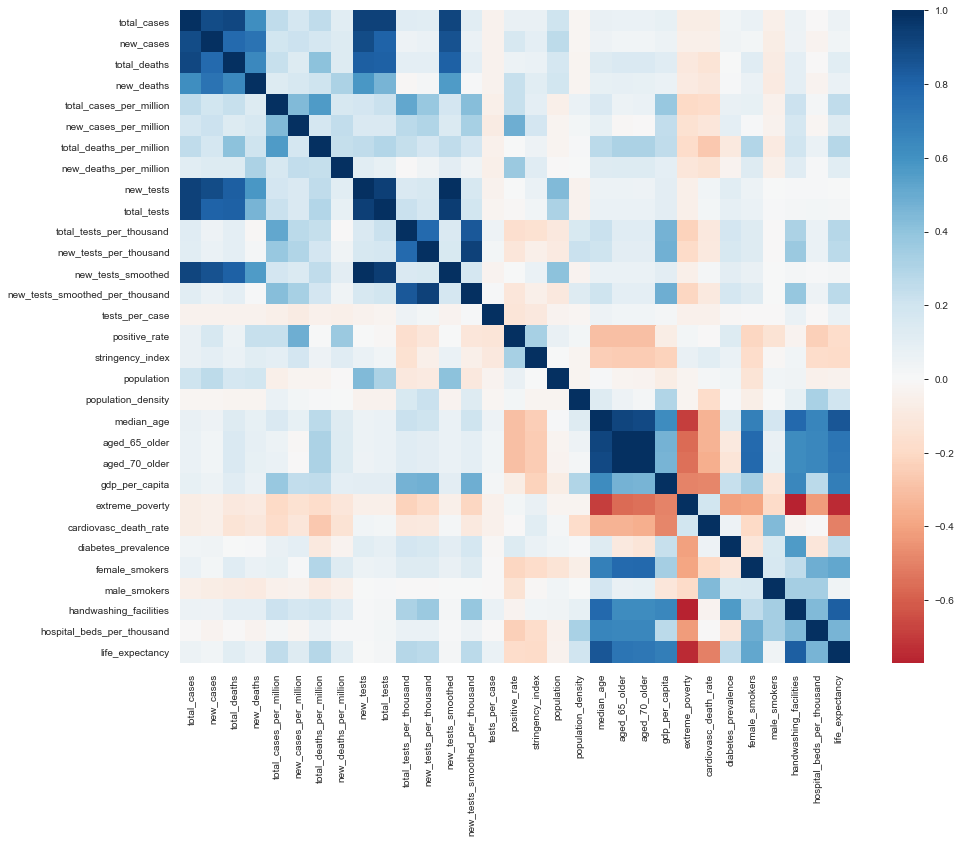

In [13]:
### Correlations

mf_corr = mf.corr()

# Heat map
fig, ax = plt.subplots(figsize=(15,12))
sns.heatmap(mf_corr, center=0, cmap="RdBu", ax=ax)
plt.savefig('output/Correlations_Our_world_in_data' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

In [14]:
### # Every relationship (slow rendering)

# plot = sns.pairplot(mf, height=2.5);
# plot.savefig("output/Pairplot_mf.png", format="PNG", dpi=300, bbox_inches='tight')

# **Average features per country**

Data is summarized by country. 

In [15]:
### Average features per country

# Import demographic index
demo = pd.read_csv('data/democratic_index.csv')

# Features
temp = merge
death_rate = temp.groupby(['location'])['death_rate'].mean()
gdp = temp.groupby(['location'])['gdp_per_capita'].mean()
pop_density = temp.groupby(['location'])['population_density'].mean()
max_deaths = temp.groupby(['location'])['total_deaths'].max()
max_cases = temp.groupby(['location'])['total_cases'].max()
max_cases_per_m = temp.groupby(['location'])['total_cases_per_million'].max()
max_deaths_per_m = temp.groupby(['location'])['total_deaths_per_million'].max()
pop = temp.groupby(['location'])['population'].max()
beds = temp.groupby(['location'])['hospital_beds_per_thousand'].max()
test = temp.groupby(['location'])['total_tests_per_thousand'].mean()
y65 = temp.groupby(['location'])['aged_65_older'].mean()
mean_stringency = temp.groupby(['location'])['stringency_index'].mean()
democratic_index = demo.groupby(['location'])['demo_score'].mean()

demo_str = pd.merge(democratic_index, mean_stringency, how='left', on = ['location'])

frame = {'death_rate': death_rate, 'gdp': gdp, 'pop_density': pop_density, 'max_cases': max_cases,
         'max_cases_per_m': max_cases_per_m, 'max_deaths': max_deaths, 'max_deaths_per_m': max_deaths_per_m,
         'pop': pop, 'beds': beds, 'test': test, 'y65': y65, 'mean_stringency': mean_stringency, 'democratic_index': democratic_index}   

countries_data = pd.DataFrame(frame)

# Remove countries with less than 1M people, 0 deaths, 0 death rate
countries_data = countries_data[(countries_data['pop'] >= 1000000)]
countries_data = countries_data[(countries_data['death_rate'] > 0)]
countries_data = countries_data[(countries_data['max_deaths'] > 0)]

countries_data.describe()

,death_rate,gdp,pop_density,max_cases,max_cases_per_m,max_deaths,max_deaths_per_m,pop,beds,test,y65,mean_stringency,democratic_index
count,151.000000,147.000000,148.000000,1.510000e+02,151.000000,151.000000,151.00000,1.510000e+02,132.00000,83.000000,148.000000,144.000000,144.000000
mean,0.033792,18456.288633,198.098716,1.311482e+05,3278.766616,4840.052980,95.16255,5.102210e+07,2.93875,30.993055,8.898926,59.933514,5.453542
std,0.030748,19167.389126,676.693695,5.154709e+05,5261.337765,17344.687657,160.06217,1.660852e+08,2.47952,38.079780,6.487178,16.432206,2.451433
min,0.000363,661.240000,3.078000,2.140000e+02,6.616000,1.000000,0.08400,1.160164e+06,0.10000,0.595883,1.144000,8.654398,0.000000
25%,0.011873,3756.222500,35.811250,2.720000e+03,299.035500,62.500000,5.85400,5.440442e+06,1.10000,4.286357,3.164500,48.575618,3.485000
50%,0.028066,12236.706000,81.006000,1.462600e+04,1042.684000,256.000000,20.71500,1.189078e+07,2.21000,17.727644,6.335500,59.561689,5.695000
75%,0.042215,27012.304500,150.214000,7.028150e+04,4181.610500,1675.000000,100.63200,3.779438e+07,4.20250,48.492901,14.753250,72.626526,7.445000
max,0.201325,116935.600000,7915.731000,5.044864e+06,39203.279000,162938.000000,851.79700,1.439324e+09,13.05000,215.009521,27.049000,97.198926,9.870000


In [16]:
### Countries_data Profile_report

countries_data_profile = countries_data.profile_report(title='Pandas Profiling Report')
countries_data_profile.to_file('report/Countries_data_Profiling Report.html')

In [17]:
### 10 worst fatality rates

worst = countries_data.sort_values(by=['death_rate'], ascending=[False]).head(10)
worst

,death_rate,gdp,pop_density,max_cases,max_cases_per_m,max_deaths,max_deaths_per_m,pop,beds,test,y65,mean_stringency,democratic_index
Yemen,0.201325,1479.147,53.508,1804.0,60.484,515.0,17.267,29825968.0,0.70,NaN,2.922,50.444286,1.95
Sudan,0.129722,4466.507,23.258,11894.0,271.247,773.0,17.629,43849269.0,0.80,NaN,3.548,79.924828,2.70
France,0.126507,38605.671,122.578,197921.0,3032.179,30324.0,464.568,65273512.0,5.98,NaN,19.718,49.386396,8.12
Nicaragua,0.113437,5321.444,51.667,3902.0,589.021,123.0,18.567,6624554.0,0.90,NaN,5.445,12.509586,1.25
Belgium,0.108553,42658.576,375.564,74059.0,6390.117,9872.0,851.797,11589616.0,5.64,64.706497,18.571,47.481267,7.64
Italy,0.107827,35220.084,205.859,250566.0,4144.202,35205.0,582.268,60461828.0,3.18,45.389257,23.021,54.870136,7.52
United Kingdom,0.105736,39753.244,272.898,310825.0,4578.632,46574.0,686.062,67886004.0,2.54,60.835221,18.517,47.087639,8.52
Hungary,0.104966,26777.561,108.043,4696.0,486.111,602.0,62.317,9660350.0,7.02,16.633316,18.577,61.335203,8.75
Netherlands,0.100142,48472.545,508.544,58564.0,3417.825,6157.0,359.326,17134873.0,3.32,24.018857,18.779,42.497546,9.01
Philippines,0.097586,7599.188,351.873,129913.0,1185.542,2270.0,20.715,109581085.0,1.00,4.695087,4.803,64.928726,6.64


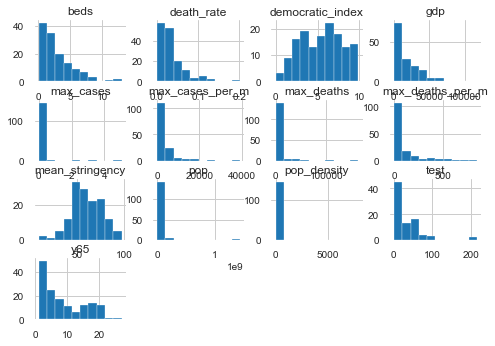

In [18]:
### Histograms

t = countries_data.sort_values(by=['max_cases_per_m'], ascending=[False]).hist()

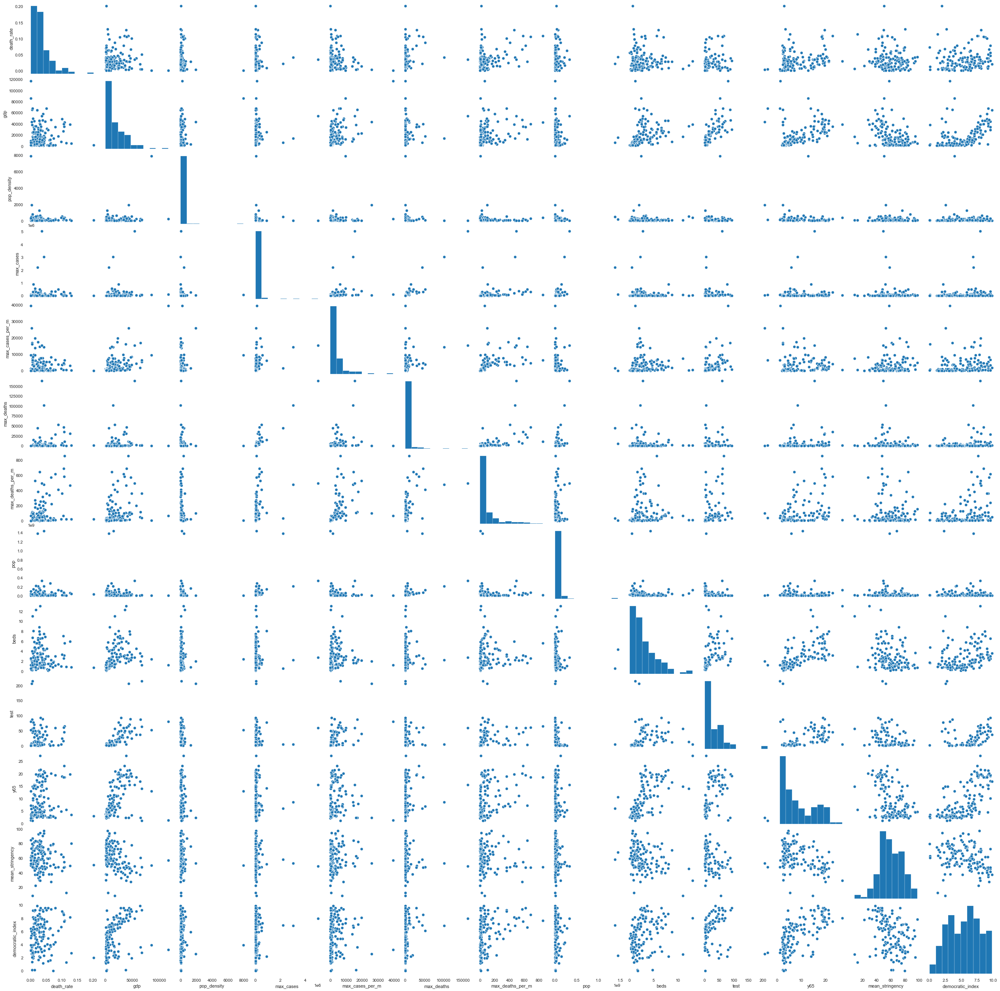

In [19]:
sns.pairplot(countries_data, height=2.5);

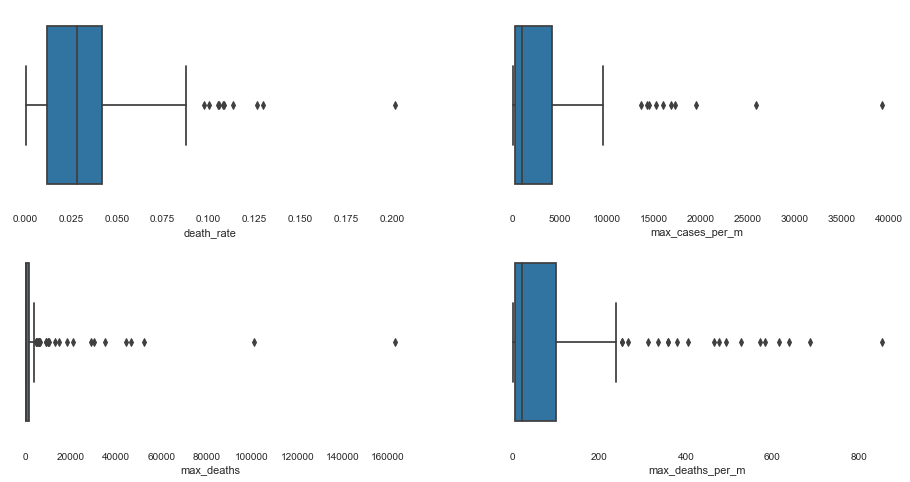

In [20]:
### Plot Countries feature variance

plt.figure(figsize=(16, 8))

# linear
plt.subplot(221)
sns.boxplot(x='death_rate', data=countries_data)

# linear
plt.subplot(222)
sns.boxplot(x='max_cases_per_m', data=countries_data)

# linear
plt.subplot(223)
sns.boxplot(x='max_deaths', data=countries_data)

# linear
plt.subplot(224)
sns.boxplot(x='max_deaths_per_m', data=countries_data)

plt.savefig('output/Countries_data_describe' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

# **Average features per continent**

Let's check the differences between continent


In [21]:
### Average features per continent

temp = merge
death_rate = temp.groupby(['continent'])['death_rate'].mean()
gdp = temp.groupby(['continent'])['gdp_per_capita'].mean()
pop_density = temp.groupby(['continent'])['population_density'].mean()
max_deaths = temp.groupby(['continent'])['total_deaths'].max()
max_cases = temp.groupby(['continent'])['total_cases'].max()
max_cases_per_m = temp.groupby(['continent'])['total_cases_per_million'].max()
max_deaths_per_m = temp.groupby(['continent'])['total_deaths_per_million'].max()
pop = temp.groupby(['continent'])['population'].max()
beds = temp.groupby(['continent'])['hospital_beds_per_thousand'].max()
y65 = temp.groupby(['continent'])['aged_65_older'].mean()

frame = []
frame = {'death_rate': death_rate, 'gdp': gdp, 'pop_density': pop_density, 'max_cases': max_cases, 'max_cases_per_m': max_cases_per_m, 'max_deaths': max_deaths, 'max_deaths_per_m': max_deaths_per_m, 'pop': pop, 'beds': beds, 'y65': y65} 
continents_data = pd.DataFrame(frame)

continents_data.describe()

,death_rate,gdp,pop_density,max_cases,max_cases_per_m,max_deaths,max_deaths_per_m,pop,beds,y65
count,6.000000,6.000000,6.000000,6.000000e+00,6.000000,6.000000,6.000000,6.000000e+00,6.000000,6.000000
mean,0.031354,21067.499439,265.022986,1.960640e+06,18170.986167,60941.666667,474.345500,3.934100e+08,7.965000,9.489282
std,0.010777,10161.426302,253.793541,1.876590e+06,12460.117820,61194.836039,432.556018,5.219597e+08,4.316729,4.762546
min,0.017279,5679.044337,25.866824,2.108400e+04,2476.553000,295.000000,34.748000,2.549988e+07,3.840000,3.728991
25%,0.022864,15963.420274,75.424671,6.417775e+05,11395.904500,18902.500000,198.351250,1.609857e+08,5.200000,7.087035
50%,0.032806,22990.990505,178.554184,1.551305e+06,18389.797000,45480.000000,379.597000,2.093495e+08,6.050000,9.170198
75%,0.040186,25292.512159,432.498289,2.830335e+06,20723.862250,87430.250000,602.382250,3.013918e+08,11.362500,10.259688
max,0.043038,35063.388380,648.968233,5.044864e+06,39203.279000,162938.000000,1237.551000,1.439324e+09,13.800000,17.850804


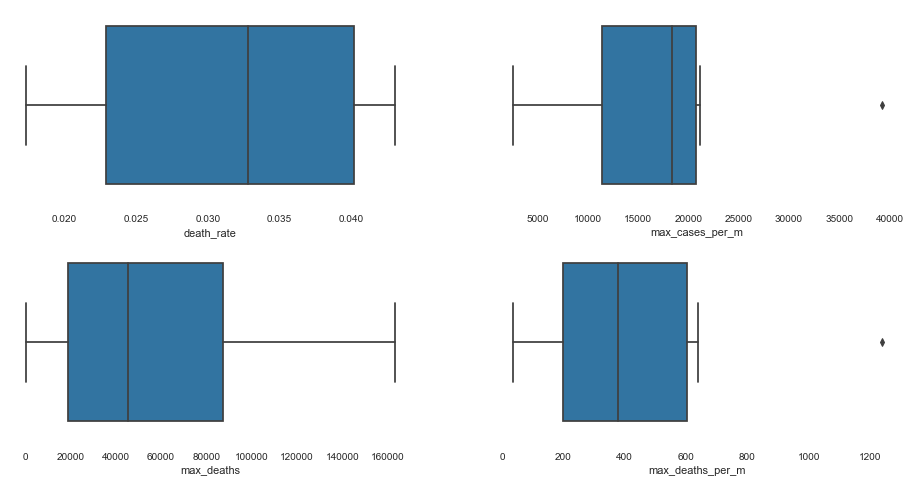

In [22]:
### plot Continents feature variance

plt.figure(figsize=(16, 8))

# linear
plt.subplot(221)
sns.boxplot(x='death_rate', data=continents_data)

# linear
plt.subplot(222)
sns.boxplot(x='max_cases_per_m', data=continents_data)

# linear
plt.subplot(223)
sns.boxplot(x='max_deaths', data=continents_data)

# linear
plt.subplot(224)
sns.boxplot(x='max_deaths_per_m', data=continents_data)

plt.savefig('output/Continents_data_describe' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

# **Overall situation**


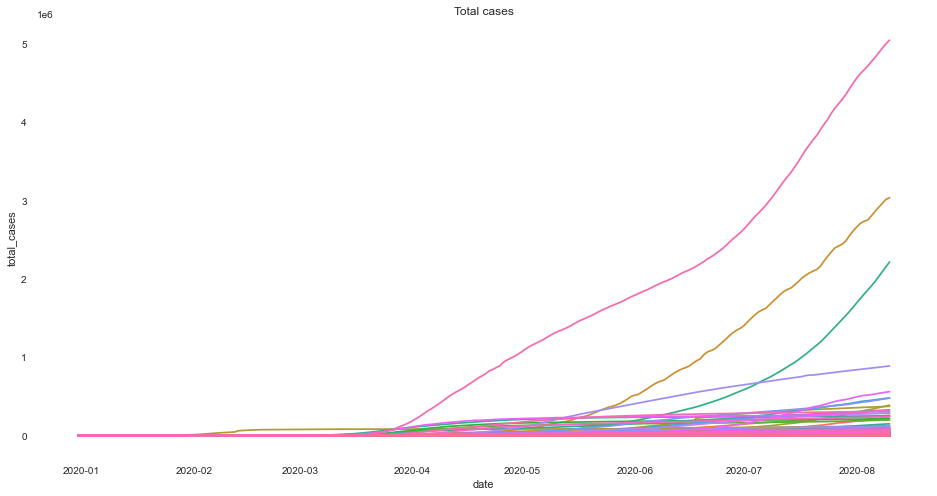

In [23]:
### Total cases with or without lockdown

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=merge, x="date", y="total_cases", hue='location', estimator='mean', legend=None)

#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(10, 100000))
#ax.set(xscale='log')
#ax.set(yscale='log')

plt.title('Total cases') 
plt.savefig('output/Total_cases_vs_Stay_at_home_' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

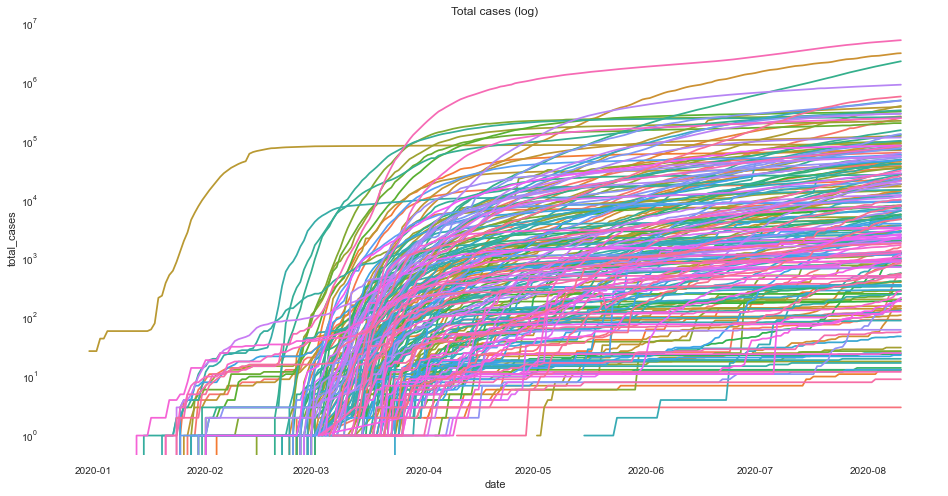

In [24]:
### Total cases (log)

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=mf, x="date", y="total_cases", hue='location', estimator='mean', legend=None)

#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(None, None))
#ax.set(xscale='log')

ax.set(yscale='log')
plt.title('Total cases (log)') 
plt.savefig('output/Total_cases_log' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

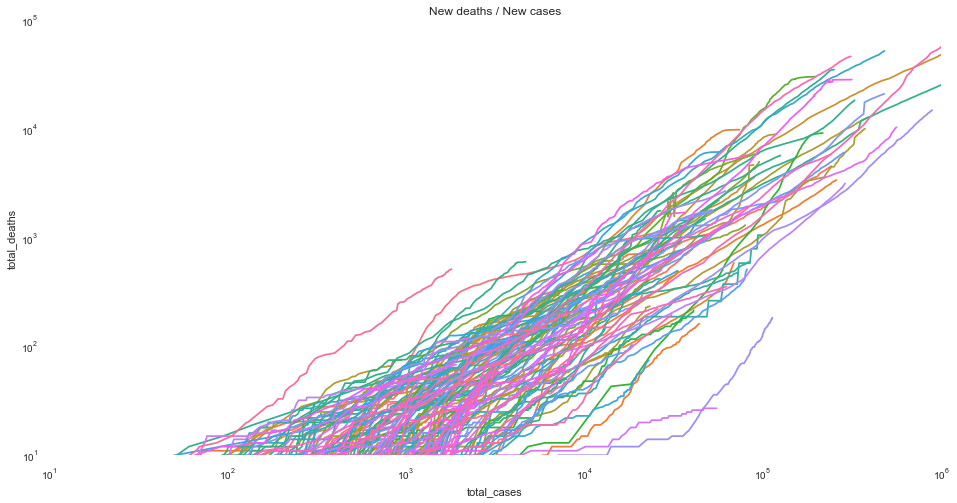

In [25]:
### New cases vs new deaths

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=merge, x="total_cases", y="total_deaths", hue='location', estimator='mean', legend=None)

ax.set(xlim=(10, 1000000))
ax.set(ylim=(10, 100000))
ax.set(xscale='log')
ax.set(yscale='log')
plt.title('New deaths / New cases')
plt.savefig('output/New_cases_vs_new_deaths' + '.png', format="PNG", dpi=300, bbox_inches='tight')
#plt.show()

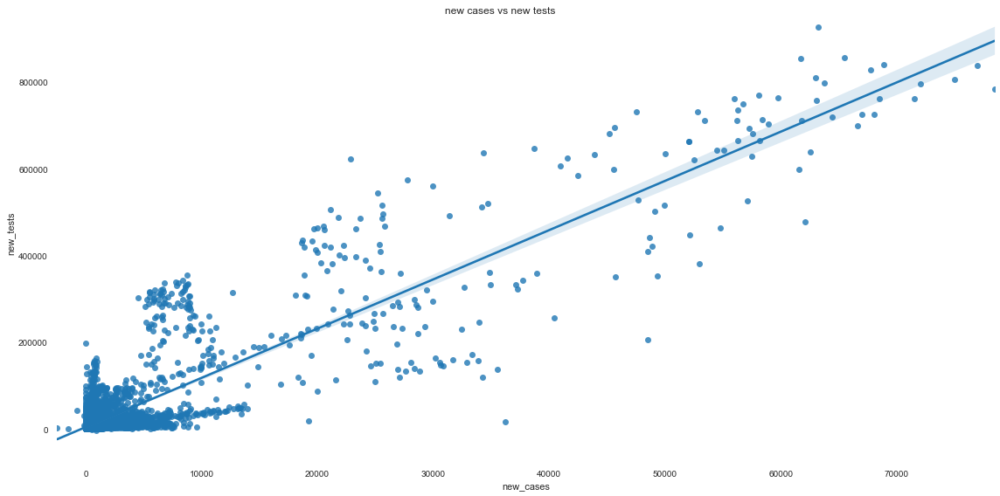

In [26]:
### New cases vs new tests

g = sns.lmplot(data=mf, x="new_cases", y='new_tests', height=8, aspect=2,
                  legend_out=False)
g.fig.suptitle("new cases vs new tests")
plt.savefig('output/New_cases_vs_new_tests.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

## **Selection of countries to compare between**


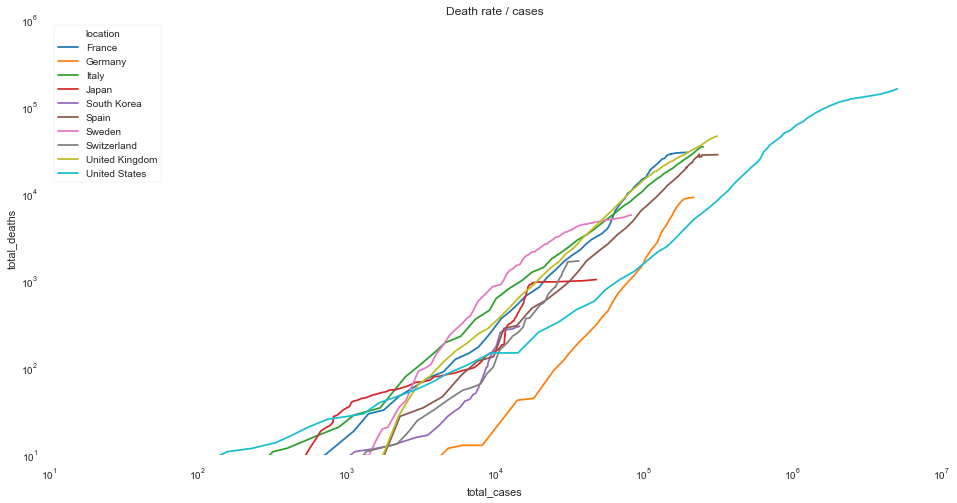

In [27]:
### Country Total cases vs total deaths

countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea', 'Japan']

temp = merge[merge.location.isin(countries1)]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp, x="total_cases", y="total_deaths", hue='location')
ax.set(xlim=(10, 10000000))
ax.set(ylim=(10, 1000000))
ax.set(xscale='log')
ax.set(yscale='log')
plt.title('Death rate / cases')
plt.savefig('output/Death_rate_vs_cases_countries' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

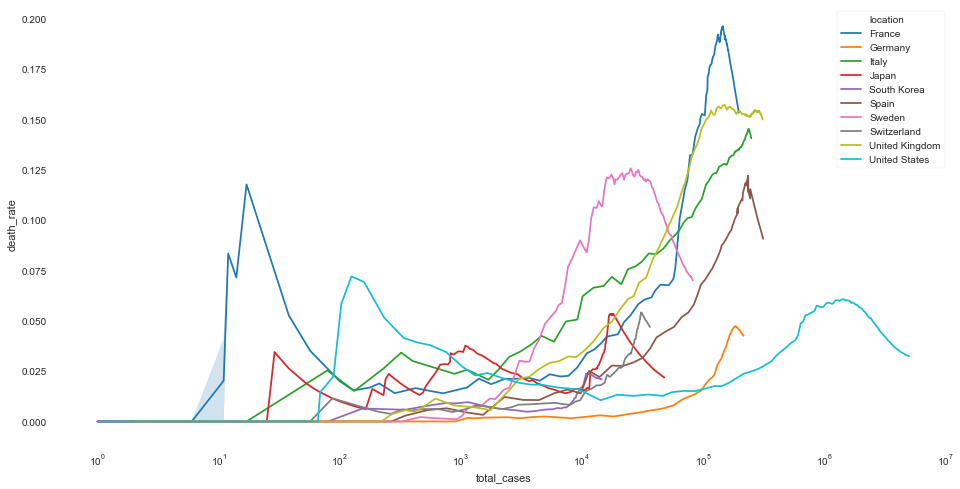

In [28]:
### Total cases vs death rate

countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea', 'Japan']

temp = []
temp = merge[merge.location.isin(countries1)]

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp, x="total_cases", y="death_rate", hue='location', estimator='mean')

#axis
ax.set(xscale='log')

plt.savefig('output/Total_cases_vs_death_rate' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

# Stringency Indexes

## Individual situation

Type of measures indicated.

United States


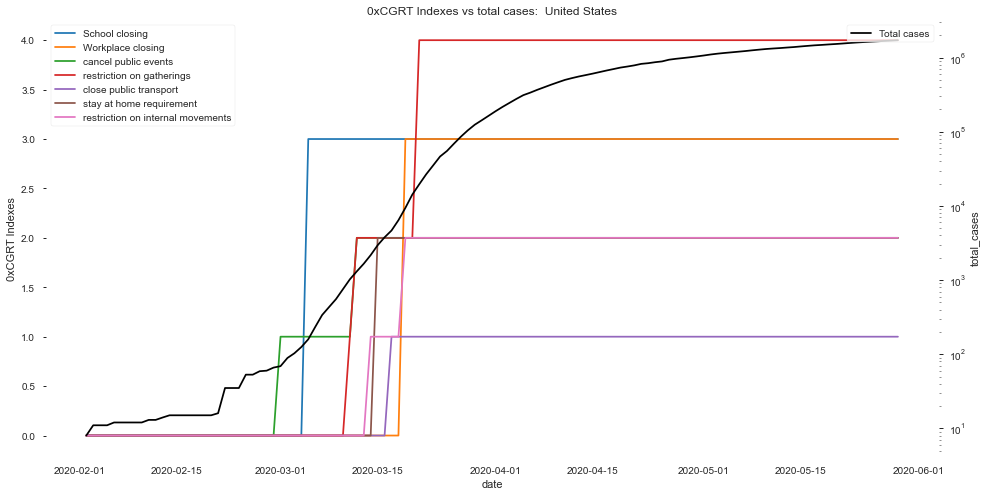

France


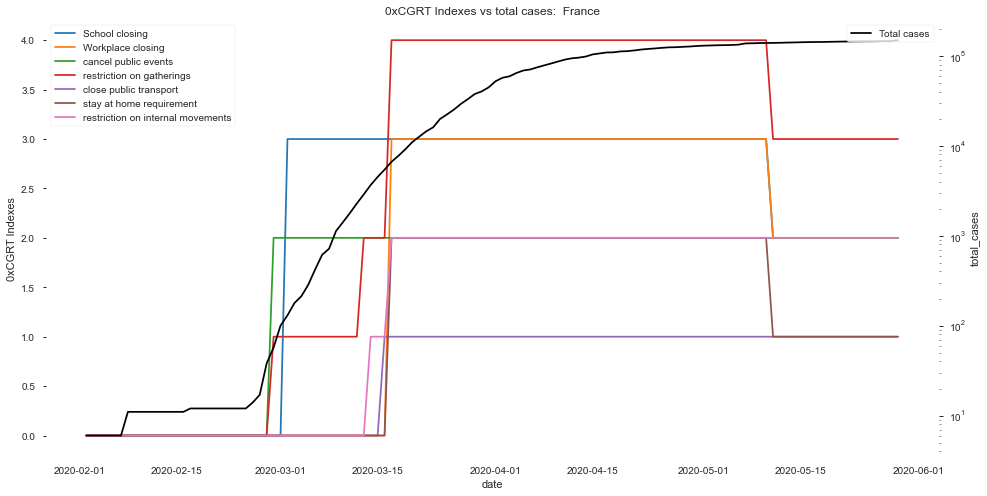

Spain


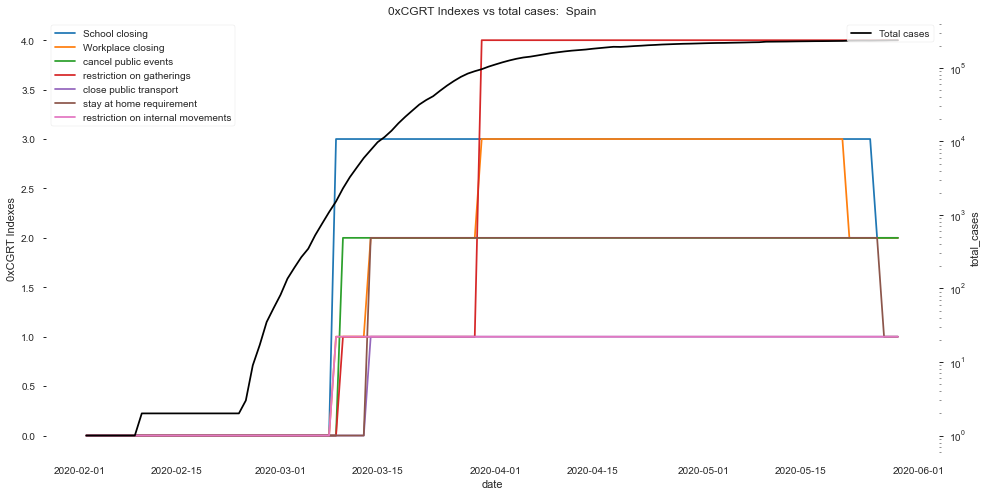

Switzerland


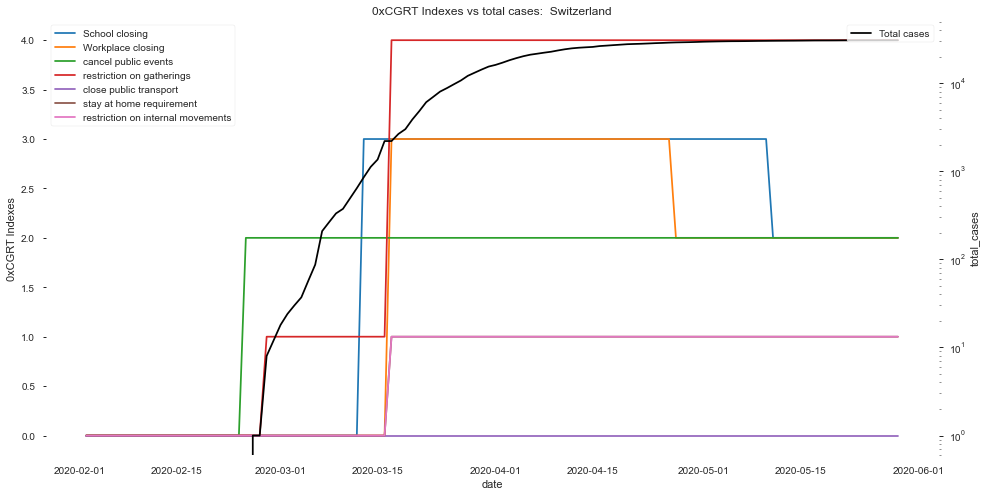

Sweden


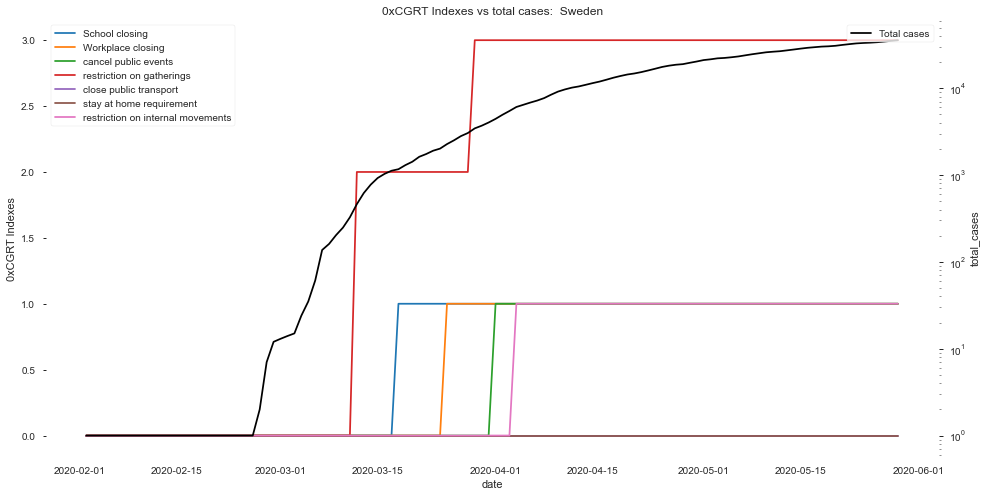

Italy


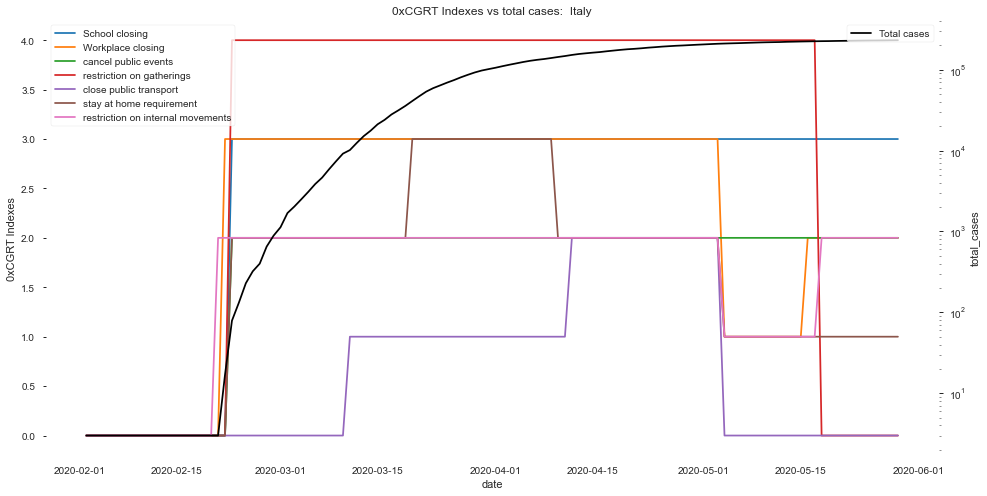

United Kingdom


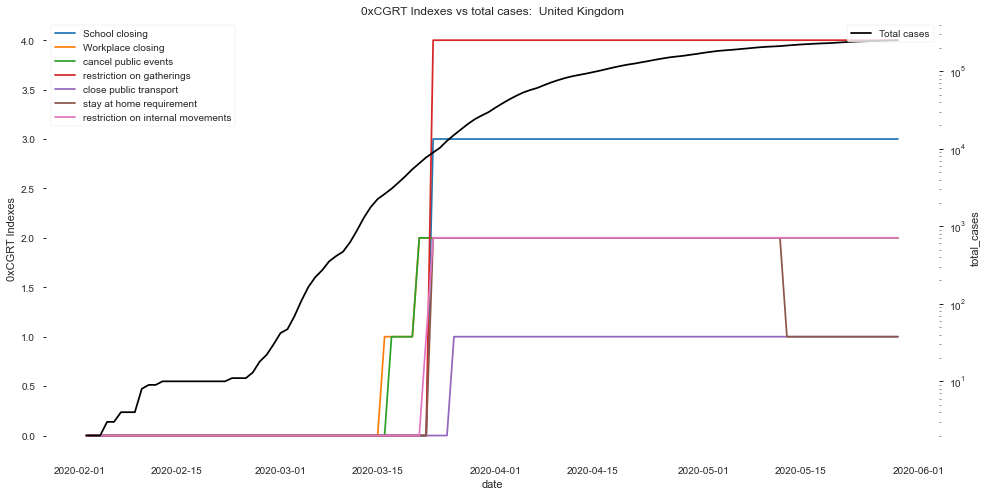

Germany


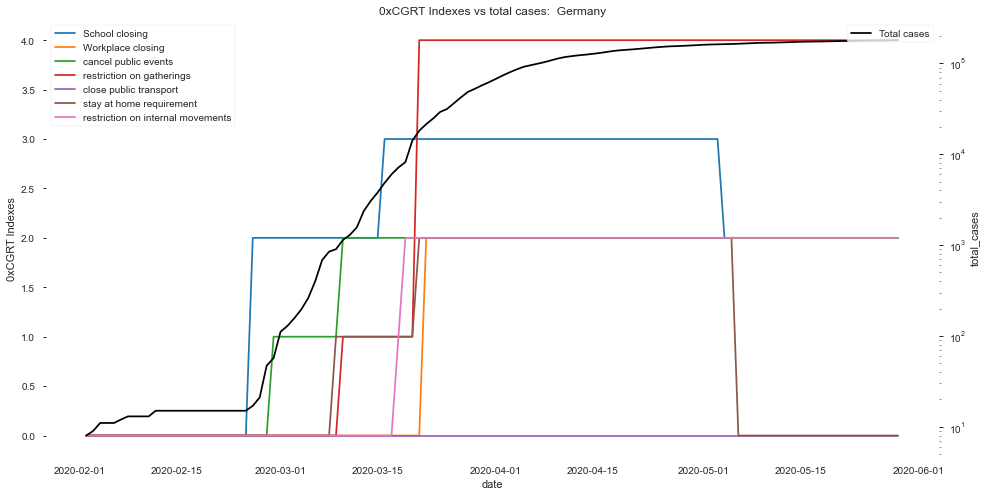

South Korea


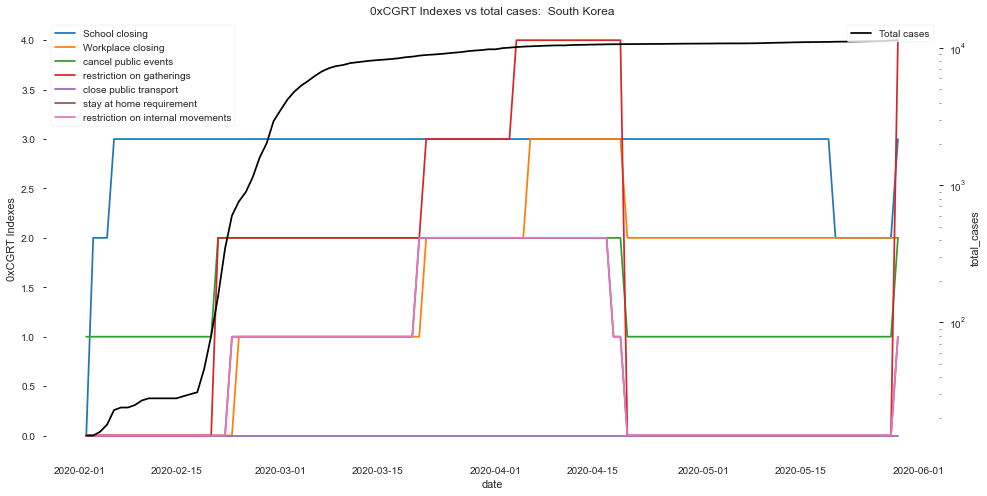

In [29]:
### Comparison 0xCGRT indexes vs cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-05-30'

for country in countries1:
    print(country)
    temp2 = []
    temp2 = merge[merge.location.isin([country])]
    temp2 = temp2[(temp2['date'] > dstart ) & (temp2['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="C1_School closing", label='School closing')
    ax = sns.lineplot(data=temp2, x="date", y="C2_Workplace closing", label='Workplace closing')
    ax = sns.lineplot(data=temp2, x="date", y="C3_Cancel public events", label='cancel public events')
    ax = sns.lineplot(data=temp2, x="date", y="C4_Restrictions on gatherings", label='restriction on gatherings')
    ax = sns.lineplot(data=temp2, x="date", y="C5_Close public transport", label='close public transport')
    ax = sns.lineplot(data=temp2, x="date", y="C6_Stay at home requirements", label='stay at home requirement')
    ax = sns.lineplot(data=temp2, x="date", y="C7_Restrictions on internal movement", label='restriction on internal movements')
    plt.ylabel('0xCGRT Indexes')
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="total_cases", label='Total cases', color='black')
    ax2.set(yscale='log')
    plt.legend(loc=1)

    #ax.set(xlim=(10, 1000000))
    plt.title('0xCGRT Indexes vs total cases:  ' + country)
    plt.savefig('output/Stringency_vs_cases_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

United States


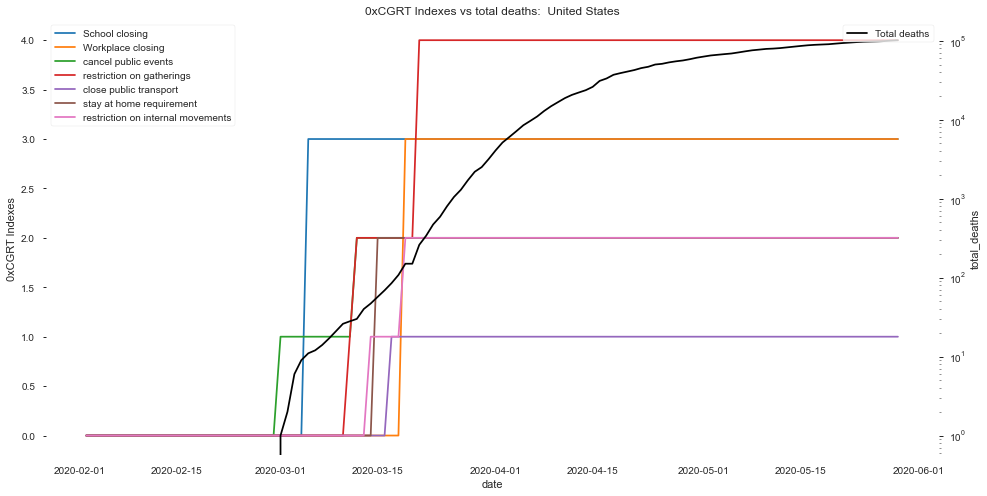

France


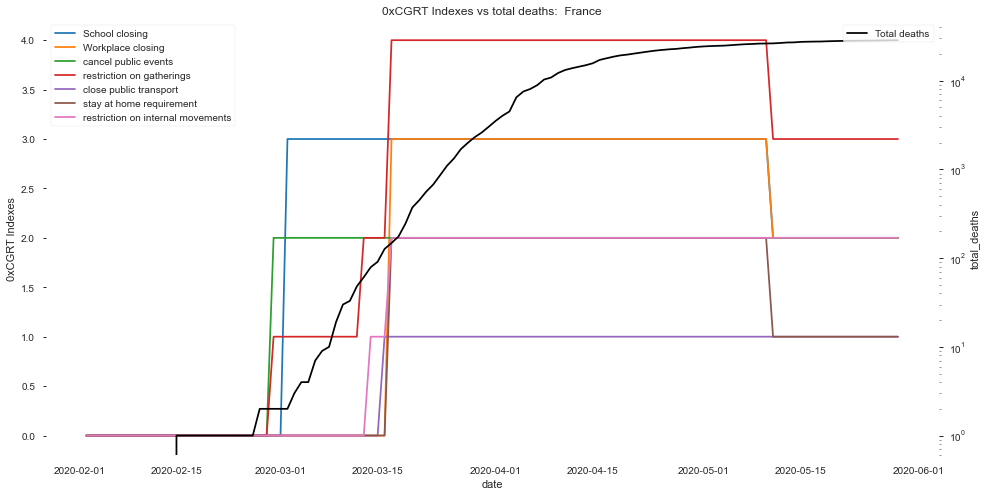

Spain


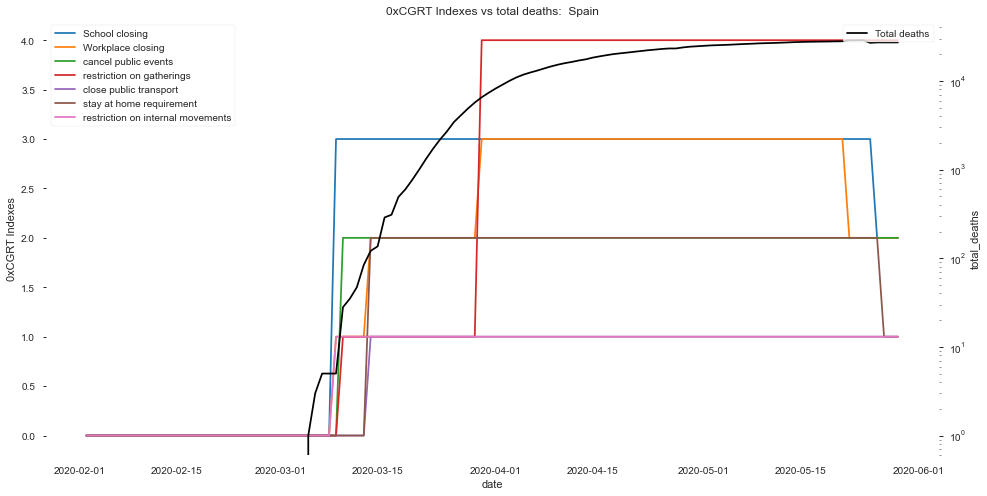

Switzerland


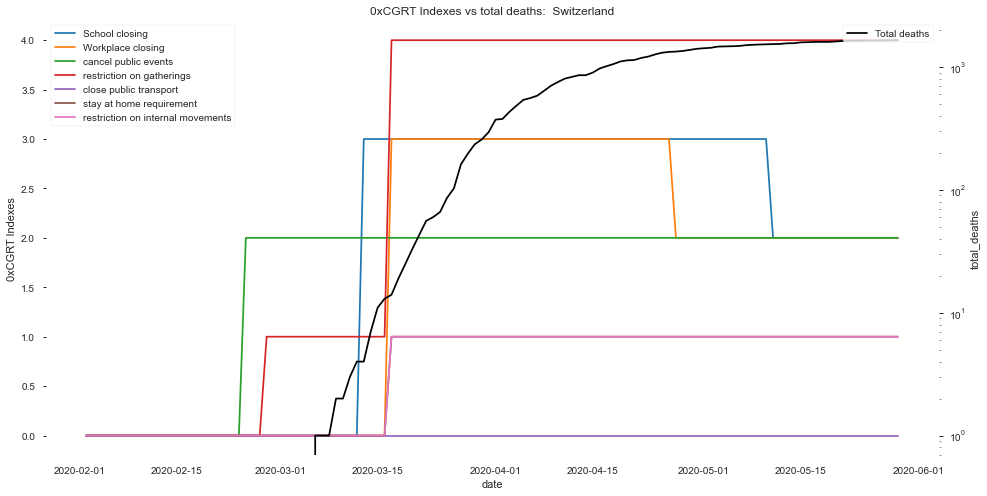

Sweden


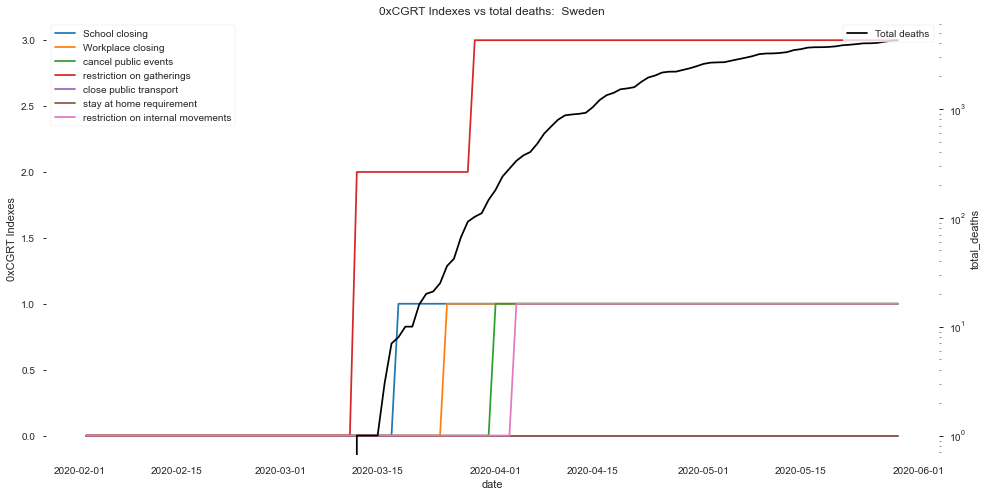

Italy


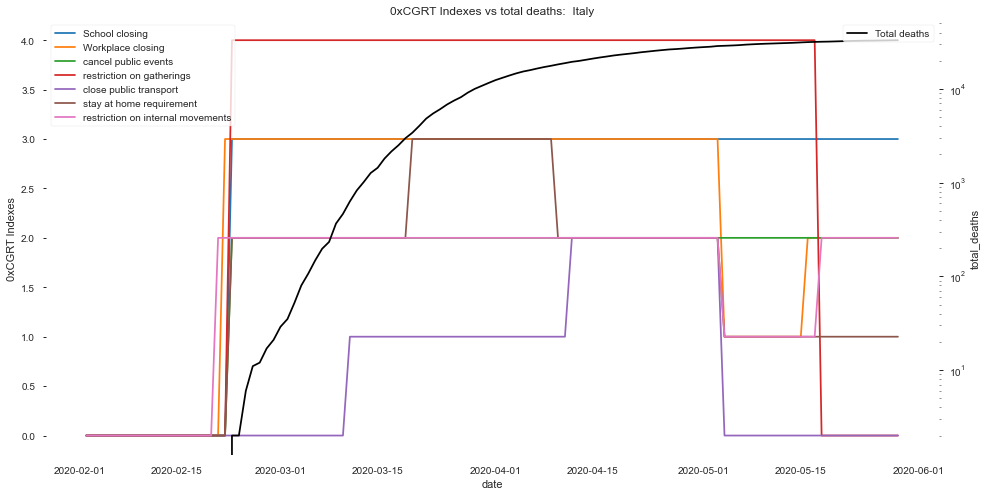

United Kingdom


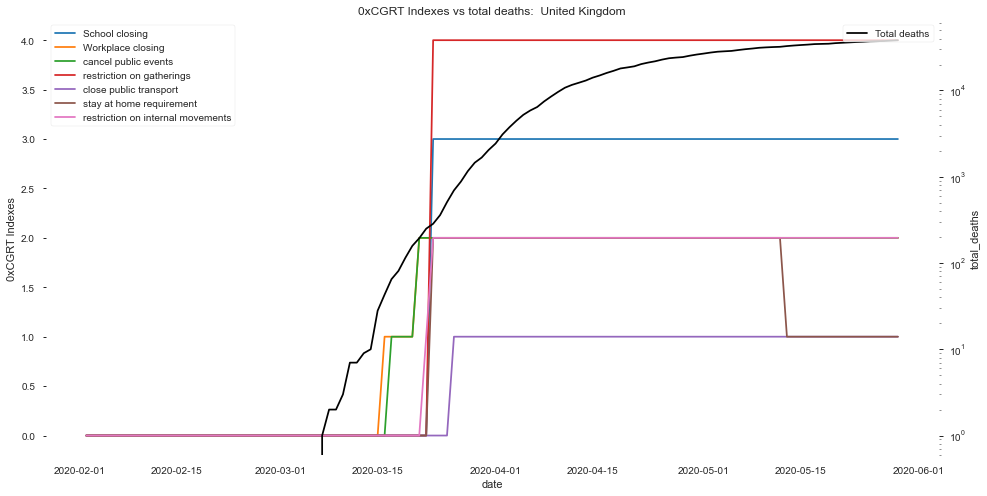

Germany


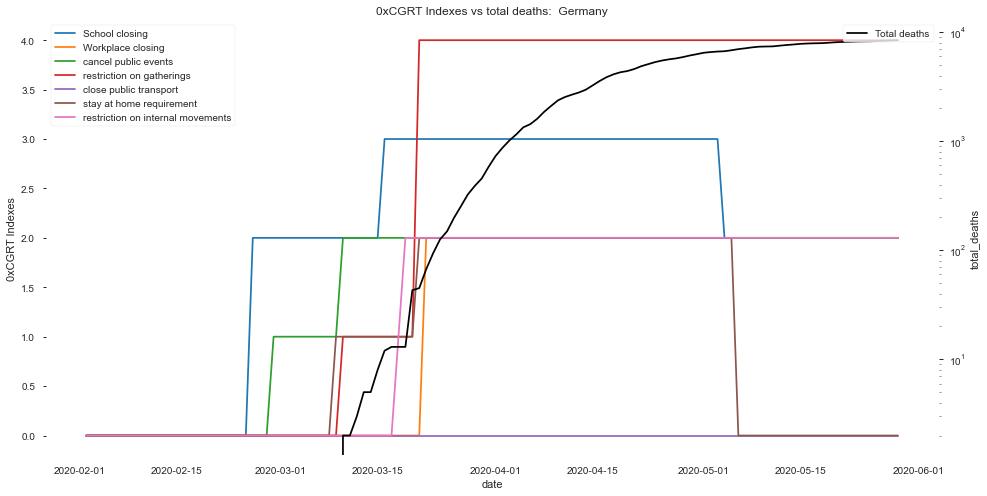

South Korea


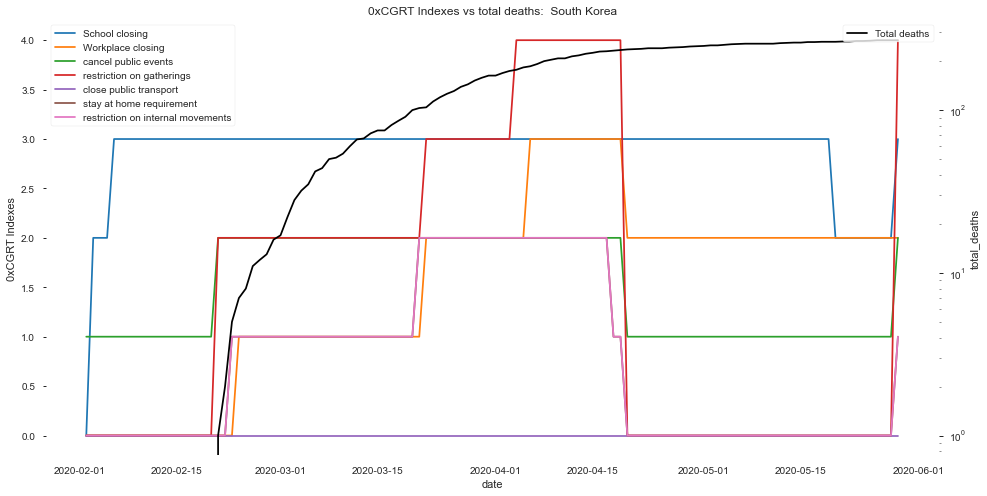

In [30]:
### Comparison 0xCGRT indexes vs cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-05-30'

for country in countries1:
    print(country)
    temp2 = []
    temp2 = merge[merge.location.isin([country])]
    temp2 = temp2[(temp2['date'] > dstart ) & (temp2['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="C1_School closing", label='School closing')
    ax = sns.lineplot(data=temp2, x="date", y="C2_Workplace closing", label='Workplace closing')
    ax = sns.lineplot(data=temp2, x="date", y="C3_Cancel public events", label='cancel public events')
    ax = sns.lineplot(data=temp2, x="date", y="C4_Restrictions on gatherings", label='restriction on gatherings')
    ax = sns.lineplot(data=temp2, x="date", y="C5_Close public transport", label='close public transport')
    ax = sns.lineplot(data=temp2, x="date", y="C6_Stay at home requirements", label='stay at home requirement')
    ax = sns.lineplot(data=temp2, x="date", y="C7_Restrictions on internal movement", label='restriction on internal movements')
    plt.ylabel('0xCGRT Indexes')
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="total_deaths", label='Total deaths', color='black')
    ax2.set(yscale='log')
    plt.legend(loc=1)

    #ax.set(xlim=(10, 1000000))
    plt.title('0xCGRT Indexes vs total deaths:  ' + country)
    plt.savefig('output/Stringency_vs_deaths_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

## Health measures

United States


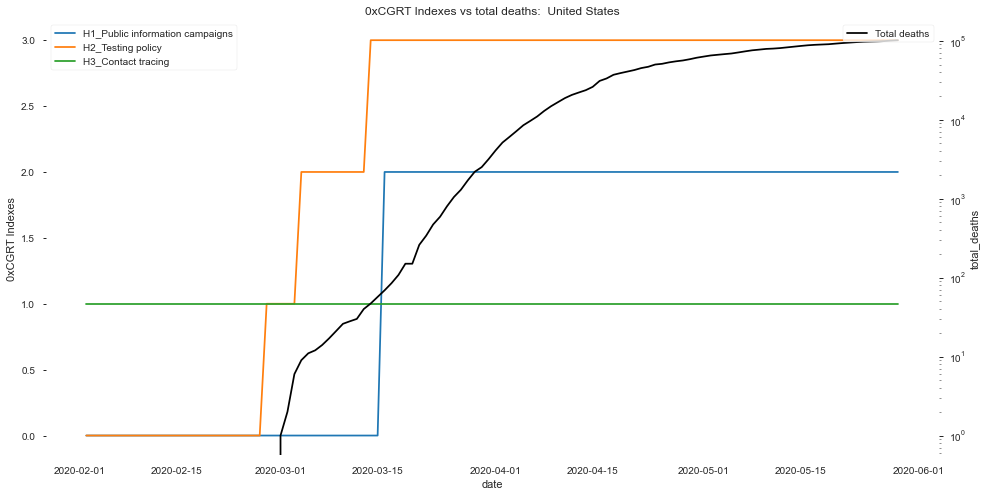

France


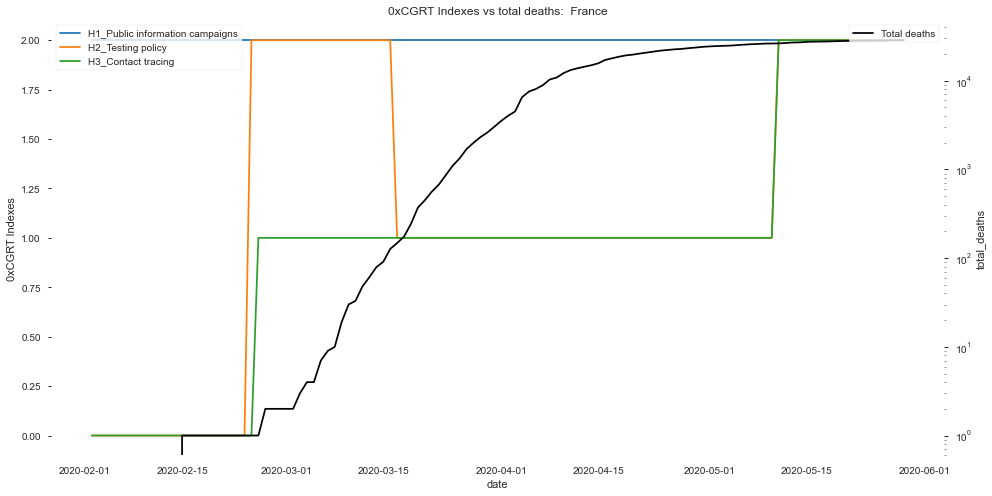

Spain


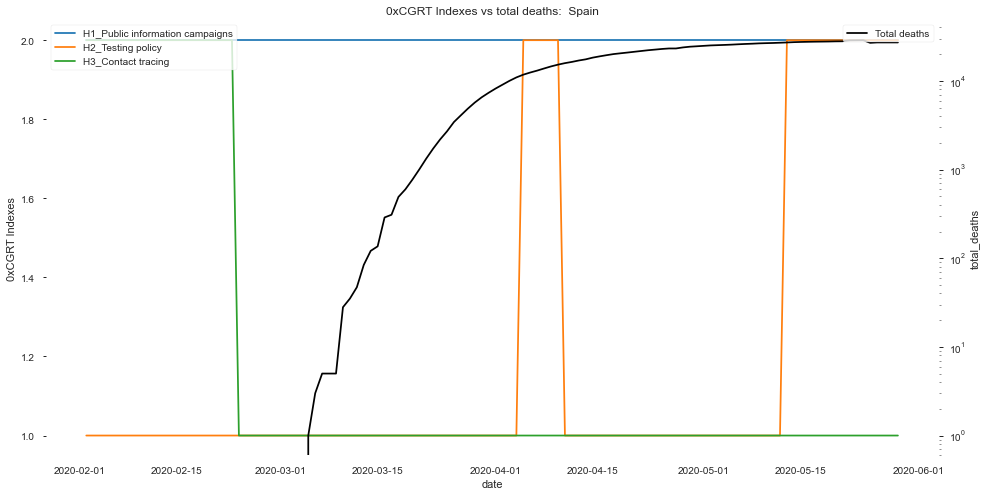

Switzerland


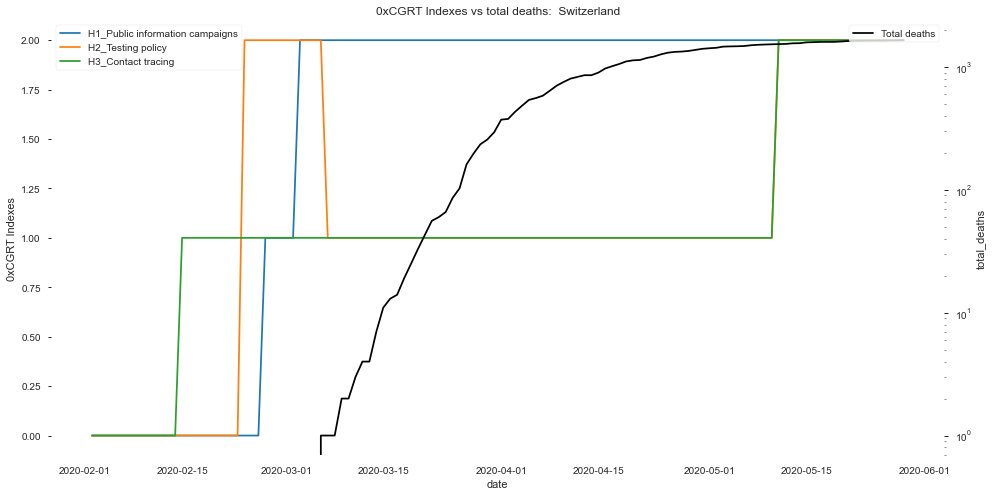

Sweden


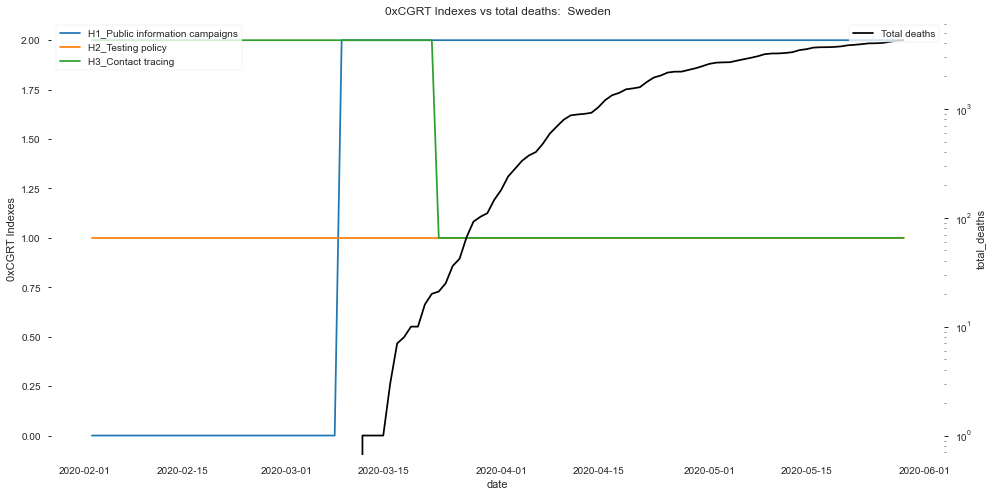

Italy


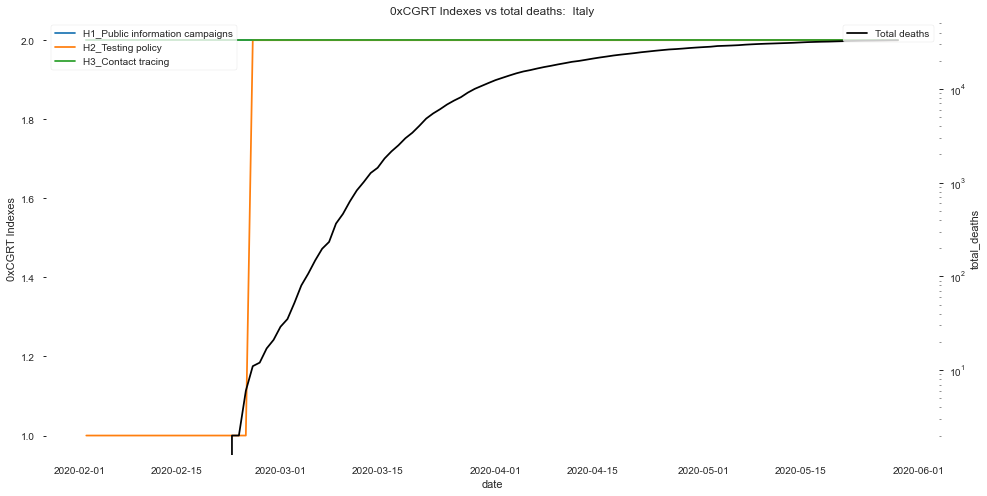

United Kingdom


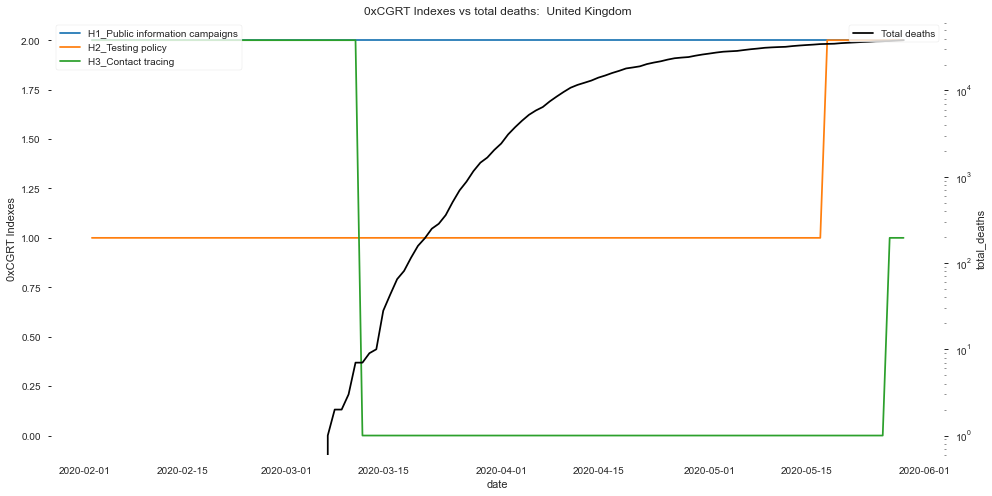

Germany


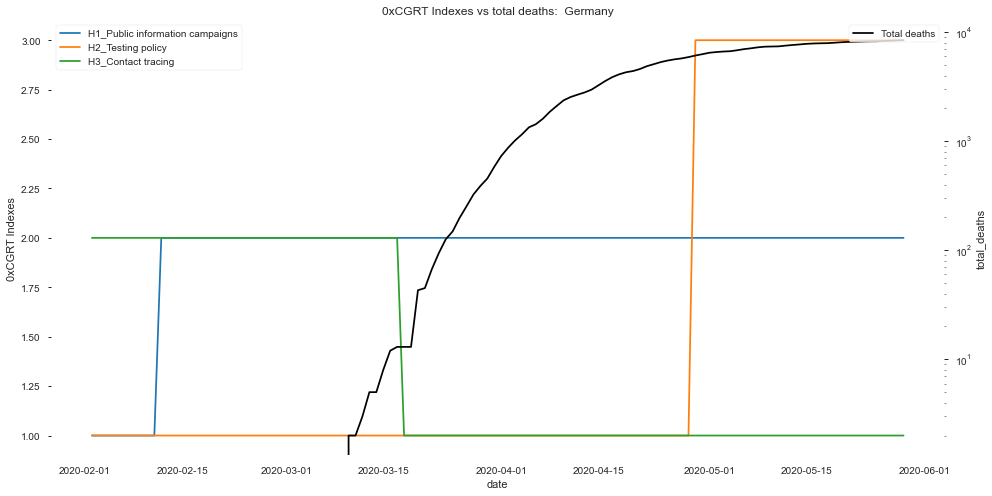

South Korea


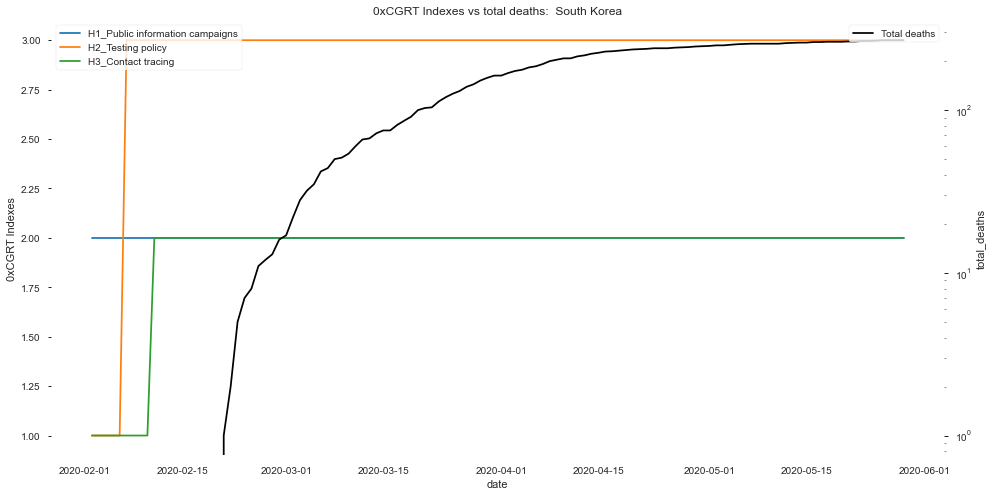

In [31]:
### Health 0xCGRT indexes vs cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-05-30'

for country in countries1:
    print(country)
    temp2 = []
    temp2 = merge[merge.location.isin([country])]
    temp2 = temp2[(temp2['date'] > dstart ) & (temp2['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="H1_Public information campaigns", label='H1_Public information campaigns')
    ax = sns.lineplot(data=temp2, x="date", y="H2_Testing policy", label='H2_Testing policy')
    ax = sns.lineplot(data=temp2, x="date", y="H3_Contact tracing", label='H3_Contact tracing')
    plt.ylabel('0xCGRT Indexes')
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="total_deaths", label='Total deaths', color='black')
    ax2.set(yscale='log')
    plt.legend(loc=1)

    #ax.set(xlim=(10, 1000000))
    plt.title('0xCGRT Indexes vs total deaths:  ' + country)
    plt.savefig('output/Stringency_health_vs_deaths_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

# **Number of new cases compared to type of lockdown**

### C6: Stay at home requirements

Record orders to "shelter-in-place" and otherwise confine to the home

0 - no measures\
1: recommend not leaving house\
2 - require not leaving house with exceptions for daily exercise, grocery shopping, and 'essential' trips\
3 - require not leaving house with minimal exceptions (eg allowed to leave once a week, or only one person can leave at a time, etc)




United States


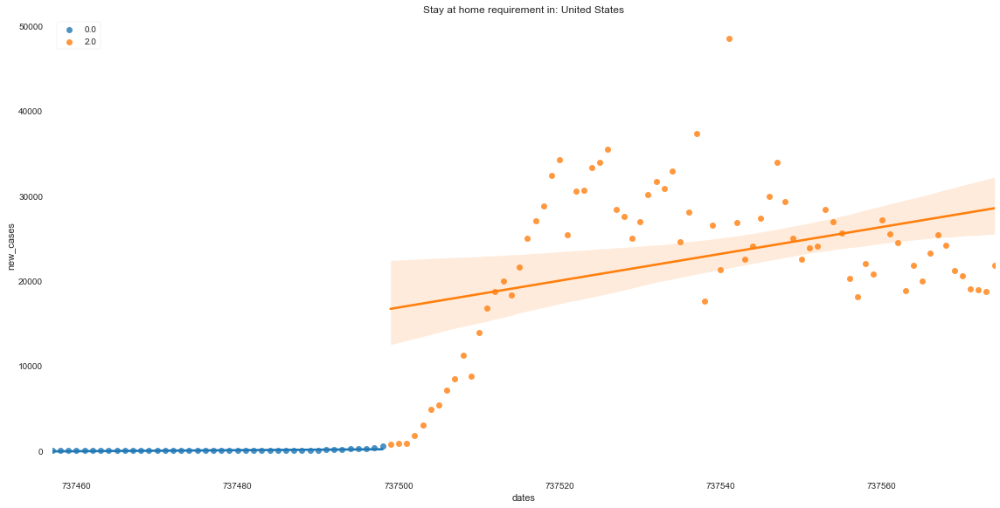

France


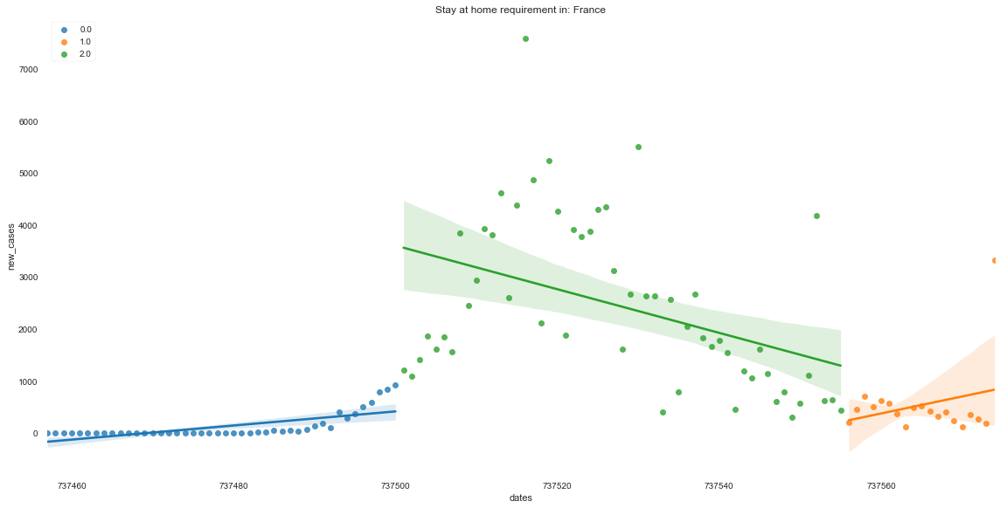

Spain


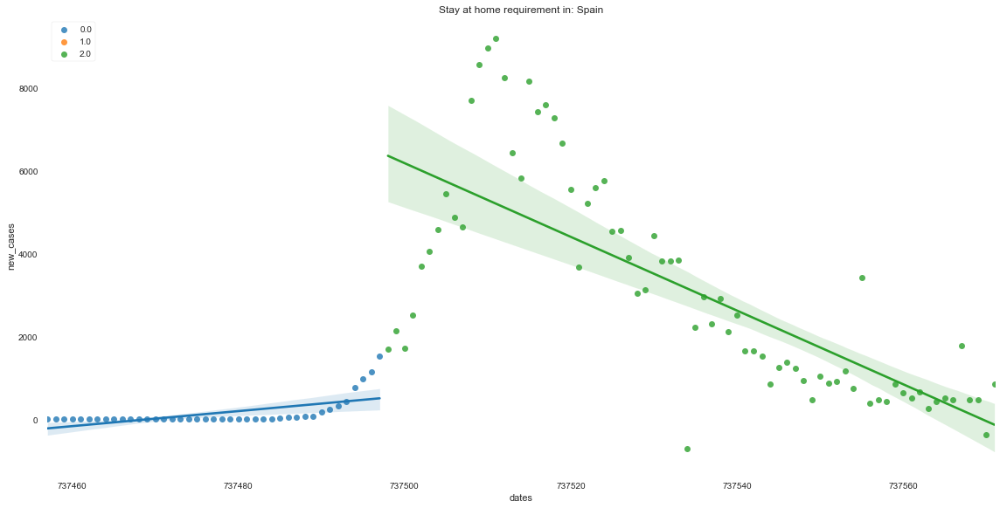

Switzerland


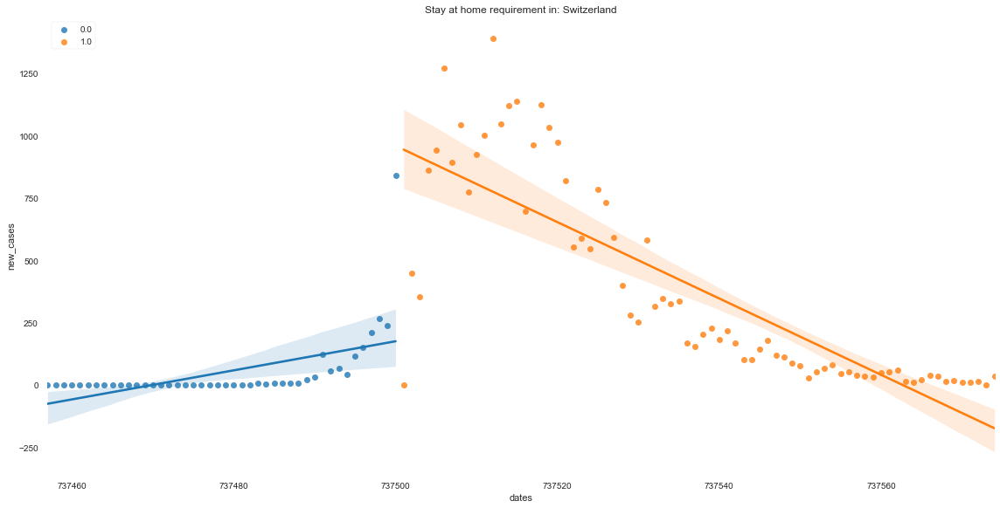

Sweden


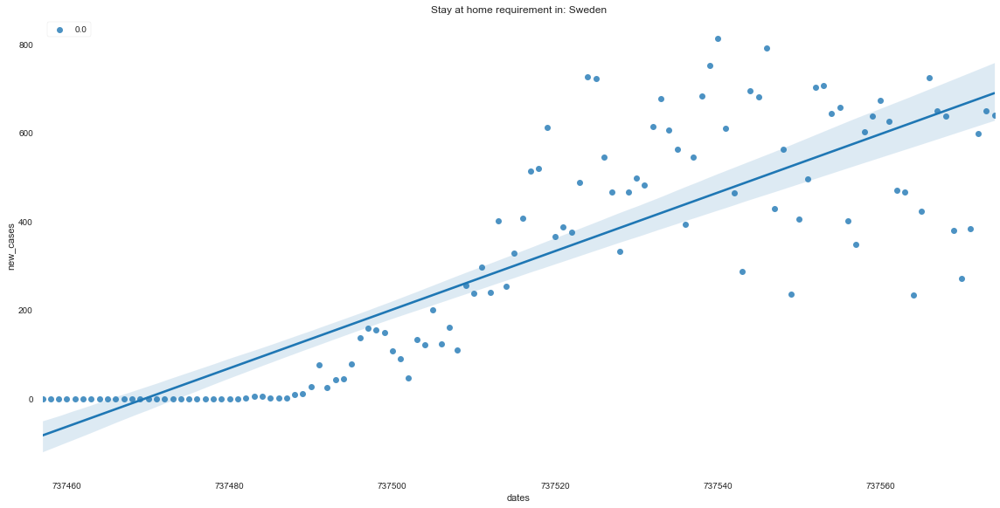

Italy


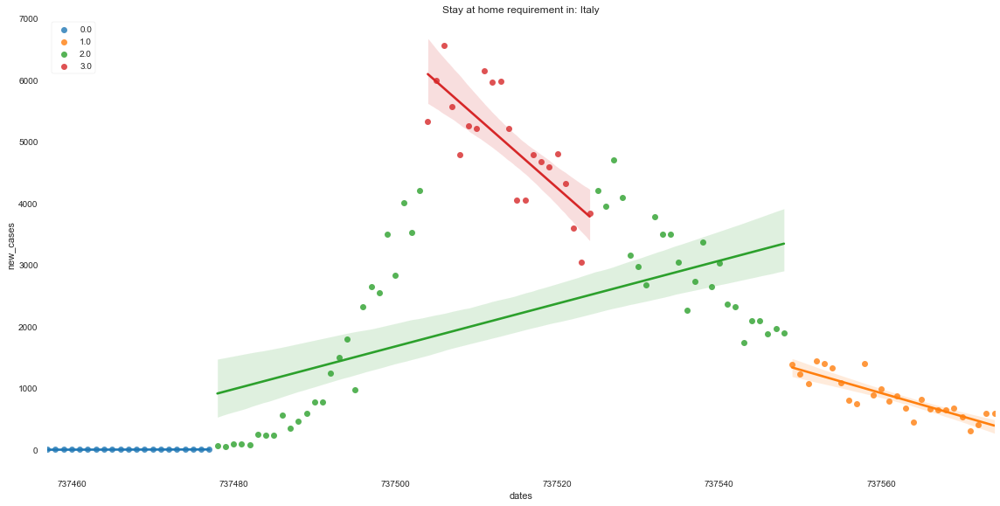

United Kingdom


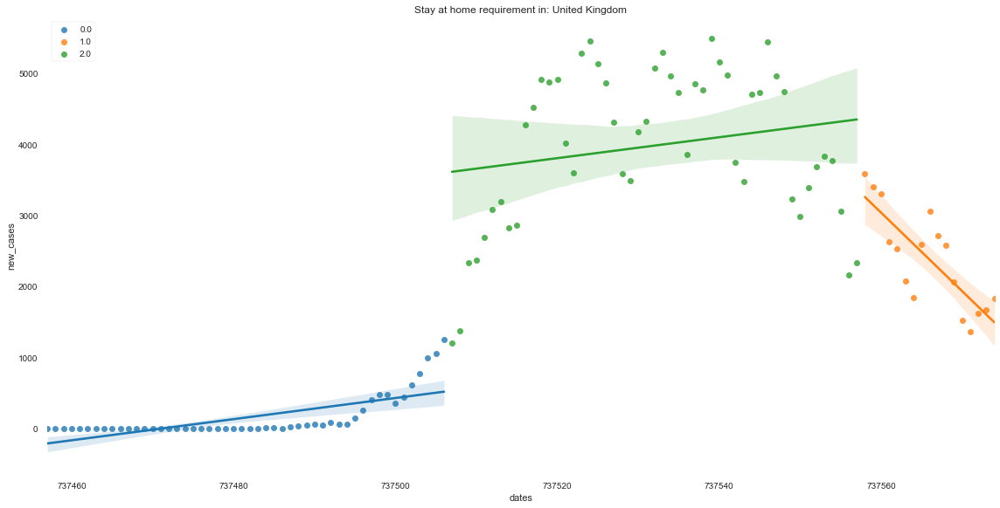

Germany


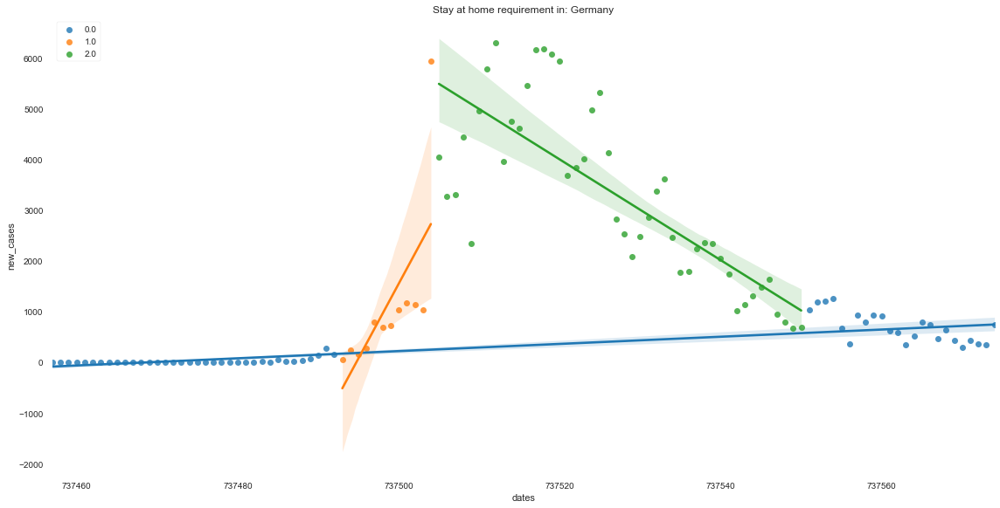

South Korea


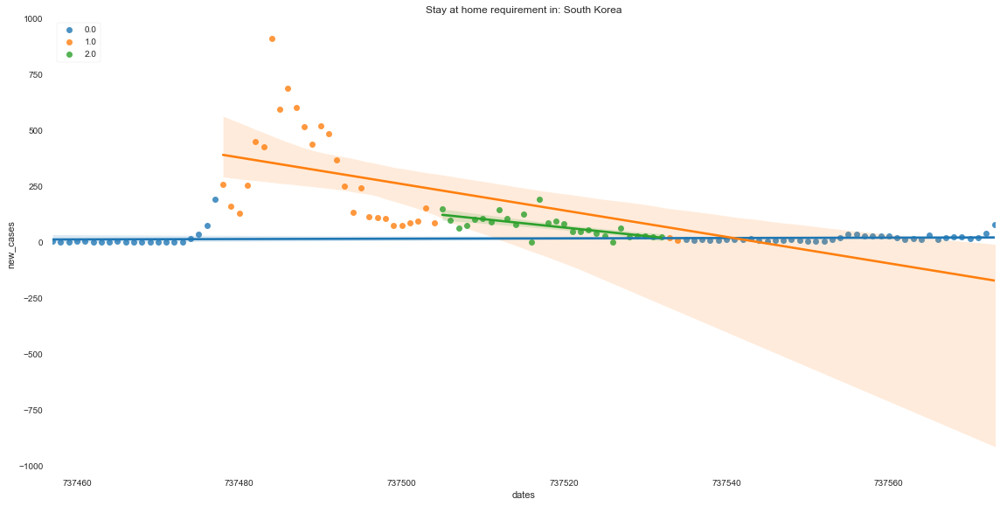

In [32]:
### Stay at home order vs cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-05-30'

for country in countries1:
    print(country)
    temp = []
    temp = merge[merge.location.isin([country])]
    temp = temp[(temp['date'] > dstart) & (temp['date'] < dend)]

    #Create num dates
    temp['dates'] = mdates.date2num(temp.date)

    # Plot
    f = sns.lmplot(data=temp, x="dates", y='new_cases', hue="C6_Stay at home requirements", height=8, aspect=2,
                  legend_out=False)
    plt.legend(loc=2)
    plt.title('Stay at home requirement in: ' + country)
    plt.savefig('output/Stay_at_home_cases_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

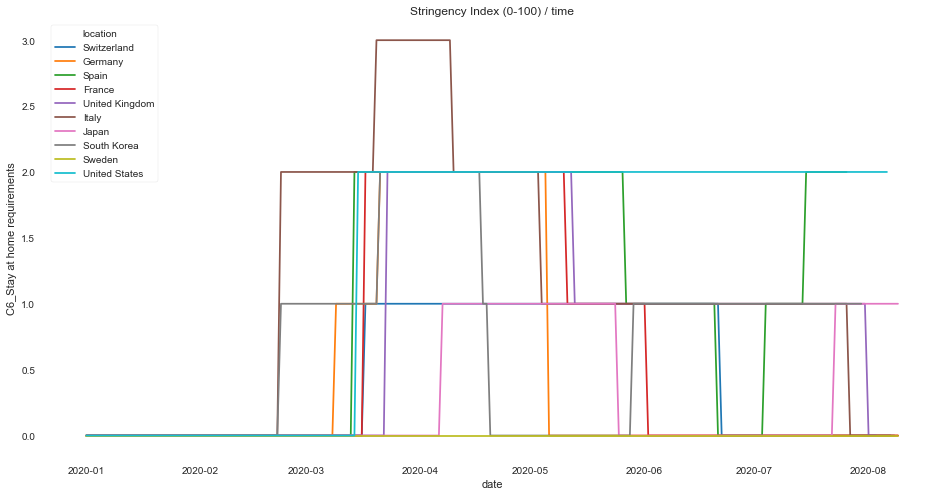

In [33]:
### Stay home Index vs time

countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea', 'Japan']

f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.location.isin(countries1)]
ax = sns.lineplot(data=df2, x="date", y="C6_Stay at home requirements", hue='location')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
#ax.set(xscale='log')

plt.title('Stringency Index (0-100) / time')
plt.savefig('output/Stay_at_home_Index_vs_time' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

## Stringency Index

In [34]:
### Merge Google database with merge

merge_gf = pd.merge(merge, gf, how = 'inner', on = ['location','date'], suffixes=('_left', '_right'))
merge_gf = merge_gf.rename(columns = {'iso_code_right' : 'iso_3'})

merge_gf_original = merge_gf

# Drop columns
merge_gf = merge_gf[['location','sub_region_1', 'sub_region_2', 'date', 'new_cases', 'total_cases', 'total_cases_per_million', 'new_deaths', 'total_deaths',
                           'stringency_index', 'continent', 'retail_and_recreation_percent_change_from_baseline',
                          'grocery_and_pharmacy_percent_change_from_baseline', 'parks_percent_change_from_baseline',
                          'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline',
                          'residential_percent_change_from_baseline']]

#merge_gf.to_csv('data/merge_gf.csv') #Save file locally
#merge_gf.info()

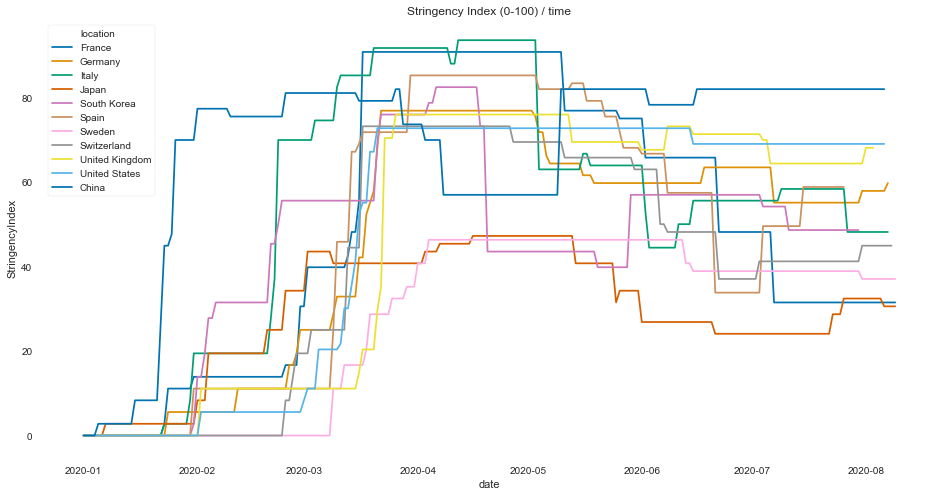

In [35]:
### Stringency Index vs time

countries1 = ['France', 'Germany', 'Italy', 'Japan', 'South Korea', 'Spain', 'Sweden', 'Switzerland',
              'United Kingdom', 'United States', 'China']

f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.location.isin(countries1)]
ax = sns.lineplot(data=df2, x="date", y="StringencyIndex", hue='location', palette='colorblind', hue_order=countries1)

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
#ax.set(xscale='log')

plt.title('Stringency Index (0-100) / time')
plt.savefig('output/Stringency_Index_vs_time' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

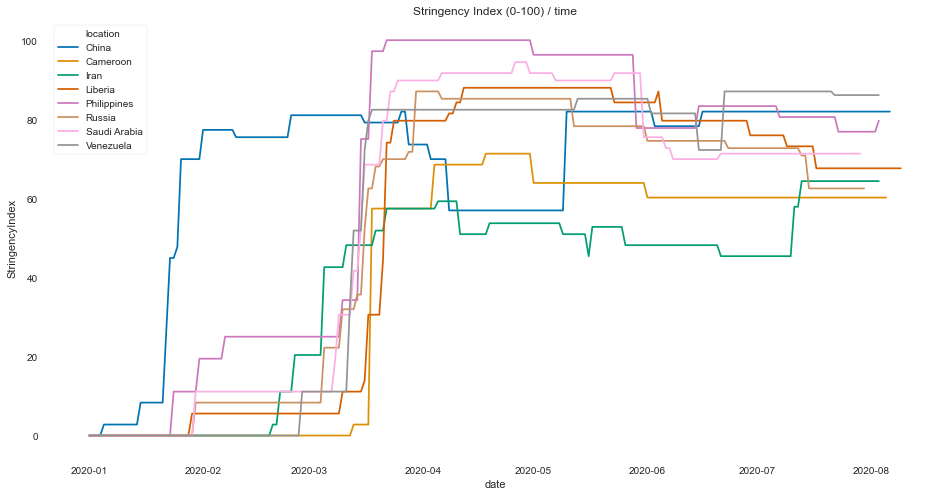

In [36]:
### Stringency Index vs time

countries2 = ['Saudi Arabia', 'China', 'Liberia', 'Cameroon', 'Venezuela', 'Russia', 'Philippines', 'Iran']

f, ax = plt.subplots(figsize=(16, 8))
df2 = df[df.location.isin(countries2)]
ax = sns.lineplot(data=df2, x="date", y="StringencyIndex", hue='location', palette='colorblind')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
#ax.set(xscale='log')

plt.title('Stringency Index (0-100) / time')
plt.savefig('output/Stringency_Index_vs_time_2' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

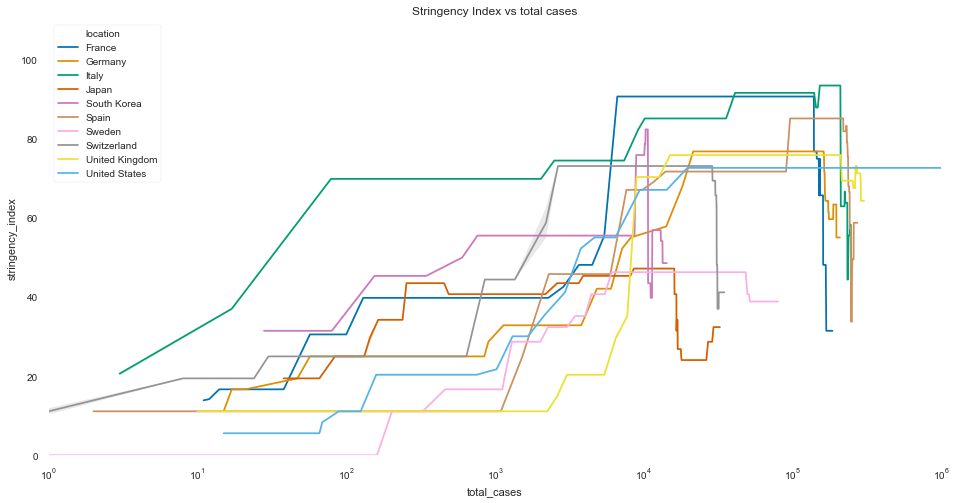

In [37]:
### Stringency vs total cases

countries1 = ['France', 'Germany', 'Italy', 'Japan', 'South Korea', 'Spain', 'Sweden', 'Switzerland',
              'United Kingdom', 'United States']

# Range
dstart = '2020-02-01'
dend = '2020-07-31'

temp = []
temp = merge_gf[merge_gf.location.isin(countries1)]
temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]

# Plot 1
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp, x="total_cases", y="stringency_index", hue='location', palette='colorblind', hue_order=countries1)
ax.set(xscale='log')
plt.legend(loc=2)
#plt.ylabel('Google Indexes')
#ax.set(ylim=(-100, 100))
ax.set(xlim=(1, 1000000))
ax.set(ylim=(0, 110))


plt.title('Stringency Index vs total cases')
plt.savefig('output/Stringency_Index_vs_cases_countries.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

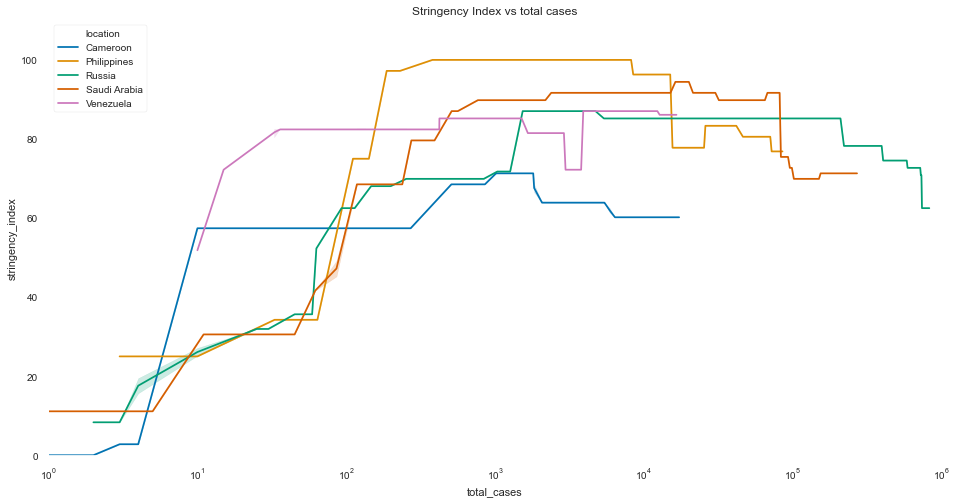

In [38]:
### Stringency vs total cases

countries2 = ['Saudi Arabia', 'China', 'Liberia', 'Cameroon', 'Venezuela', 'Russia', 'Philippines', 'Iran']

# Range
dstart = '2020-02-01'
dend = '2020-07-31'

temp = []
temp = merge_gf[merge_gf.location.isin(countries2)]
temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]

# Plot 1
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp, x="total_cases", y="stringency_index", hue='location', palette='colorblind')
ax.set(xscale='log')
plt.legend(loc=2)
#plt.ylabel('Google Indexes')
#ax.set(ylim=(-100, 100))
ax.set(xlim=(1, 1000000))
ax.set(ylim=(0, 110))

plt.title('Stringency Index vs total cases')
plt.savefig('output/Stringency_Index_vs_cases_countries2.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

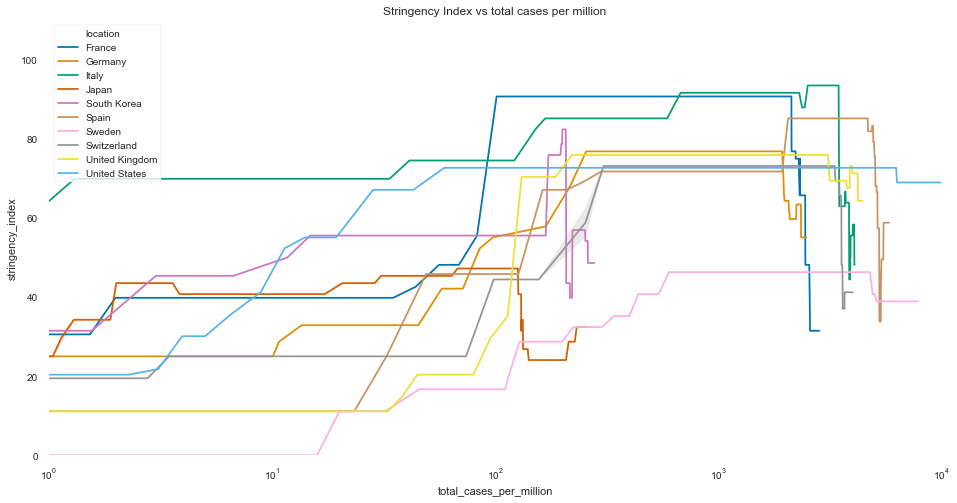

In [39]:
### Coutries selected per million

countries1 = ['France', 'Germany', 'Italy', 'Japan', 'South Korea', 'Spain', 'Sweden', 'Switzerland',
              'United Kingdom', 'United States']

# Range
dstart = '2020-02-01'
dend = '2020-07-31'

temp = []
temp = merge_gf[merge_gf.location.isin(countries1)]
temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]

# Plot 1
f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=temp, x="total_cases_per_million", y="stringency_index", hue='location', palette='colorblind')
ax.set(xscale='log')
plt.legend(loc=2)
#plt.ylabel('Google Indexes')
#ax.set(ylim=(-100, 100))
ax.set(xlim=(1, 10000))
ax.set(ylim=(0, 110))


plt.title('Stringency Index vs total cases per million')
plt.savefig('output/Stringency_Index_vs_cases_per_million_countries.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

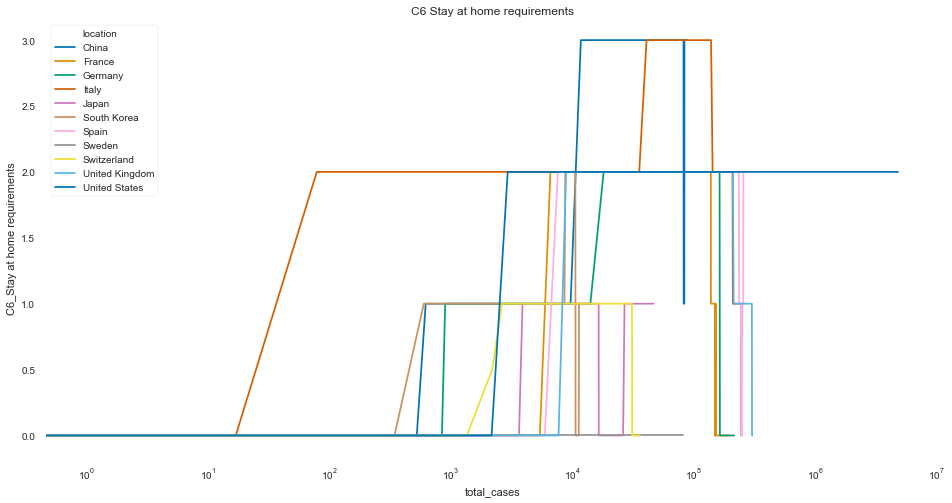

In [40]:
### Stay home Index vs time

countries1 = ['France', 'Germany', 'Italy', 'Japan', 'South Korea', 'Spain', 'Sweden', 'Switzerland',
              'United Kingdom', 'United States', 'China']

f, ax = plt.subplots(figsize=(16, 8))
df2 = merge[merge.location.isin(countries1)]
ax = sns.lineplot(data=df2, x="total_cases", y="C6_Stay at home requirements", hue='location', palette='colorblind')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
ax.set(xscale='log')

plt.title('C6 Stay at home requirements')
plt.savefig('output/Stay_at_home_Index_vs_total_cases_countries1' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

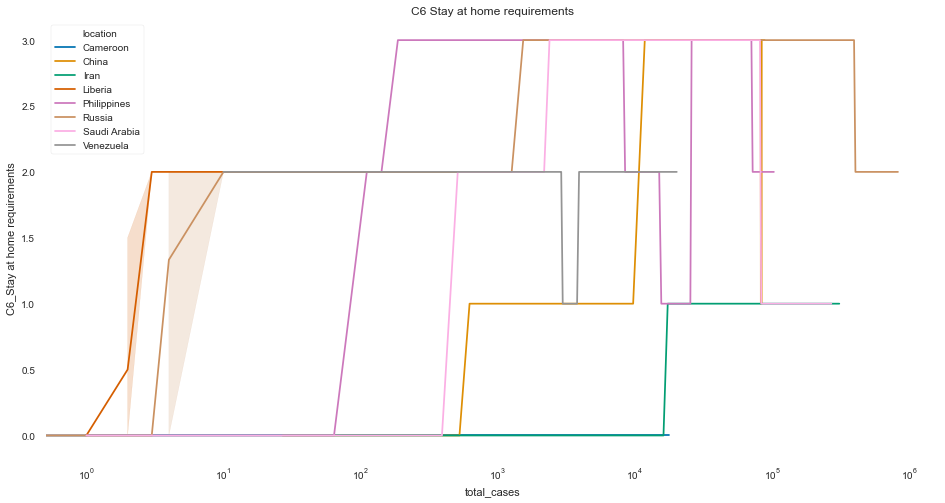

In [41]:
### Stay home Index vs time

countries2 = ['Saudi Arabia', 'China', 'Liberia', 'Cameroon', 'Venezuela', 'Russia', 'Philippines', 'Iran']


f, ax = plt.subplots(figsize=(16, 8))
df2 = merge[merge.location.isin(countries2)]
ax = sns.lineplot(data=df2, x="total_cases", y="C6_Stay at home requirements", hue='location', palette='colorblind')

#axes limit
#ax.set(xlim=(10, 1000000))
#ax.set(ylim=(0, 3.5))

#scale
ax.set(xscale='log')

plt.title('C6 Stay at home requirements')
plt.savefig('output/Stay_at_home_Index_vs_total_cases_countries2' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

United States


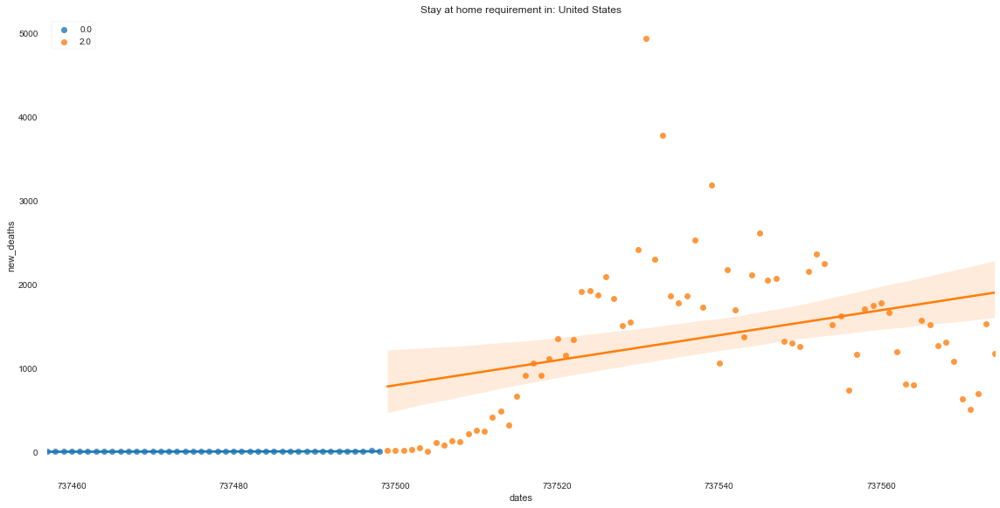

France


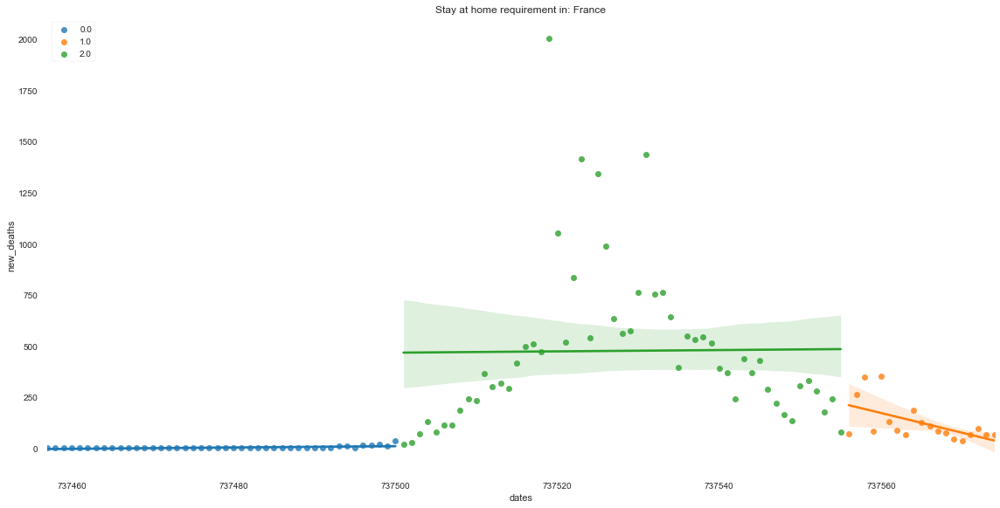

Spain


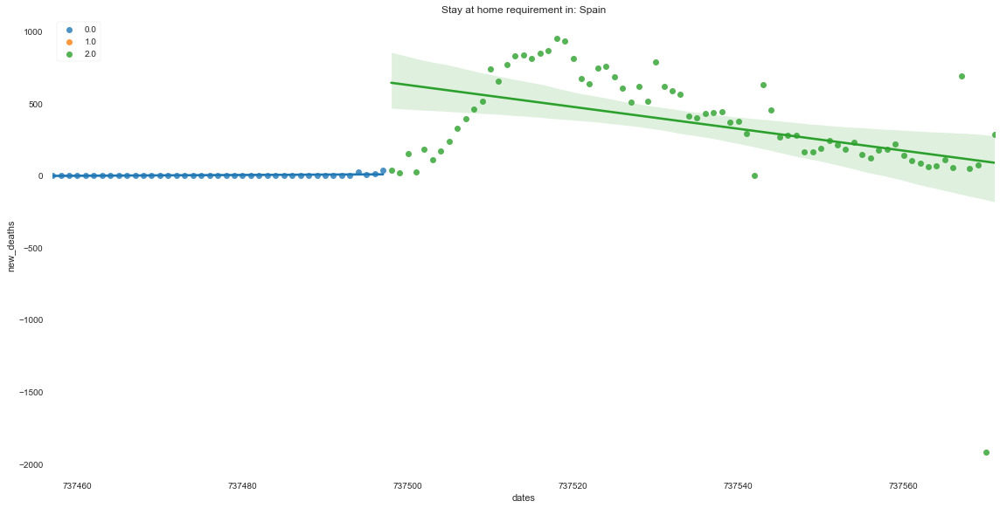

Switzerland


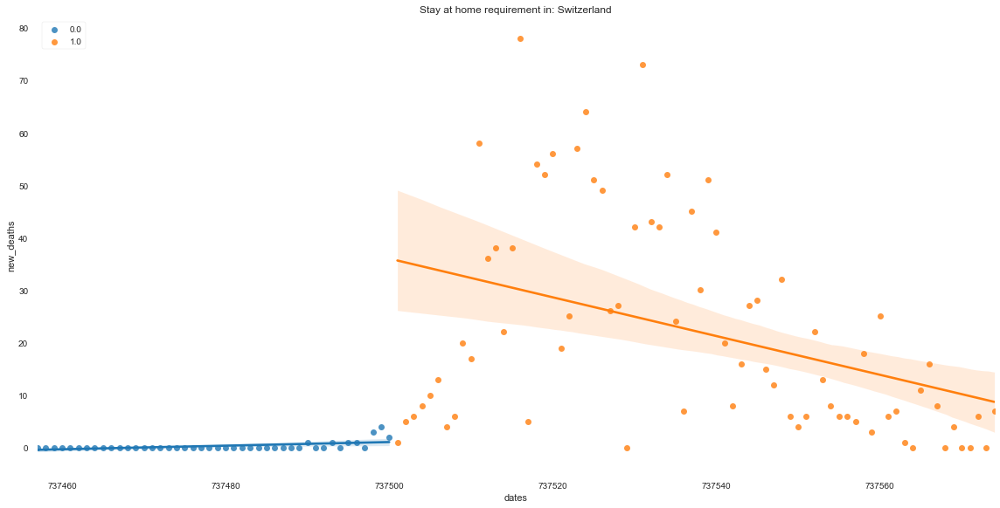

Sweden


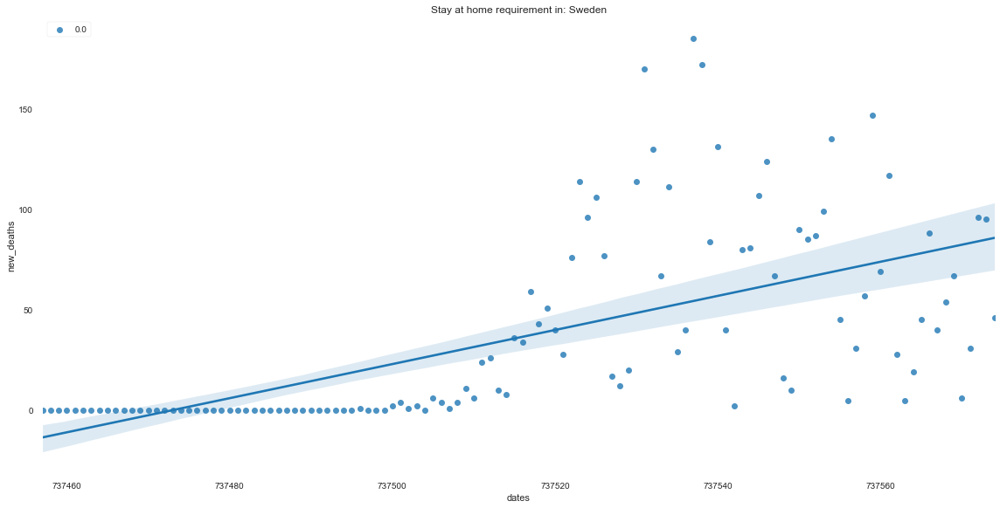

Italy


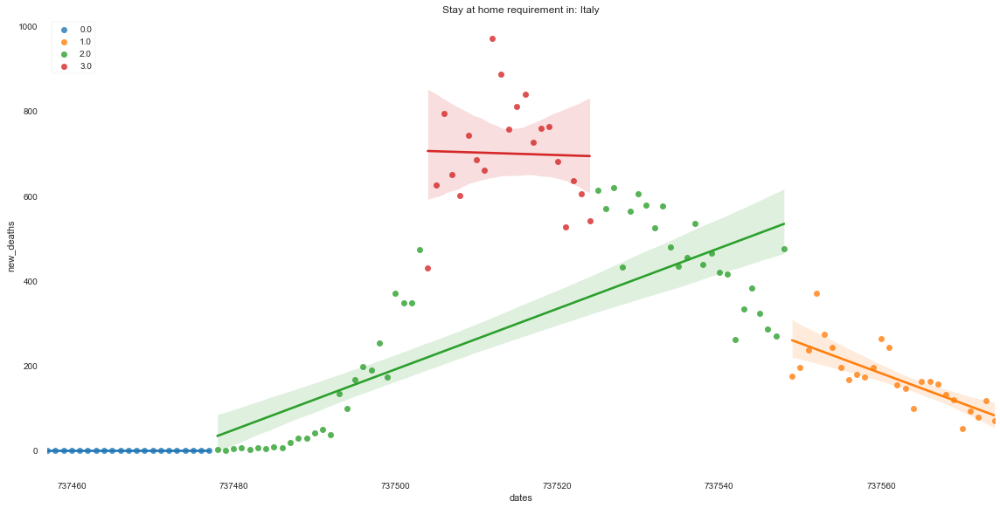

United Kingdom


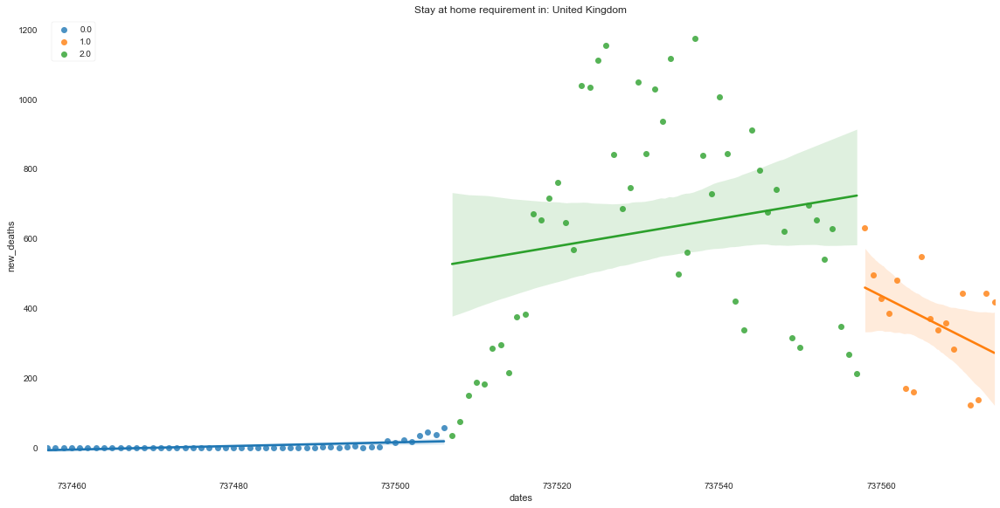

Germany


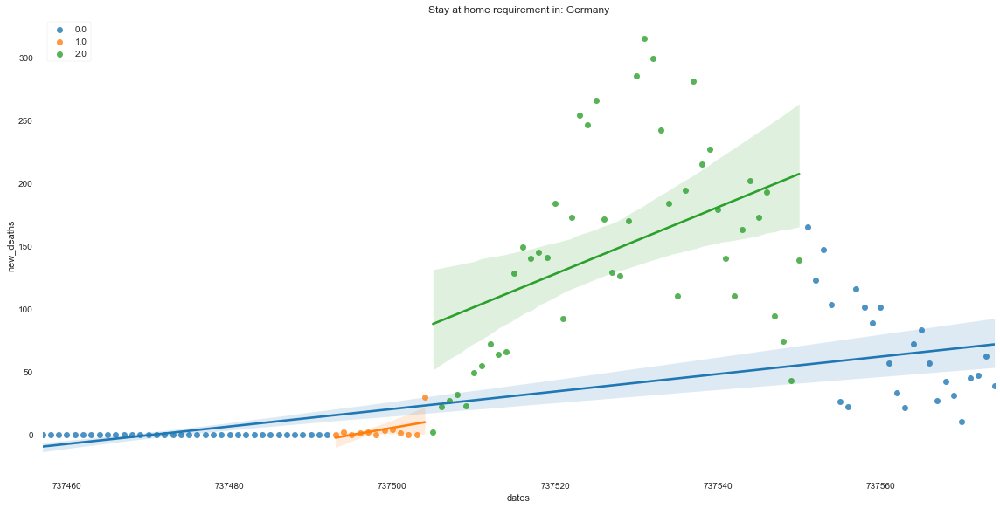

South Korea


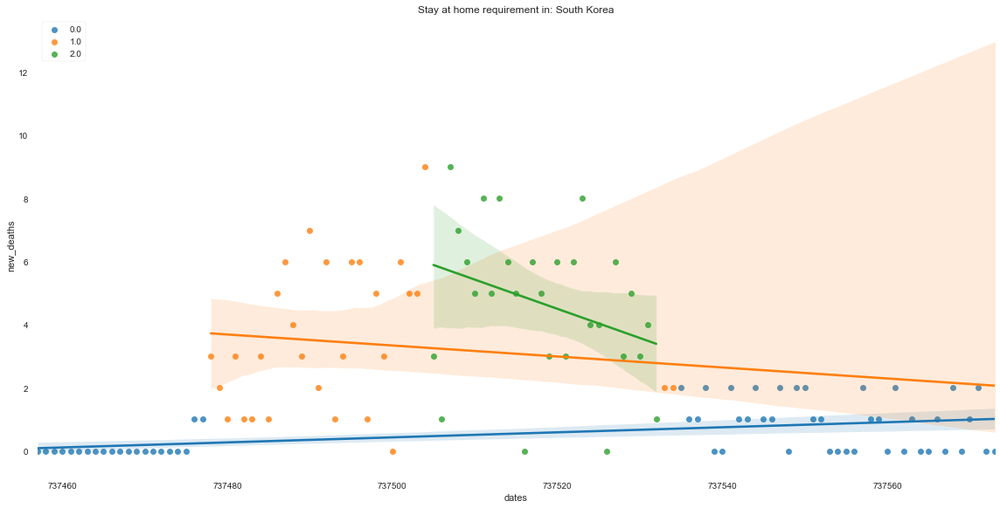

In [42]:
### Stay at home order vs deaths

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-05-30'

for country in countries1:
    print(country)
    temp = []
    temp = merge[merge.location.isin([country])]
    temp = temp[(temp['date'] > dstart) & (temp['date'] < dend)]

    #Create num dates
    temp['dates'] = mdates.date2num(temp.date)

    # Plot
    f = sns.lmplot(data=temp, x="dates", y='new_deaths', hue="C6_Stay at home requirements", height=8, aspect=2,
                  legend_out=False)
    plt.legend(loc=2)
    plt.title('Stay at home requirement in: ' + country)
    plt.savefig('output/Stay_at_home_vs_new_deaths_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

## Cases vs stringency index

United States


/Users/leonardveillon/anaconda3/envs/corona/lib/python3.7/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.


France
Spain
Switzerland
Sweden
Italy
United Kingdom
Germany
South Korea


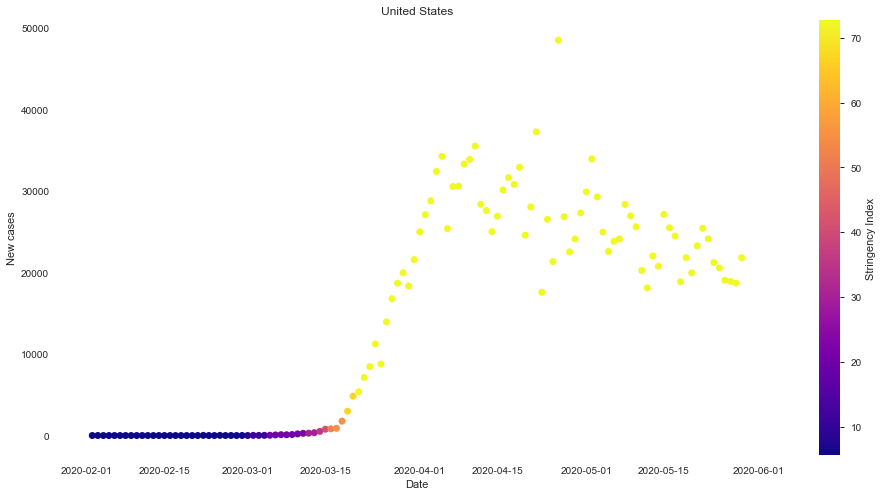

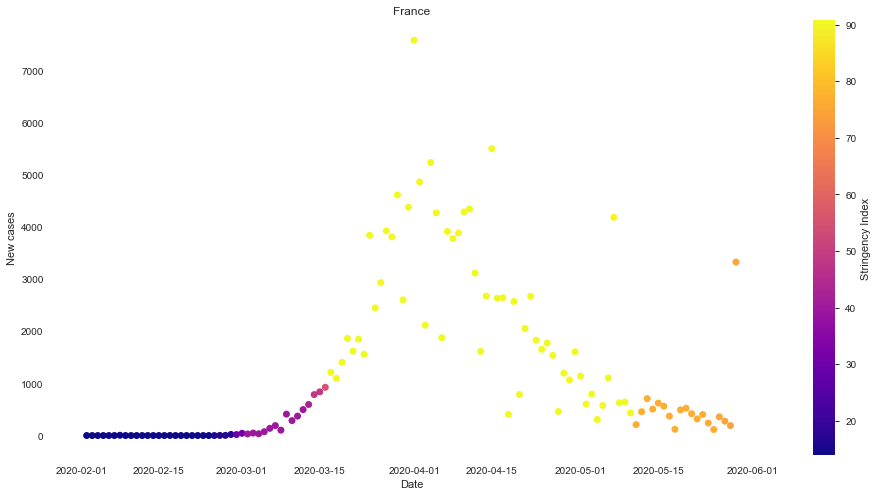

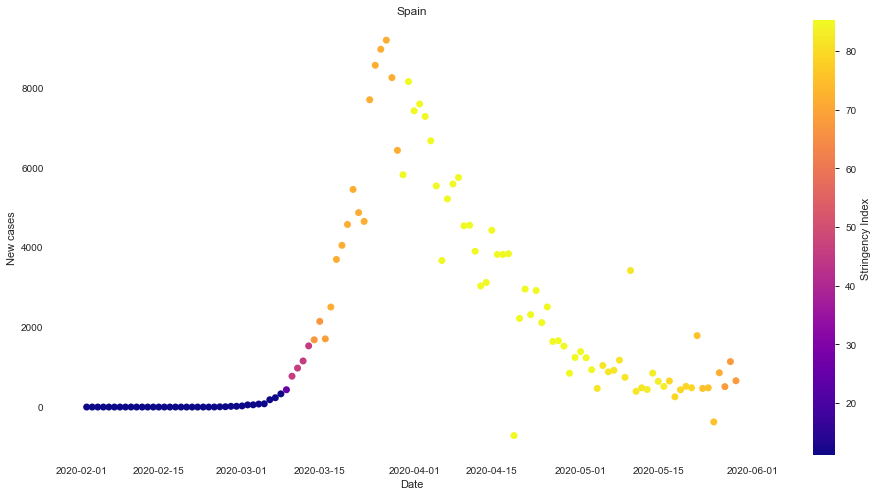

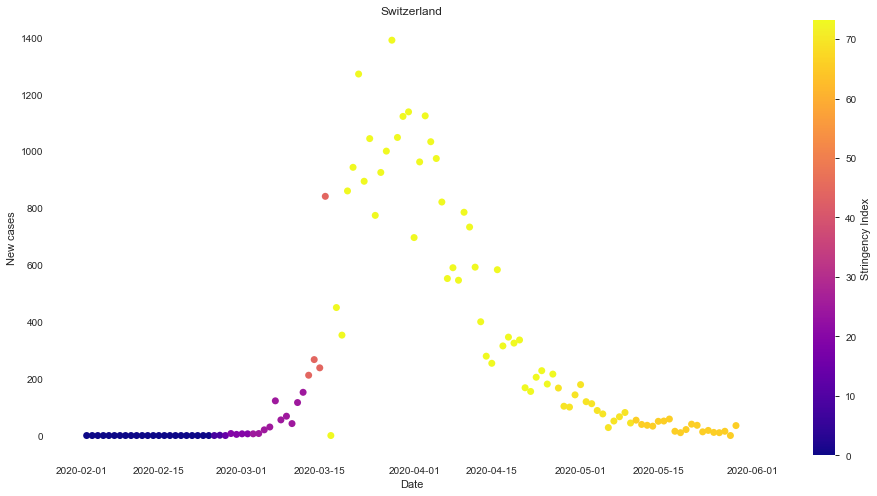

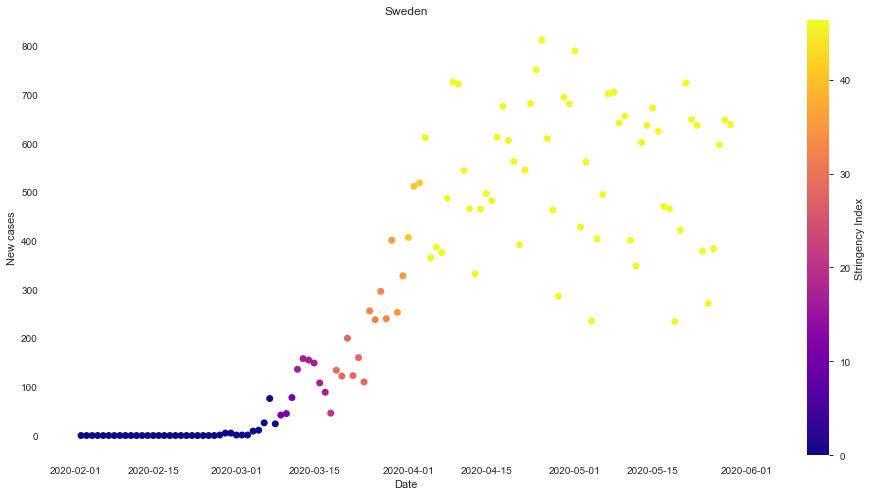

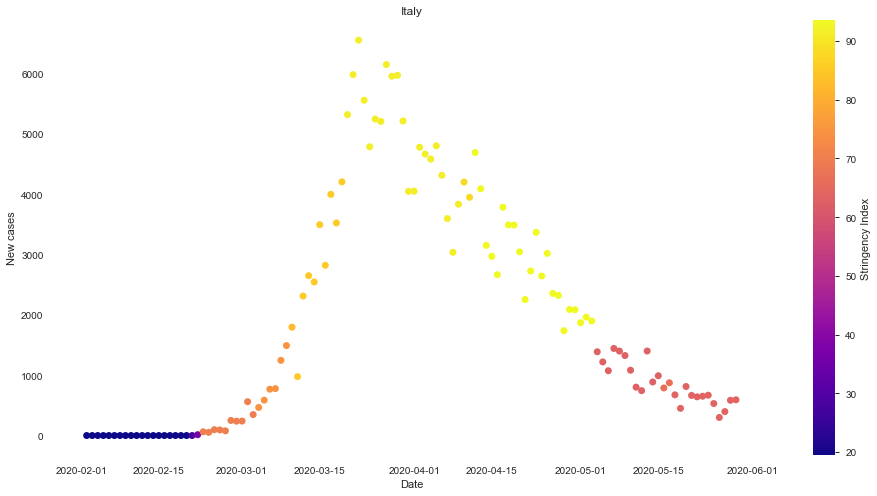

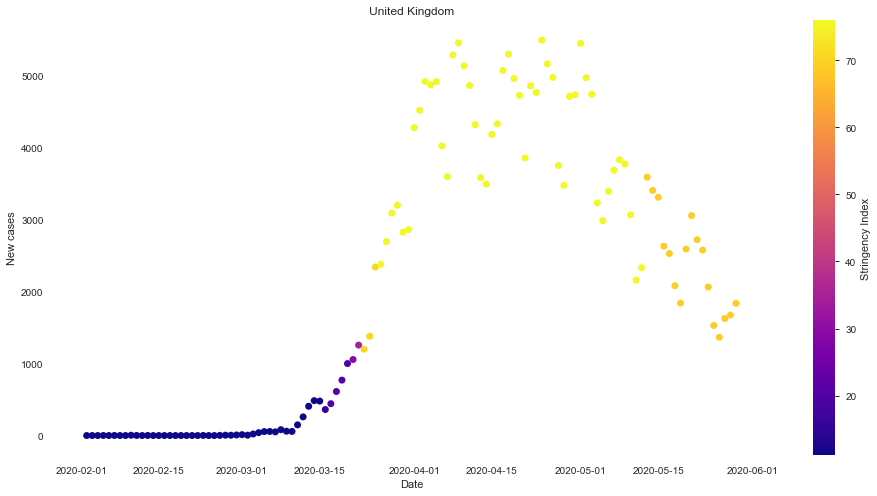

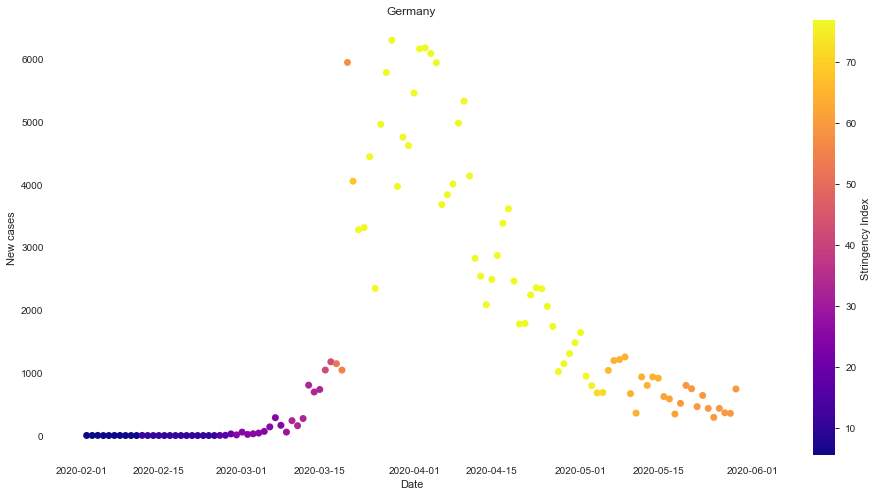

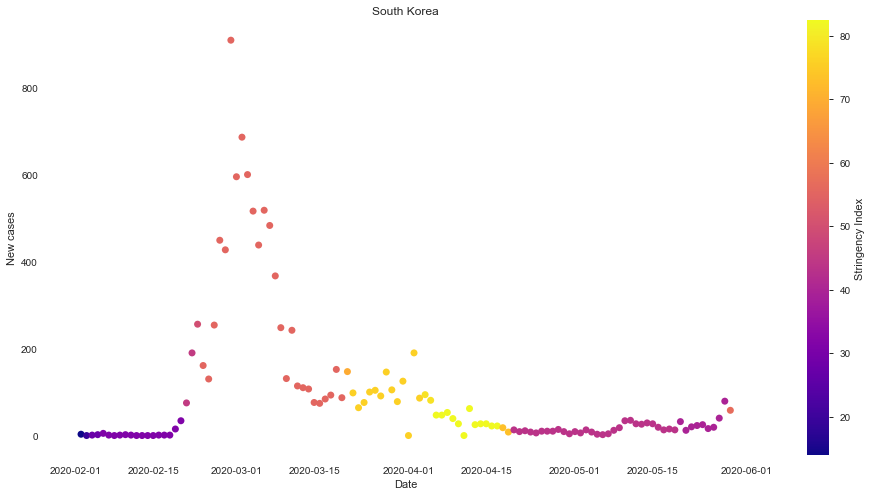

In [43]:
### Stringency vs cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-05-30'

for country in countries1:
    print(country)
    temp = []
    temp = merge[merge.location.isin([country])]
    temp = temp[(temp['date'] > dstart) & (temp['date'] < dend)]

    # Extract the data we're interested in
    x, y = temp['date'], temp['new_cases']
    color = temp['stringency_index']

    # Scatter the points
    plt.figure(figsize=(16, 8))
    plt.scatter(x, y, label=None,
                c=color, cmap='plasma',
                linewidth=0, alpha=1)
    plt.axis(aspect='equal')
    ax.set_yscale('log')
    plt.xlabel('Date')
    plt.ylabel('New cases')
    plt.colorbar(label='Stringency Index')
    #plt.clim(0, 3)

    plt.savefig('output/Stringency_colored_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.title(country);

United States


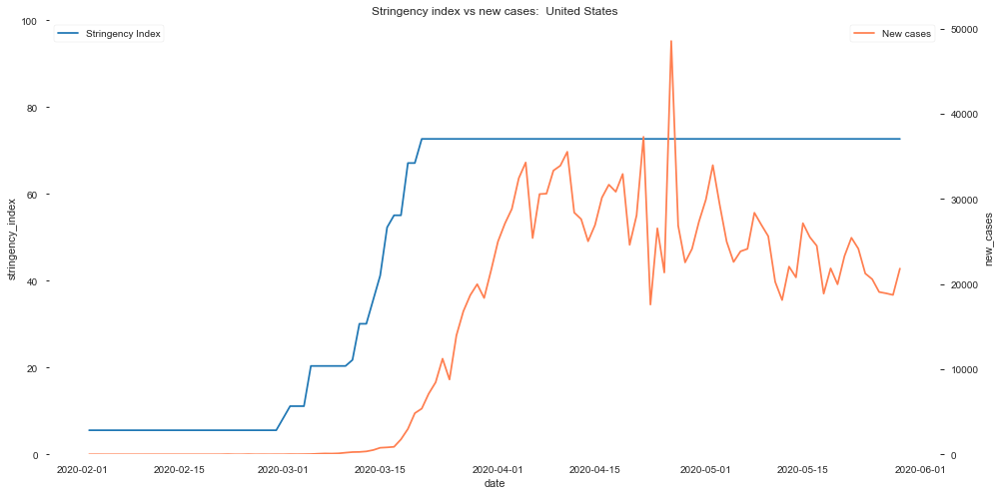

France


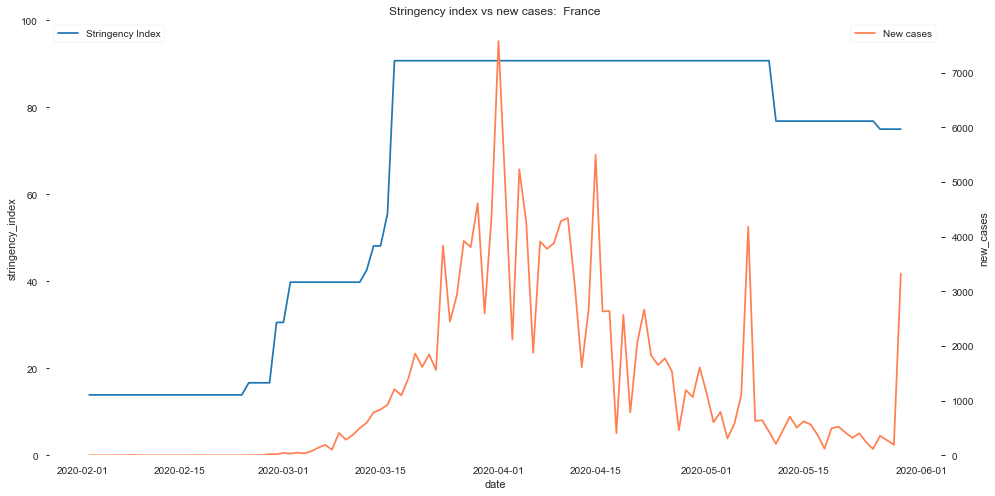

Spain


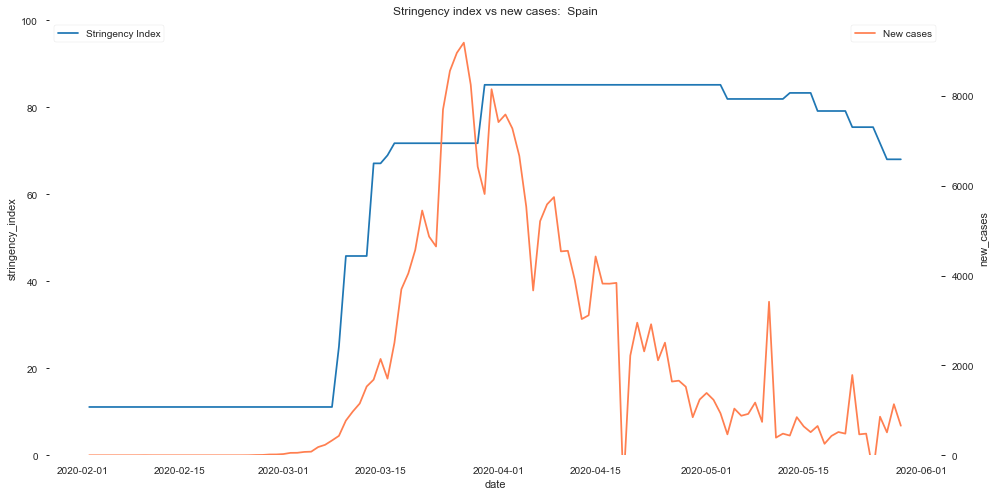

Switzerland


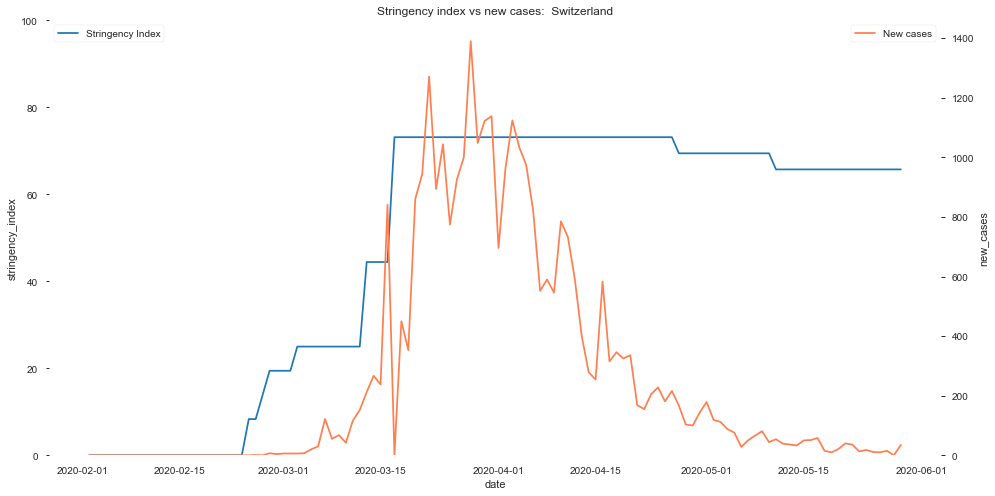

Sweden


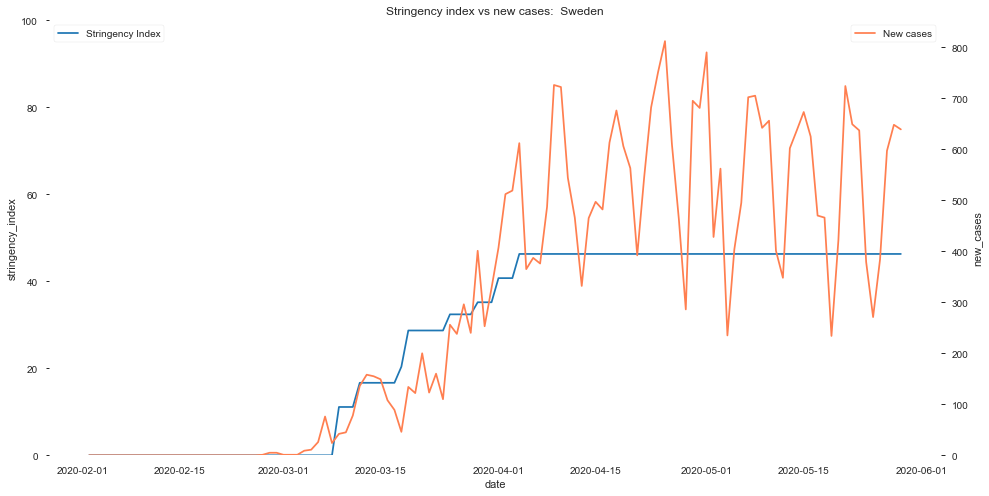

Italy


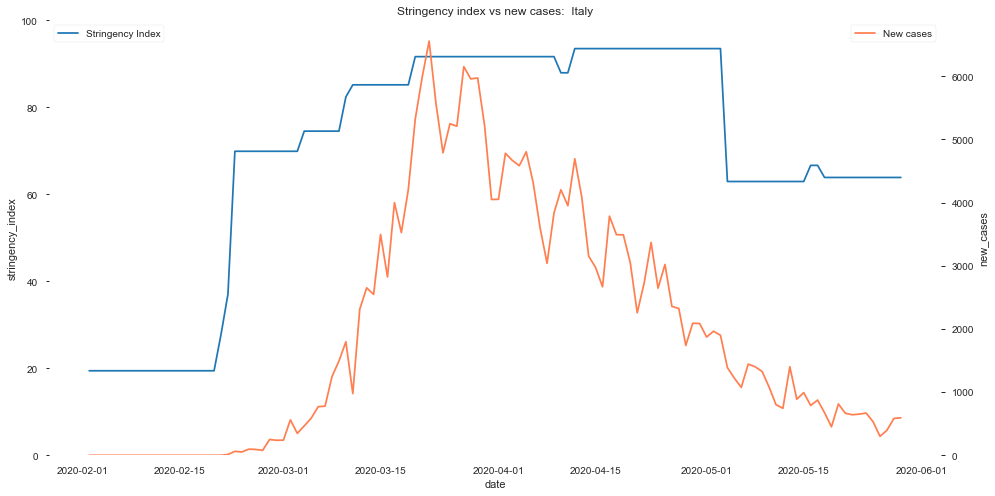

United Kingdom


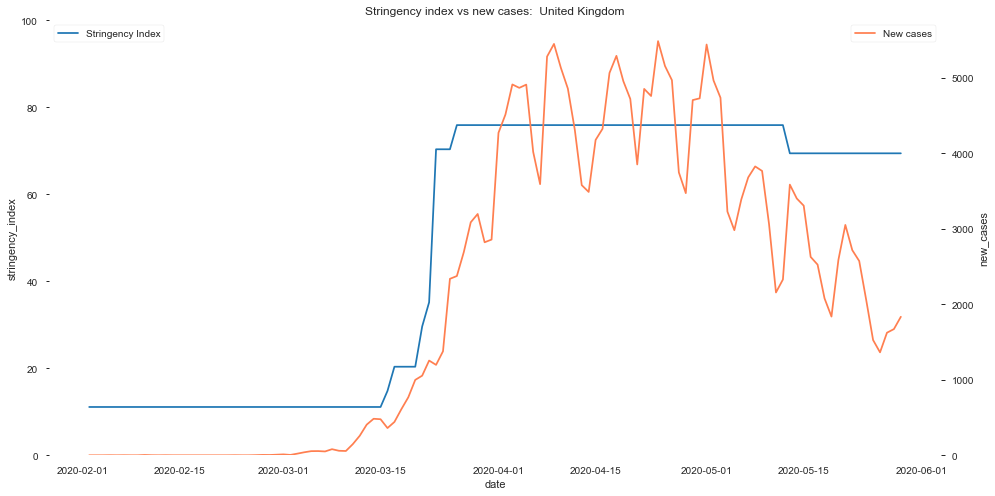

Germany


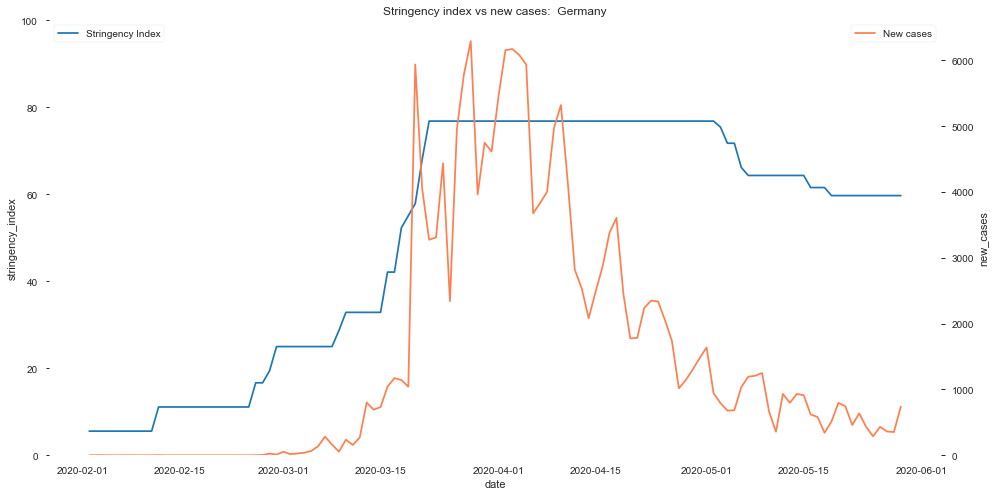

South Korea


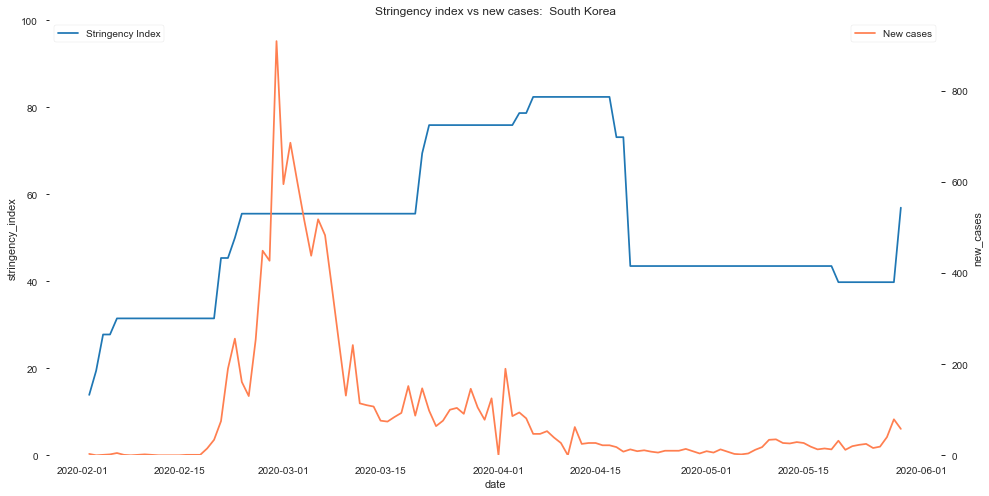

In [44]:
### Stringency Index vs total cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-05-30'

for country in countries1:
    print(country)
    temp2 = []
    temp2 = merge[merge.location.isin([country])]
    temp2 = temp2[(temp2['date'] > dstart ) & (temp2['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index", label='Stringency Index')
    ax.set(ylim=(0, 100))
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="new_cases", label='New cases', color='coral')
    ax2.set(ylim=(0, None))
    #ax2.set(yscale='log')
    plt.legend(loc=1)

    #ax.set(xlim=(10, 1000000))
    plt.title('Stringency index vs new cases:  ' + country)
    plt.savefig('output/Stringency_vs_new_cases' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

United States


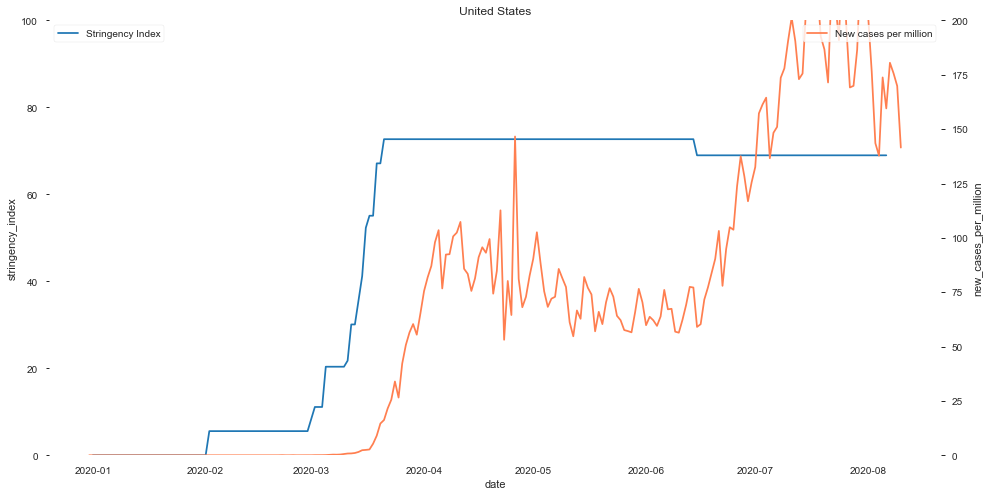

France


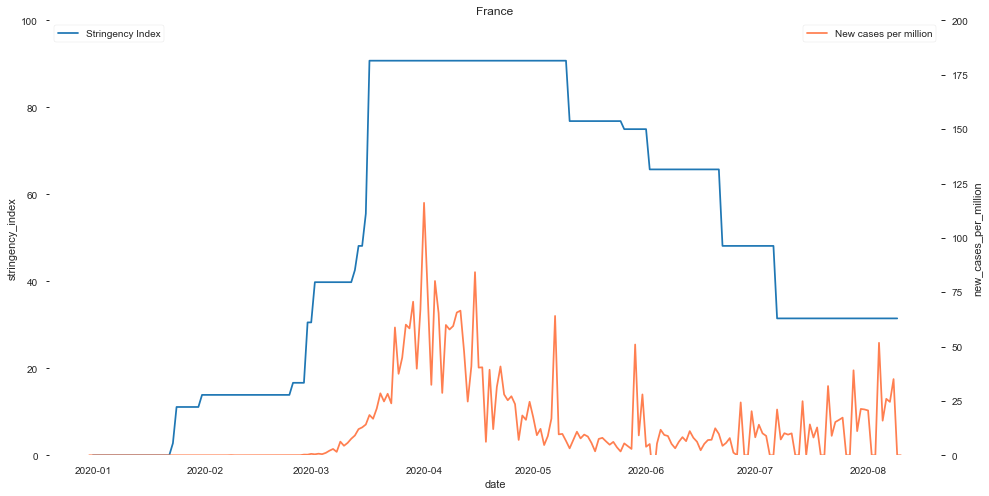

Spain


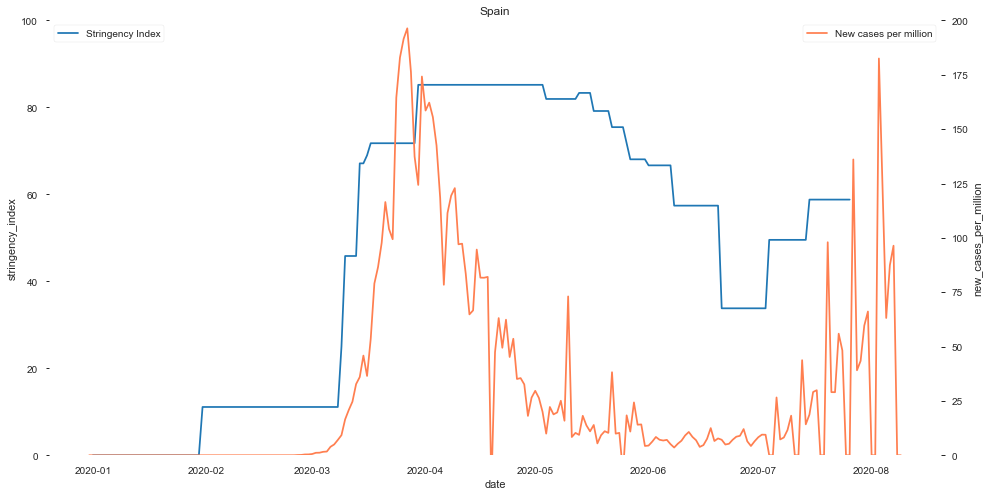

Switzerland


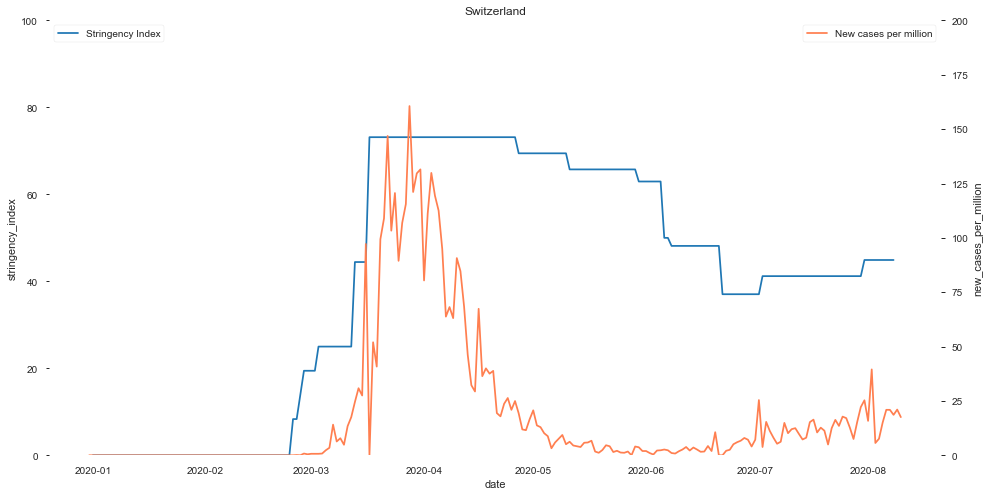

Sweden


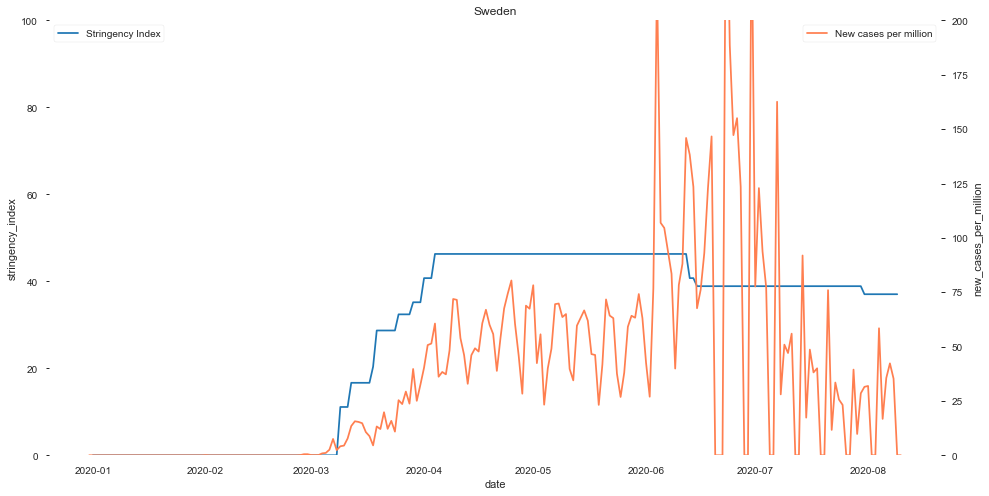

Italy


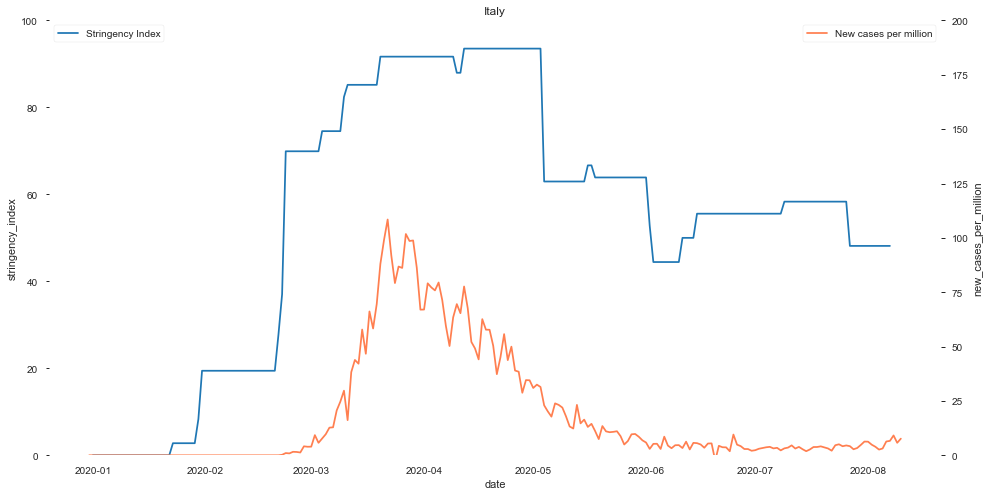

United Kingdom


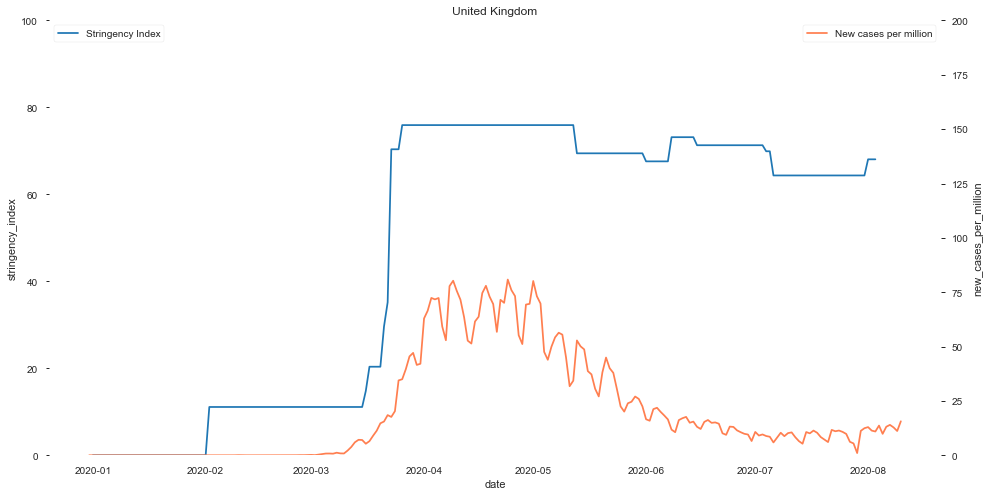

Germany


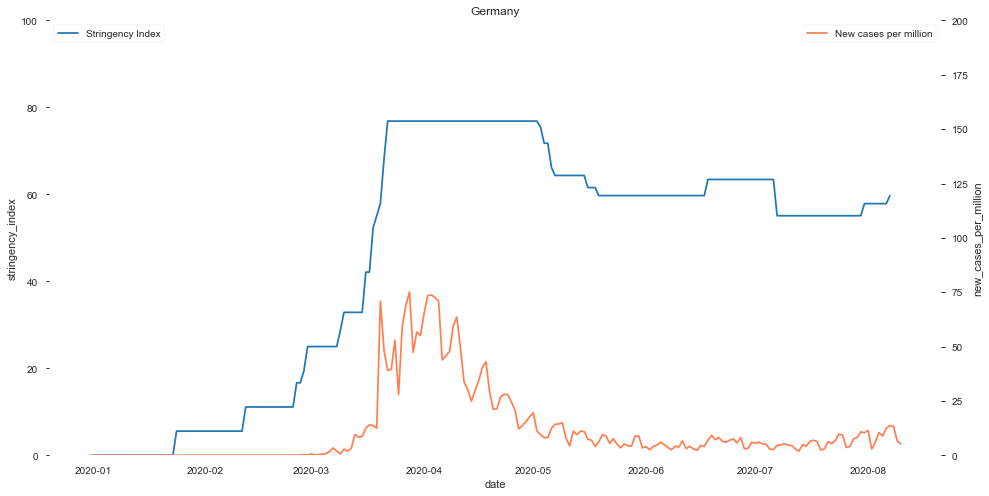

South Korea


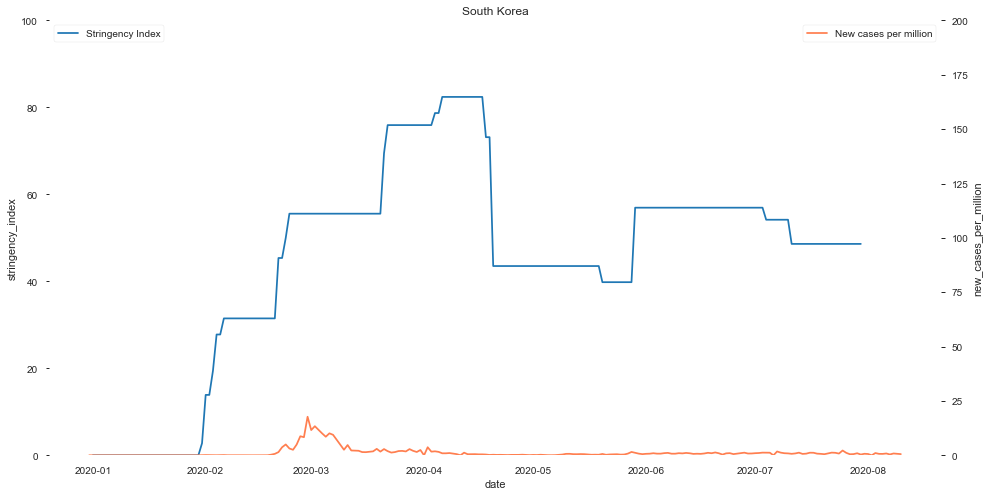

In [45]:
### Compare Stringency Index with cases per million

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy', 'United Kingdom', 'Germany', 'South Korea']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = merge[merge.location.isin([i])]
    
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index", label='Stringency Index')
    ax.set(ylim=(0, 100))
    plt.legend(loc=2)
    
    # Total cases plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="new_cases_per_million", color='coral', label='New cases per million')
    ax2.set(ylim=(0, 200))
    plt.legend(loc=1)
    #ax2.set(yscale='log')
    #plt.legend(bbox_to_anchor=(0.15, 0.8))
    
    
    #ax.set(yscale='log')
    plt.title(i) 
    plt.savefig('output/Stringency_new_cases_per_million_' + i + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

United States


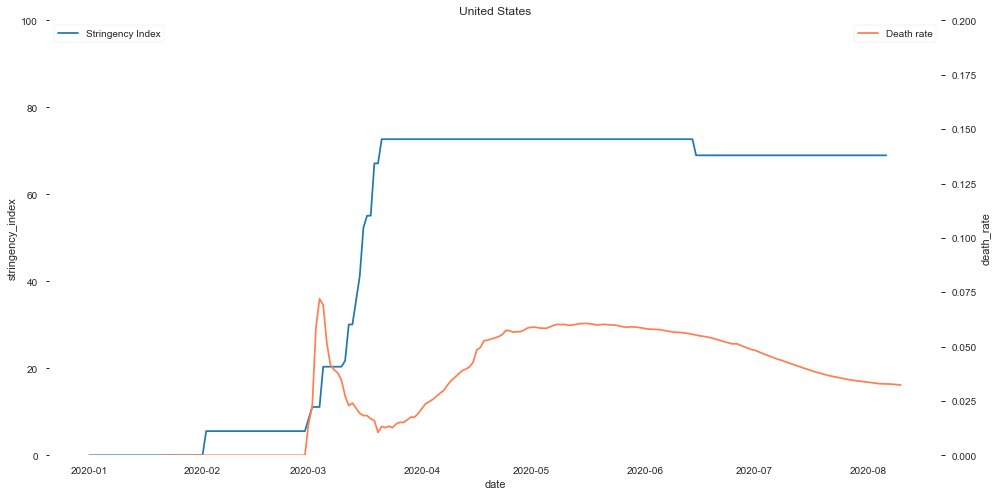

France


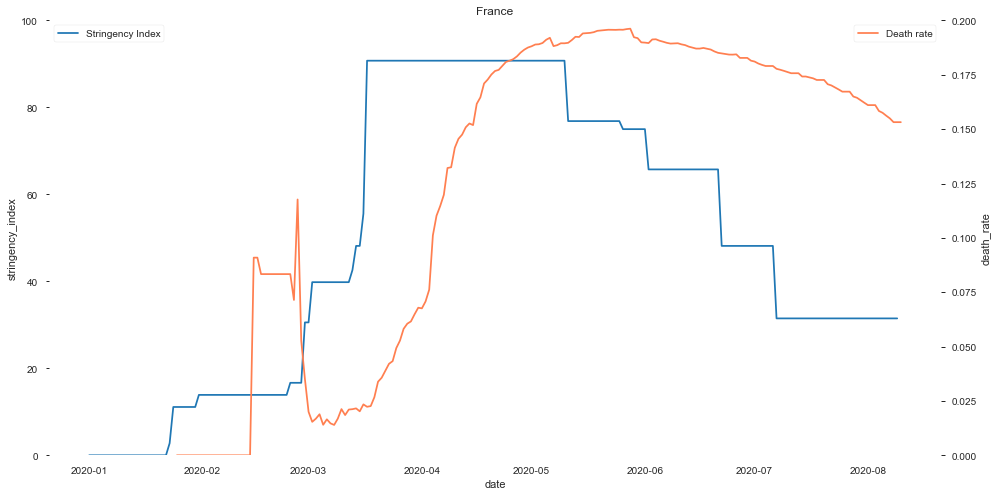

Spain


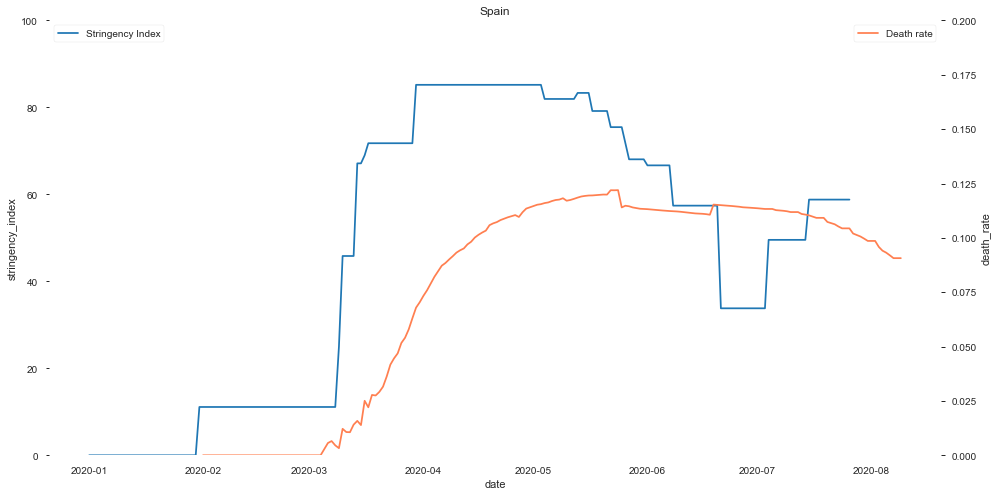

Switzerland


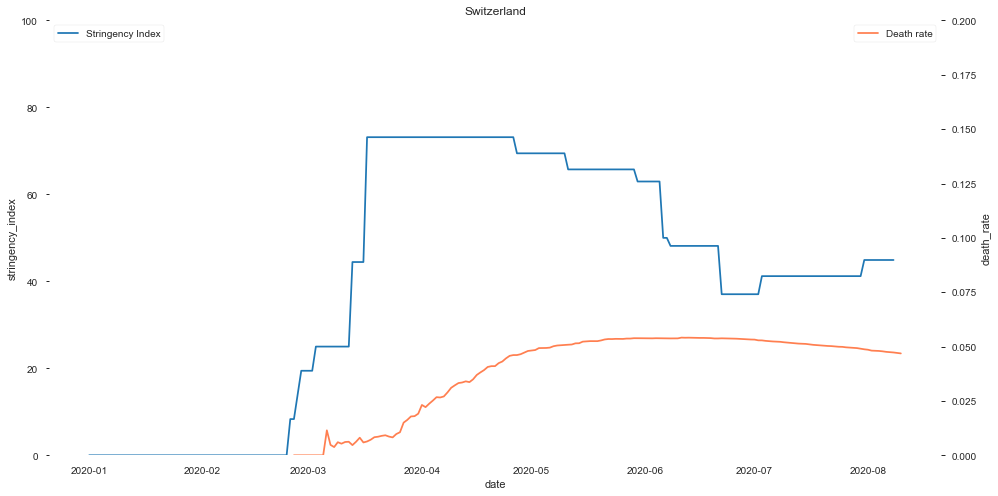

In [46]:
### Comparison Stringency index vs death rate

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland']

for i in countries1:
    print(i)
    temp2 = []
    temp2 = merge[merge.location.isin([i])]
    
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp2, x="date", y="stringency_index", label='Stringency Index')
    ax.set(ylim=(0, 100))
    plt.legend(loc=2)
    
    #Total cases plot
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp2, x="date", y="death_rate", color='coral', label='Death rate')
    ax2.set(ylim=(0, .2))
    #ax2.set(yscale='log')
    #plt.legend(bbox_to_anchor=(0.15, 0.8))
    
    #axis
    #ax.set(yscale='log')
    plt.title(i) 
    plt.savefig('output/Stringency_death_rate_' + i + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

## Stringency Index vers new and total cases

United States


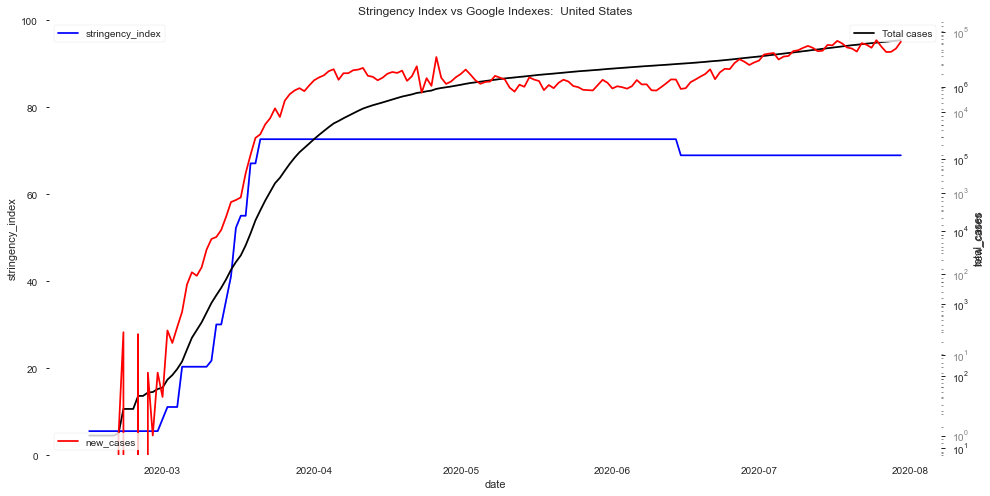

France


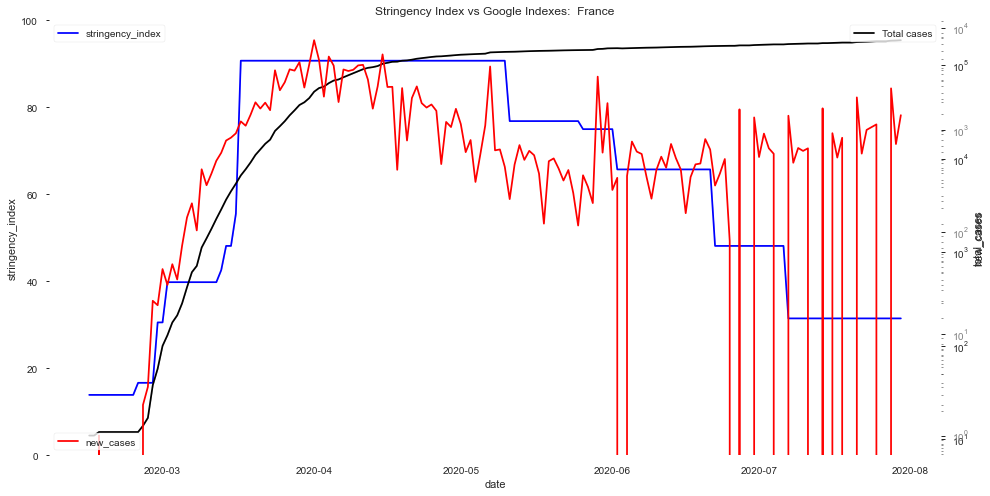

Spain


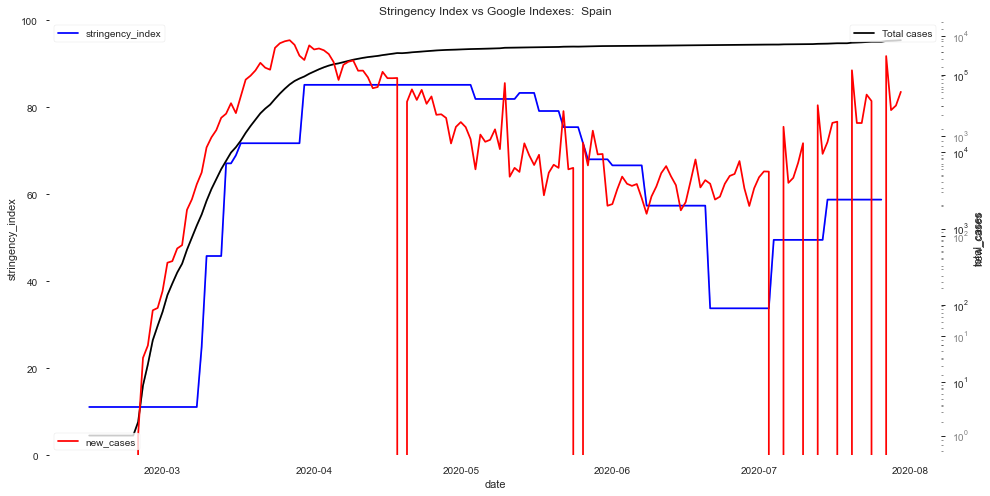

Switzerland


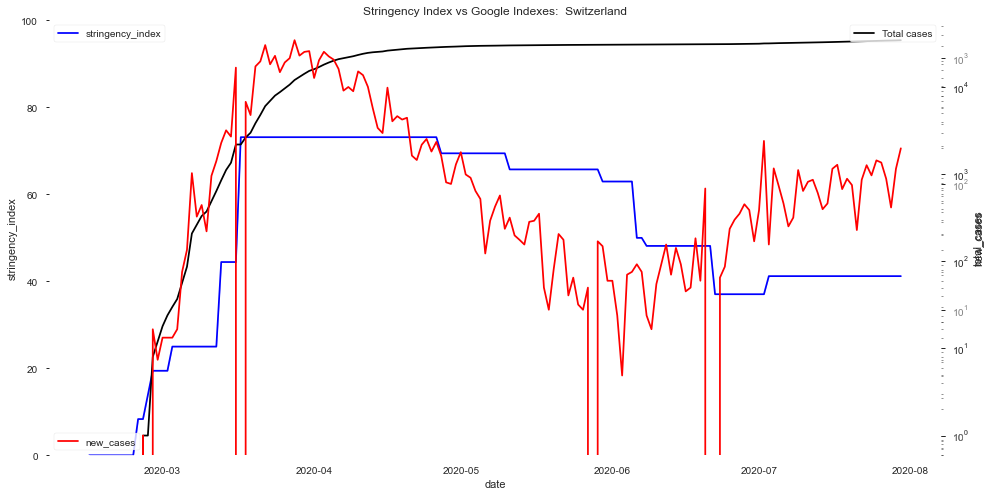

Sweden


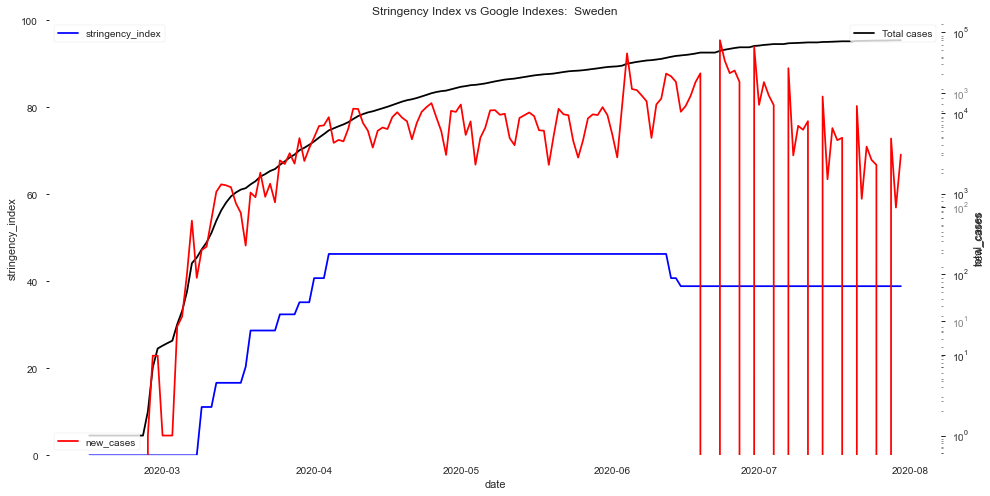

Italy


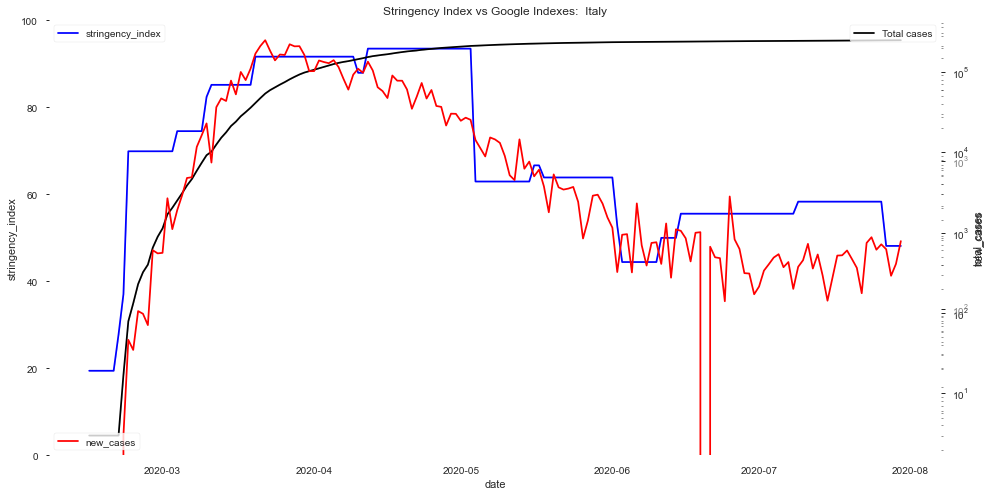

United Kingdom


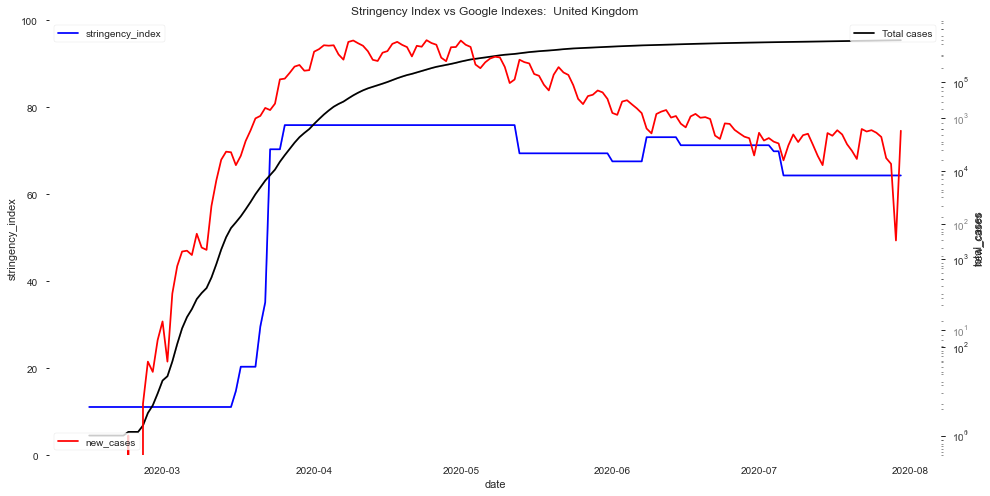

Germany


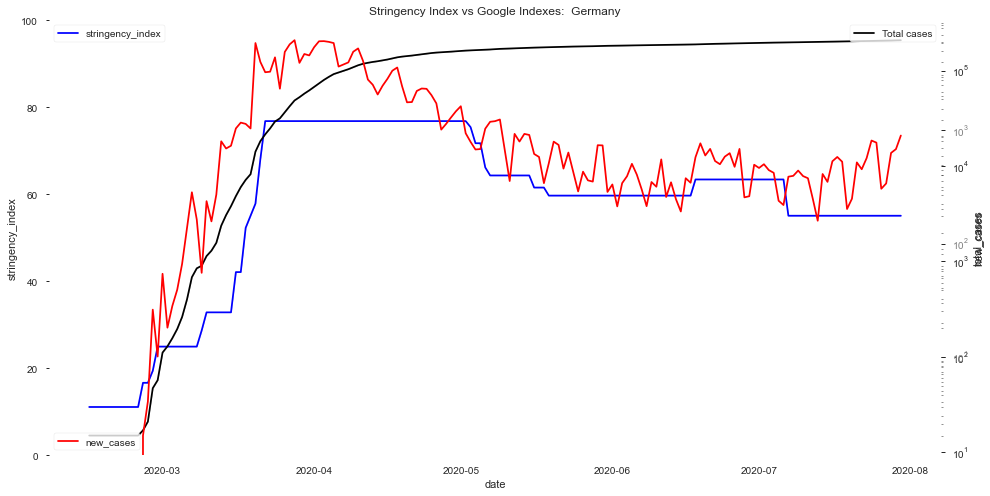

South Korea


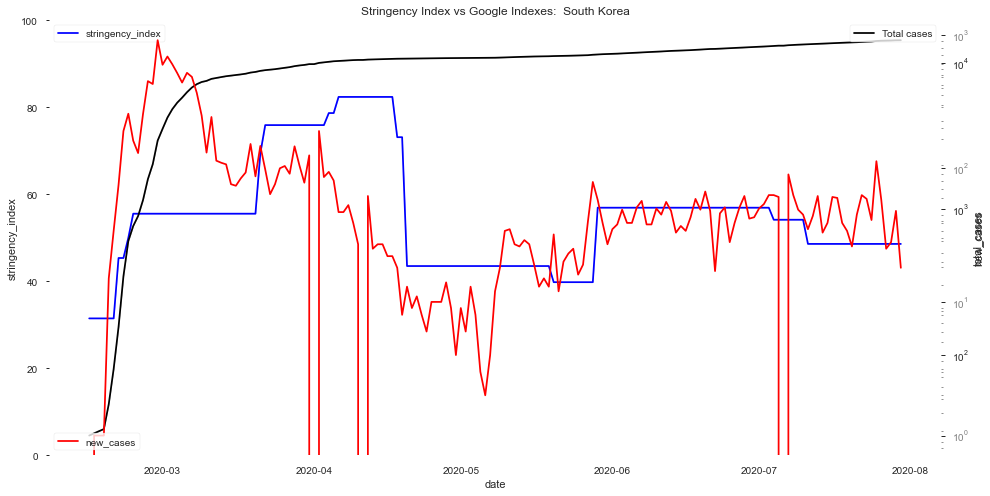

In [47]:
### Stringency Index vs cases vs new cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-07-31'

for country in countries1:
    print(country)
    temp = []
    temp = merge_gf[merge_gf.location.isin([country])]
    temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax1 = sns.lineplot(data=temp, x="date", y="stringency_index", label='stringency_index', color='blue')
    #ax1.set(yscale='log')
    ax.set(ylim=(0, 100))
    plt.ylabel('stringency_index')
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp, x="date", y="total_cases", label='Total cases', color='black')
    #ax2.set(ylim=(0, 100))
    ax2.set(yscale='log')
    plt.legend(loc=1)
    
    # Plot 3
    ax3 = ax.twinx()
    ax3 = sns.lineplot(data=temp, x="date", y="new_cases", label='new_cases', color='red')
    #ax3.set(ylim=(0, 100))
    ax3.set(yscale='log')
    ax3.tick_params(axis='y', labelcolor='grey')
    #ax3.yaxis.set_label_coords(5.1, 0)
    plt.legend(loc=3)


    #ax.set(xlim=(10, 1000000))
    plt.title('Stringency Index vs Google Indexes:  ' + country)
    plt.savefig('output/Response per coutry_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

## Correlation between the stringency index and the number of cases (per country)

In [48]:
### Compare correlations between stringency index and cases

from IPython.display import display

countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy', 'United Kingdom',
              'Germany', 'South Korea']

for i in countries1:
    print(" ")
    print(i)
    temp = []
    temp = merge[merge.location.isin([i])]
    temp = temp[['stringency_index', 'new_cases', 'total_cases', 'death_rate']]

    display(temp.corr().style.background_gradient(cmap='Reds').format("{:.3f}"))

 
United States


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.712,0.602,0.753
new_cases,0.712,1.000,0.894,0.449
total_cases,0.602,0.894,1.000,0.431
death_rate,0.753,0.449,0.431,1.000


 
France


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.587,0.402,0.412
new_cases,0.587,1.000,0.113,0.038
total_cases,0.402,0.113,1.000,0.914
death_rate,0.412,0.038,0.914,1.000


 
Spain


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.555,0.689,0.696
new_cases,0.555,1.000,0.103,0.039
total_cases,0.689,0.103,1.000,0.949
death_rate,0.696,0.039,0.949,1.000


 
Switzerland


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.526,0.682,0.133
new_cases,0.526,1.000,0.005,-0.482
total_cases,0.682,0.005,1.000,0.971
death_rate,0.133,-0.482,0.971,1.000


 
Sweden


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.588,0.599,0.903
new_cases,0.588,1.000,0.395,0.529
total_cases,0.599,0.395,1.000,0.480
death_rate,0.903,0.529,0.480,1.000


 
Italy


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.710,0.398,0.373
new_cases,0.710,1.000,-0.044,0.088
total_cases,0.398,-0.044,1.000,0.939
death_rate,0.373,0.088,0.939,1.000


 
United Kingdom


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.685,0.758,0.901
new_cases,0.685,1.000,0.145,0.420
total_cases,0.758,0.145,1.000,0.894
death_rate,0.901,0.420,0.894,1.000


 
Germany


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.589,0.744,0.623
new_cases,0.589,1.000,0.035,-0.173
total_cases,0.744,0.035,1.000,0.986
death_rate,0.623,-0.173,0.986,1.000


 
South Korea


,stringency_index,new_cases,total_cases,death_rate
stringency_index,1.000,0.280,0.689,0.509
new_cases,0.280,1.000,-0.077,-0.254
total_cases,0.689,-0.077,1.000,0.930
death_rate,0.509,-0.254,0.930,1.000


## 2-axis relationships analysis 

Averages per country have been used for the variables.

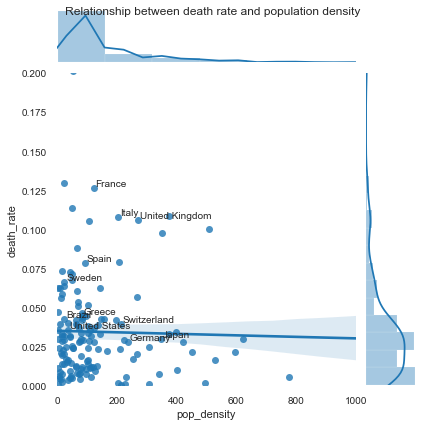

In [49]:
### Death Rate vs Population density

g = sns.jointplot(x='pop_density', y='death_rate', data=countries_data,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,1000));
# g.ax_joint.set_xscale('log')

# indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["pop_density"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
# for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and population density")

plt.savefig('output/Death_rate_vs_pop_density' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

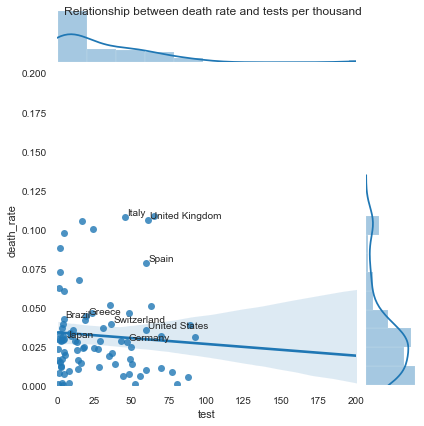

In [50]:
### Death Rate vs Tests

g = sns.jointplot(x='test', y='death_rate', data=countries_data,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,200));
# g.ax_joint.set_xscale('log')

# indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["test"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
# for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and tests per thousand")

plt.savefig('output/Tests_vs_death_rate' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

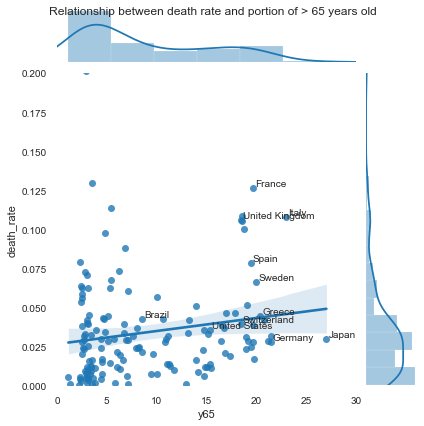

In [51]:
### Death Rate vs > 65 years old

g = sns.jointplot(x='y65', y='death_rate', data=countries_data,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,30));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["y65"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and portion of > 65 years old")

plt.savefig('output/Y65_vs_death_rate' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

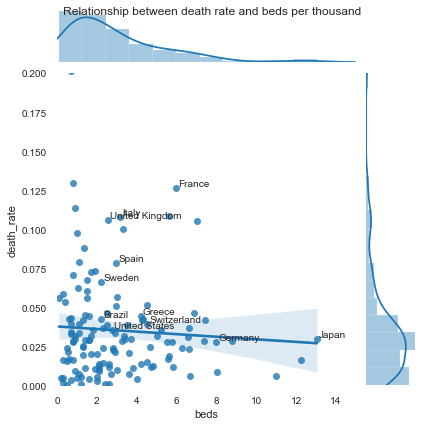

In [52]:
### Death Rate vs number of beds per thousand

g = sns.jointplot(x='beds', y='death_rate', data=countries_data,
              kind="reg", dropna=True, ylim=(0,0.2), xlim=(0,15));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["beds"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between death rate and beds per thousand")

plt.savefig('output/Death_rate_vs_number_of_beds' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

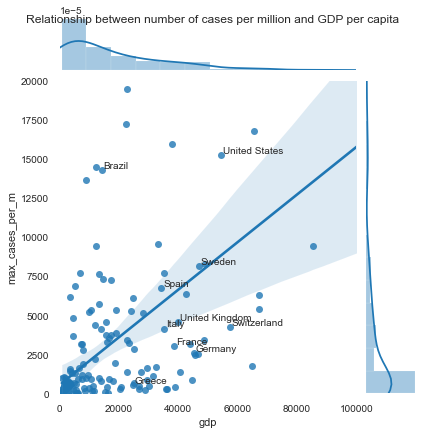

In [53]:
### GDP vs number cases per million

g = sns.jointplot(x='gdp', y='max_cases_per_m', data=countries_data,
              kind="reg", dropna=True, xlim=(0,100000), ylim=(0,20000));
#g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["gdp"], r["max_cases_per_m"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between number of cases per million and GDP per capita")

plt.savefig('output/Total_cases_vs_GDP' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

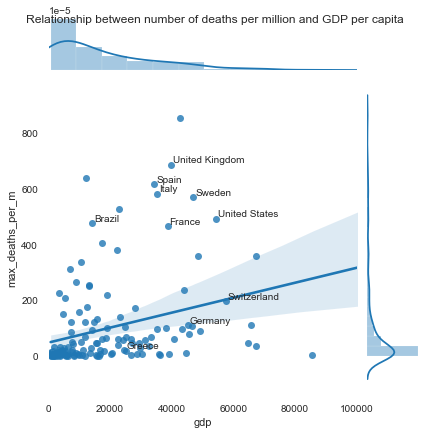

In [54]:
### GDP vs number deaths per million

g = sns.jointplot(x='gdp', y='max_deaths_per_m', data=countries_data,
              kind="reg", dropna=True, xlim=(0,100000));
#g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["gdp"], r["max_deaths_per_m"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Relationship between number of deaths per million and GDP per capita")

plt.savefig('output/Total_deaths_vs_GDP' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

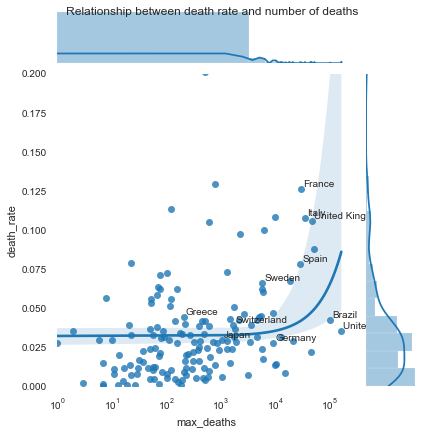

In [55]:
### Death rate vs number deaths

g = sns.jointplot(x='max_deaths', y='death_rate', data=countries_data,
              kind="reg", dropna=True, ylim=(0,0.2));
g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["max_deaths"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)


g.fig.suptitle("Relationship between death rate and number of deaths")
plt.savefig('output/Death_rate_vs_total_deaths' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

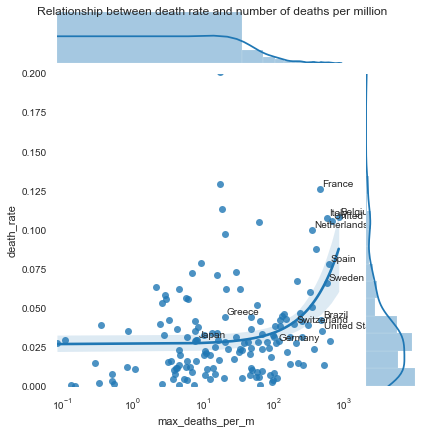

In [56]:
### Death rate vs number deaths per million

g = sns.jointplot(x='max_deaths_per_m', y='death_rate', data=countries_data,
              kind="reg", dropna=True, ylim=(0,0.2));
g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Netherlands', 'Belgium', 'Brazil', 'United States', 'Switzerland', 'Spain', 'Germany', 'Sweden', 'Greece', 'Italy', 'France', 'United Kingdom'])]
        
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["max_deaths_per_m"], r["death_rate"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)


g.fig.suptitle("Relationship between death rate and number of deaths per million")

plt.savefig('output/Death_rate_vs_deaths_per_m' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

# Democratic Index

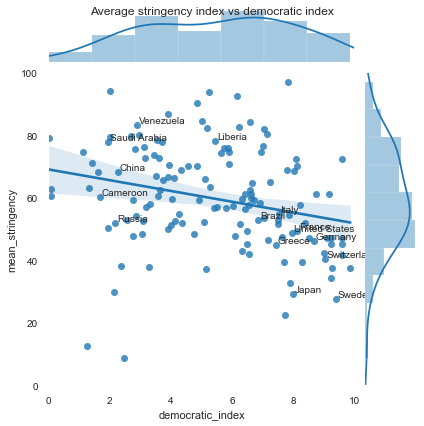

In [57]:
### Demographic index vs Stringency

# Plot
g = sns.jointplot(x='democratic_index', y='mean_stringency', data=countries_data,
              kind="reg", dropna=True, ylim=(0,100), xlim=(0,10));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Germany',
                                     'Sweden', 'Greece', 'Italy', 'France',
                                    'Russia', 'Saudi Arabia', 'China', 'Venezuela', 'Cameroon', 'Liberia'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["democratic_index"], r["mean_stringency"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Average stringency index vs democratic index")

plt.savefig('output/Democracy_index_vs_stringecy' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

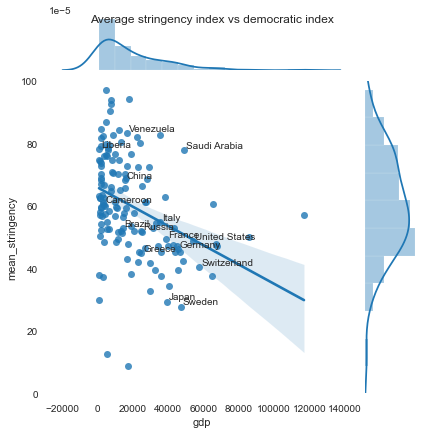

In [58]:
### GDP vs Stringency

# Plot

g = sns.jointplot(x='gdp', y='mean_stringency', data=countries_data,
              kind="reg", dropna=True, ylim=(0,100));
# g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Germany',
                                     'Sweden', 'Greece', 'Italy', 'France',
                                    'Russia', 'Saudi Arabia', 'China', 'Venezuela', 'Cameroon', 'Liberia'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["gdp"], r["mean_stringency"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Average stringency index vs democratic index")

plt.savefig('output/GDP_vs_stringecy' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

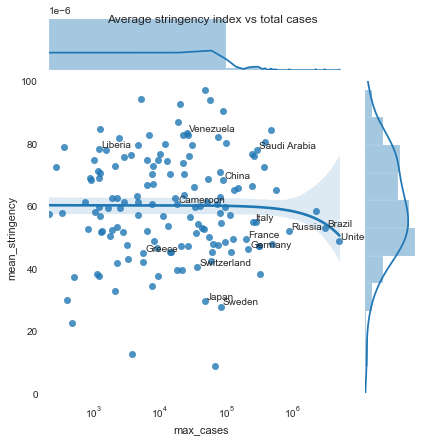

In [59]:
### Max cases vs Stringency

g = sns.jointplot(x='max_cases', y='mean_stringency', data=countries_data,
              kind="reg", dropna=True, ylim=(0,100));
g.ax_joint.set_xscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Germany',
                                     'Sweden', 'Greece', 'Italy', 'France',
                                    'Russia', 'Saudi Arabia', 'China', 'Venezuela', 'Cameroon', 'Liberia'])]


def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["max_cases"], r["mean_stringency"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Average stringency index vs total cases")

plt.savefig('output/max_cases_vs_stringency' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()



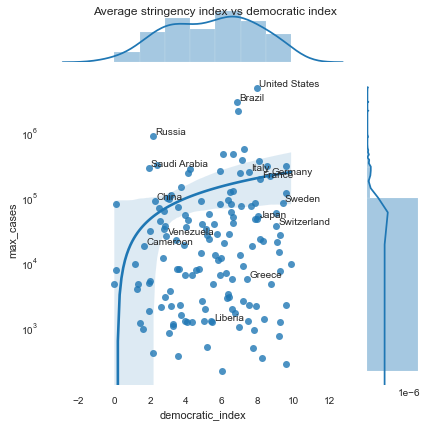

In [60]:
### Democratic index vs max cases

# Plot
g = sns.jointplot(x='democratic_index', y='max_cases', data=countries_data,
              kind="reg", dropna=True);
g.ax_joint.set_yscale('log')

#indices to annotate
head = countries_data[countries_data.index.isin(['Japan', 'Brazil', 'United States', 'Switzerland', 'Germany',
                                     'Sweden', 'Greece', 'Italy', 'France',
                                    'Russia', 'Saudi Arabia', 'China', 'Venezuela', 'Cameroon', 'Liberia'])]
def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=(r["democratic_index"], r["max_cases"]), 
            xytext=(2,2) , textcoords ="offset points", )

for i in head.iterrows():
    ann(i)
#for row in tail.iterrows():
#    ann(row)

g.fig.suptitle("Average stringency index vs democratic index")

plt.savefig('output/Democracy_index_vs_max_cases' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

## Max response vs max cases

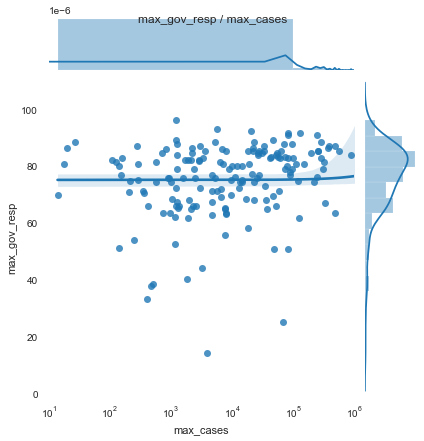

In [61]:
### Max gov response vs max cases

temp = merge

gov = temp.groupby(['location'])['GovernmentResponseIndex'].max()
cases_max = temp.groupby(['location'])['total_cases'].max()

frame = { 'max_cases': cases_max, 'max_gov_resp': gov } 
max_cases_gov_response = pd.DataFrame(frame) 


g = sns.jointplot(x='max_cases', y='max_gov_resp', data=max_cases_gov_response,
              kind="reg", xlim=(10,1000000), ylim=(0,110), dropna=True);
g.ax_joint.set_xscale('log')
g.fig.suptitle('max_gov_resp / max_cases')
plt.savefig('output/max_gov_resp vs max_cases' + '.png', format="PNG", dpi=300, bbox_inches='tight')

# Analysis of the Google Indexes 

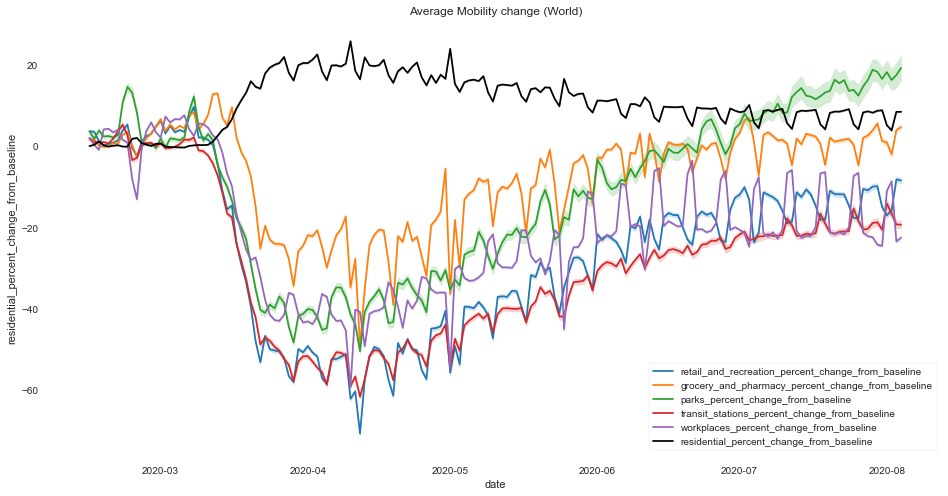

In [62]:
### Google indexes

f, ax = plt.subplots(figsize=(16, 8))
ax = sns.lineplot(data=gf, x="date", y="retail_and_recreation_percent_change_from_baseline", label='retail_and_recreation_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="grocery_and_pharmacy_percent_change_from_baseline", label='grocery_and_pharmacy_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="parks_percent_change_from_baseline", label='parks_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="transit_stations_percent_change_from_baseline", label='transit_stations_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="workplaces_percent_change_from_baseline", label='workplaces_percent_change_from_baseline')
ax = sns.lineplot(data=gf, x="date", y="residential_percent_change_from_baseline", label='residential_percent_change_from_baseline', color='black')

#ax.set(xlim=(10, 1000000))
#ax.set(xscale='log')
plt.title('Average Mobility change (World)')
plt.savefig('output/Google_indexes_World' + '.png', format="PNG", dpi=300, bbox_inches='tight')
plt.show()

## Comparison with Stringency Indexes

North America


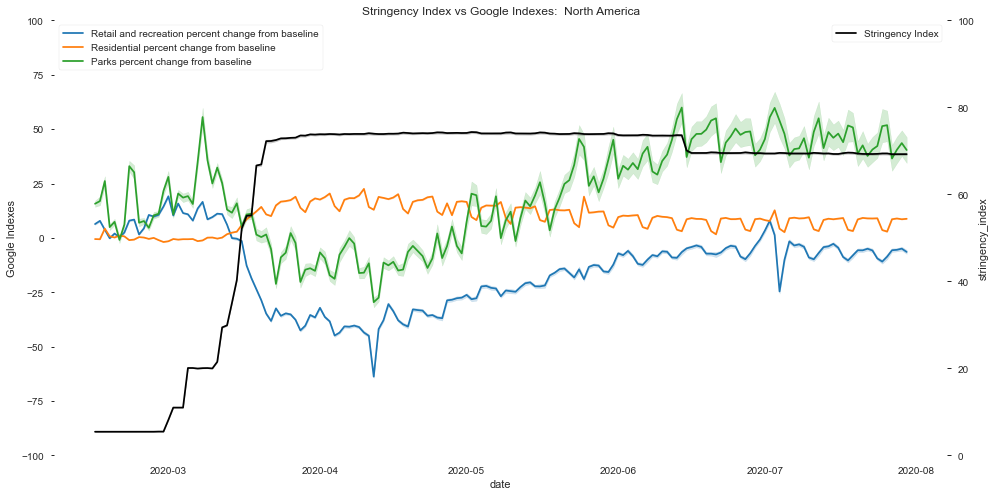

South America


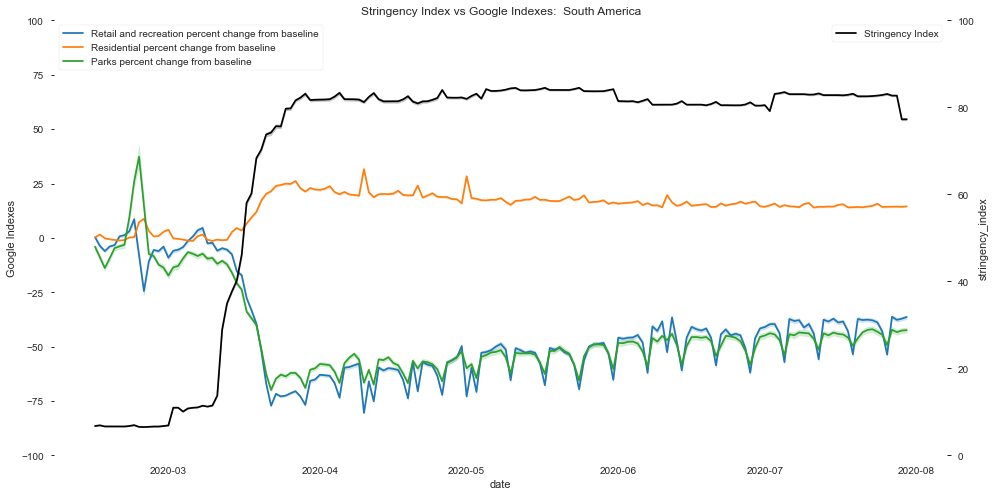

Asia


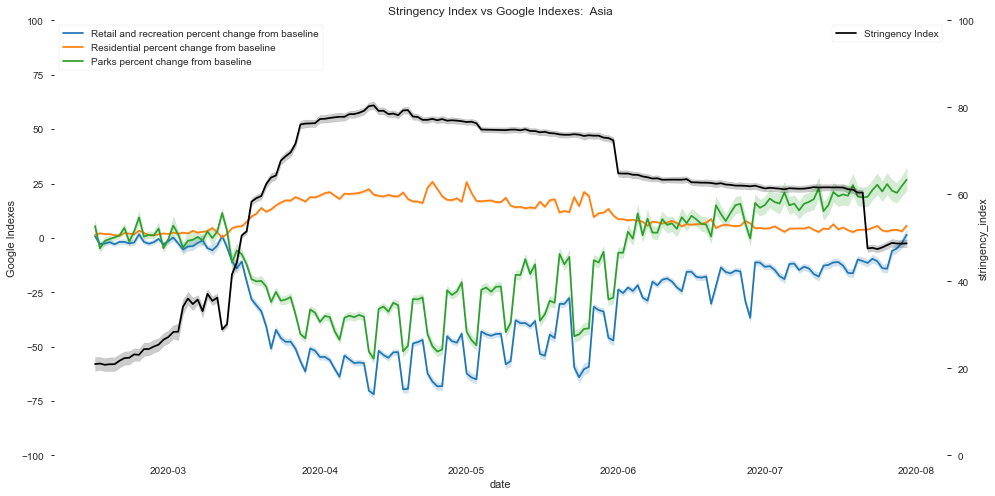

Oceania


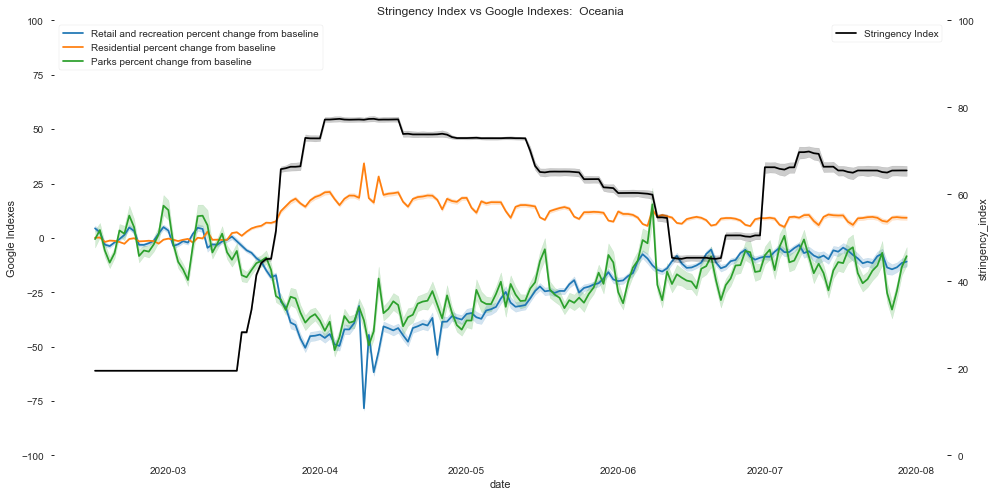

Africa


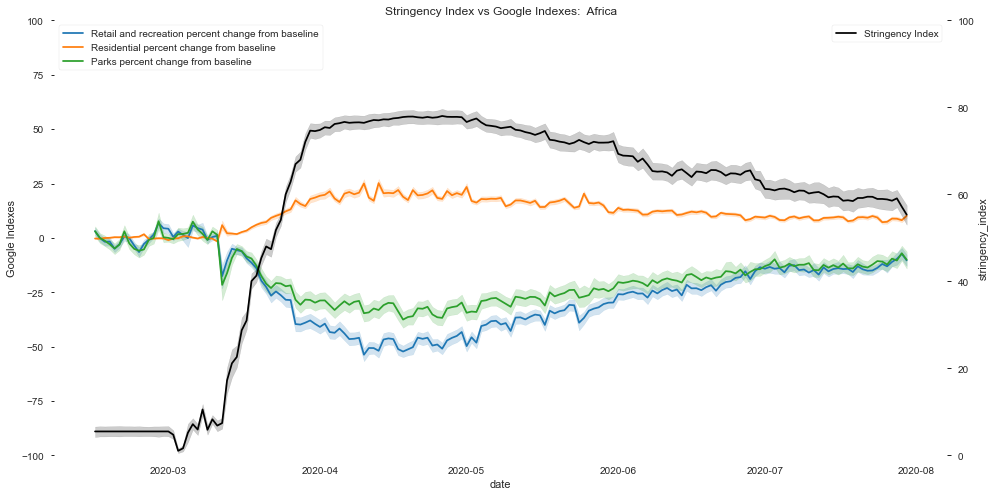

Europe


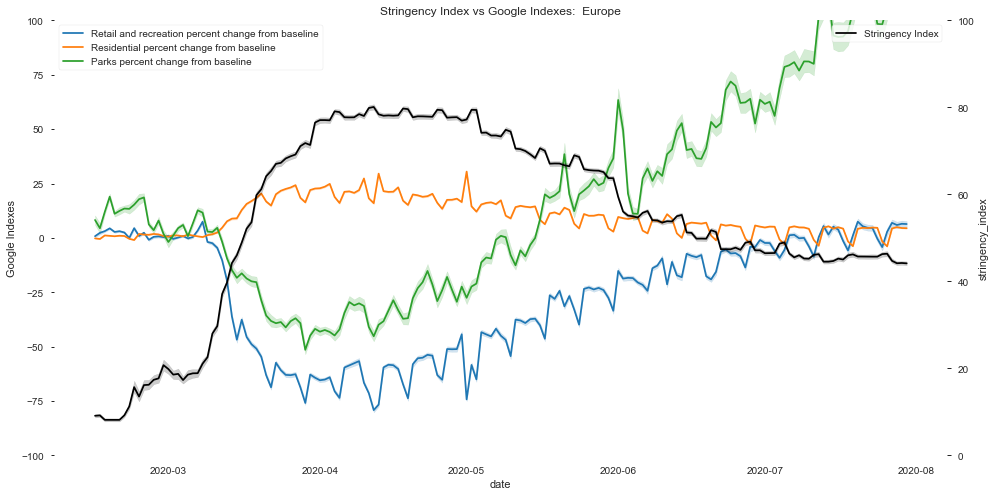

In [63]:
### Google Indexes vs Stringency Index in Continents

continents = ['North America', 'South America', 'Asia', 'Oceania', 'Africa', 'Europe']

# Range
dstart = '2020-02-01'
dend = '2020-07-31'

for continent in continents:
    print(continent)
    temp = []
    temp = merge_gf[merge_gf.continent.isin([continent])]
    temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp, x="date", y="retail_and_recreation_percent_change_from_baseline", label='Retail and recreation percent change from baseline')
    ax = sns.lineplot(data=temp, x="date", y="residential_percent_change_from_baseline", label='Residential percent change from baseline')
    ax = sns.lineplot(data=temp, x="date", y="parks_percent_change_from_baseline", label='Parks percent change from baseline') 
    plt.ylabel('Google Indexes')
    ax.set(ylim=(-100, 100))
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp, x="date", y="stringency_index", label='Stringency Index', color='black')
    ax2.set(ylim=(0, 100))
    #ax2.set(yscale='log')
    plt.legend(loc=1)

    #ax.set(xlim=(10, 1000000))
    plt.title('Stringency Index vs Google Indexes:  ' + continent)
    plt.savefig('output/Stringency_index_vs_mobility_indexes_' + continent + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

United States


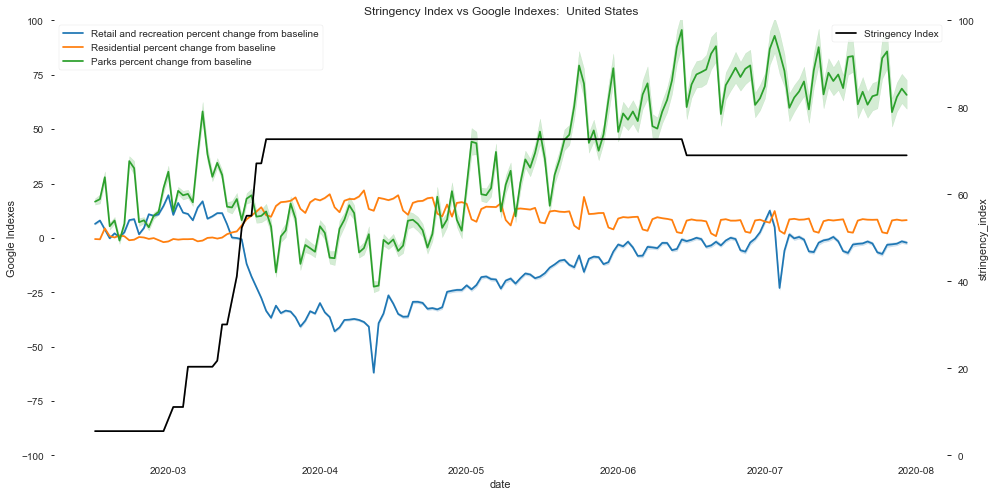

France


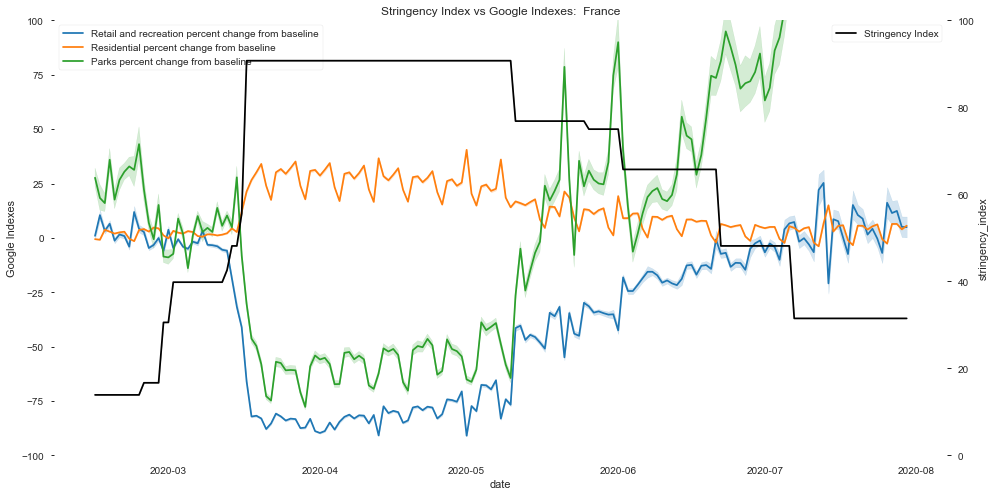

Spain


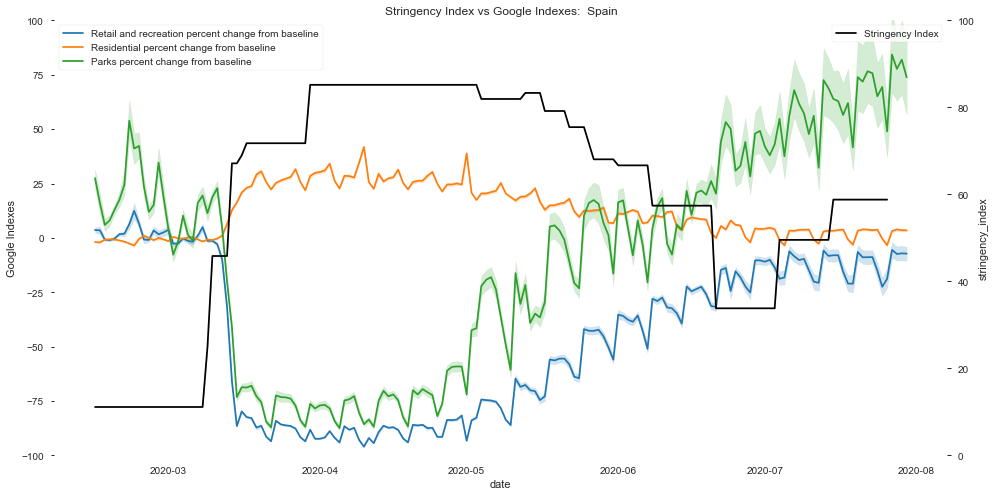

Switzerland


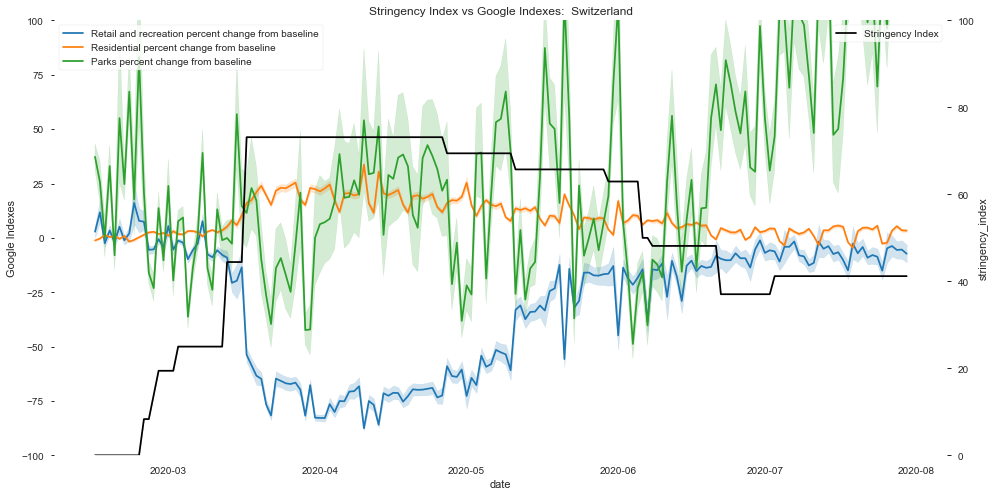

Sweden


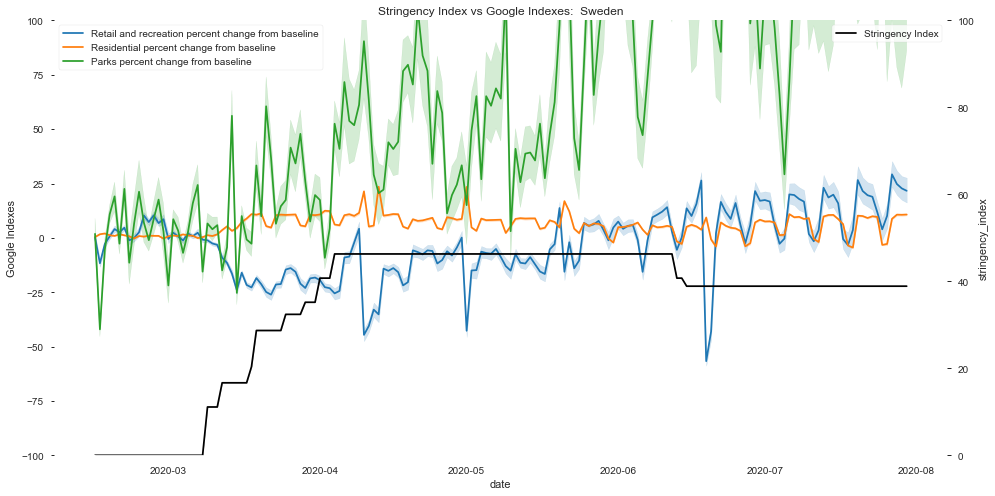

Italy


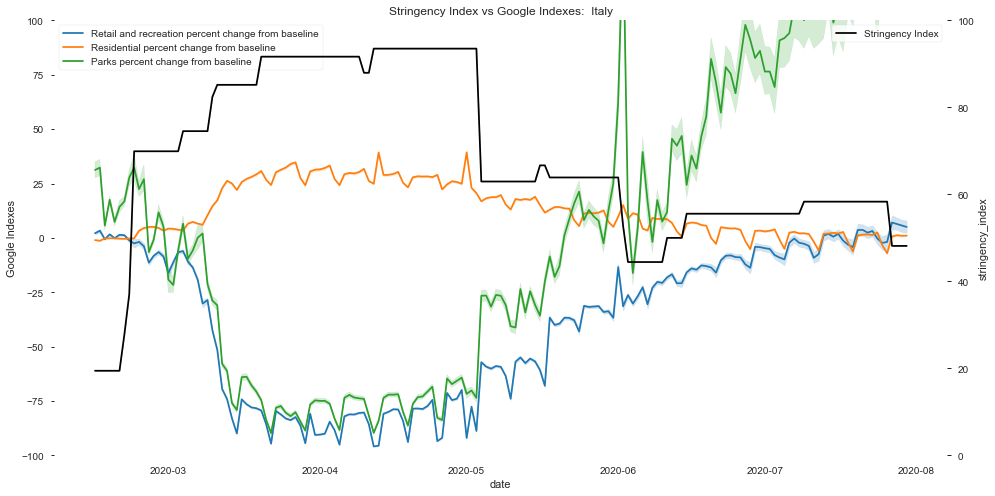

United Kingdom


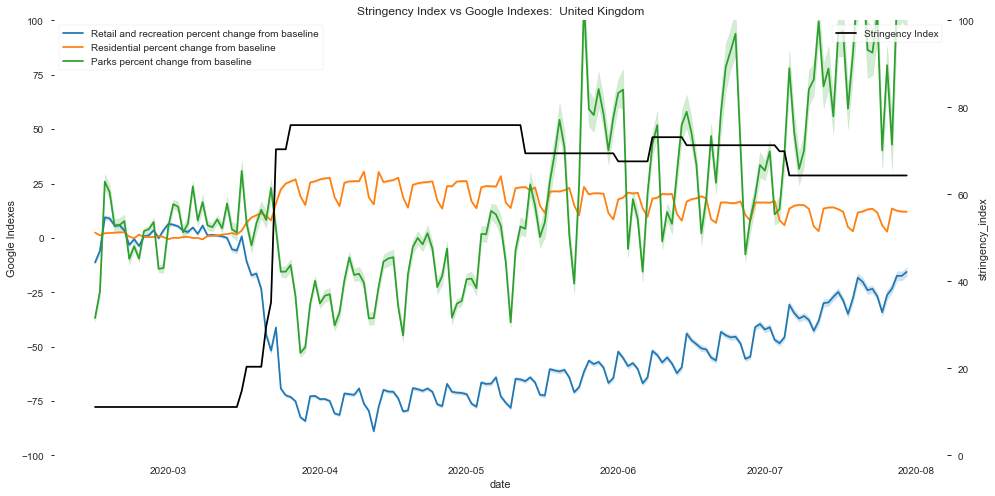

Germany


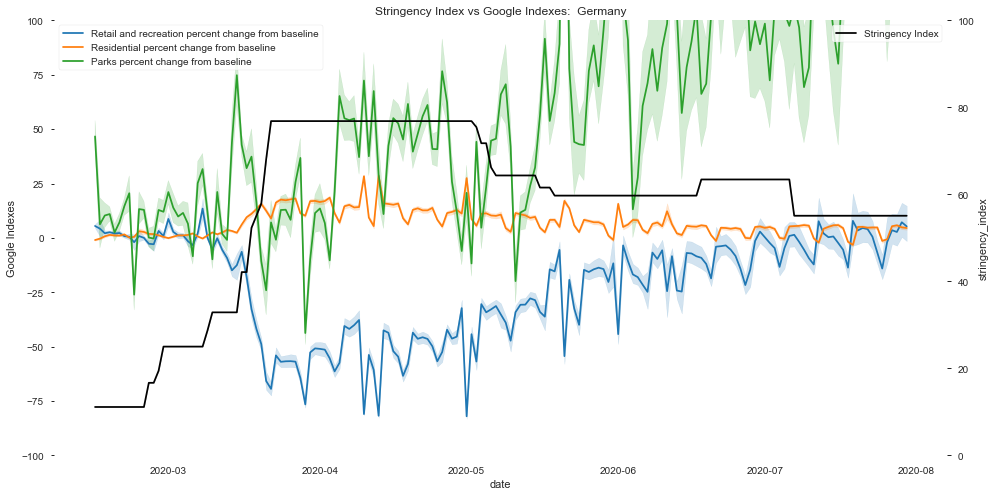

South Korea


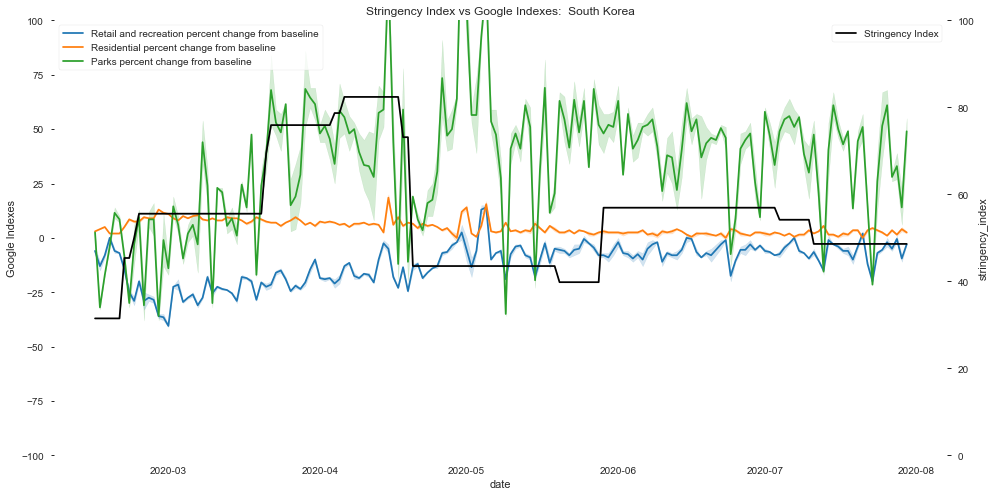

In [64]:
### Google Indexes vs Stringency Index

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-07-31'

for country in countries1:
    print(country)
    temp = []
    temp = merge_gf[merge_gf.location.isin([country])]
    temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp, x="date", y="retail_and_recreation_percent_change_from_baseline", label='Retail and recreation percent change from baseline')
    ax = sns.lineplot(data=temp, x="date", y="residential_percent_change_from_baseline", label='Residential percent change from baseline')
    ax = sns.lineplot(data=temp, x="date", y="parks_percent_change_from_baseline", label='Parks percent change from baseline') 
    plt.ylabel('Google Indexes')
    ax.set(ylim=(-100, 100))
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp, x="date", y="stringency_index", label='Stringency Index', color='black')
    ax2.set(ylim=(0, 100))
    #ax2.set(yscale='log')
    plt.legend(loc=1)

    #ax.set(xlim=(10, 1000000))
    plt.title('Stringency Index vs Google Indexes:  ' + country)
    plt.savefig('output/Stringency_index_vs_mobility_indexes_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()

United States


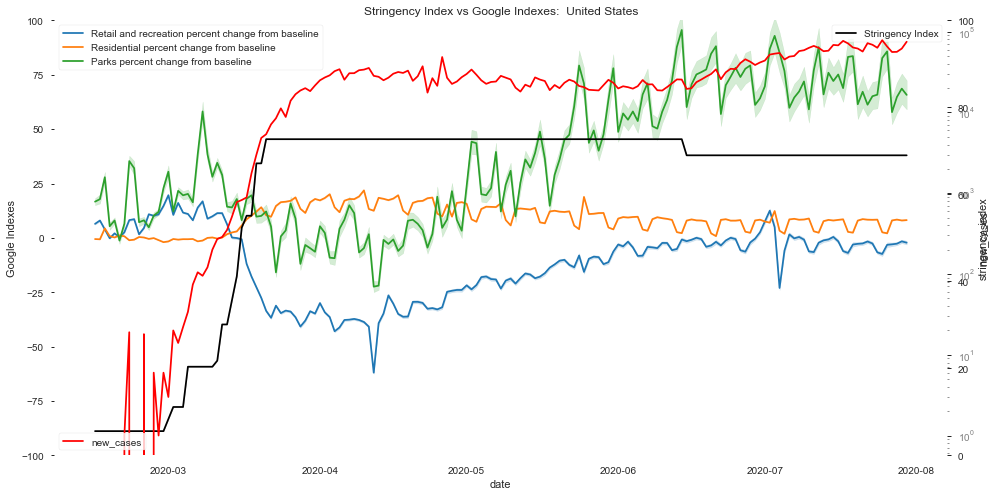

France


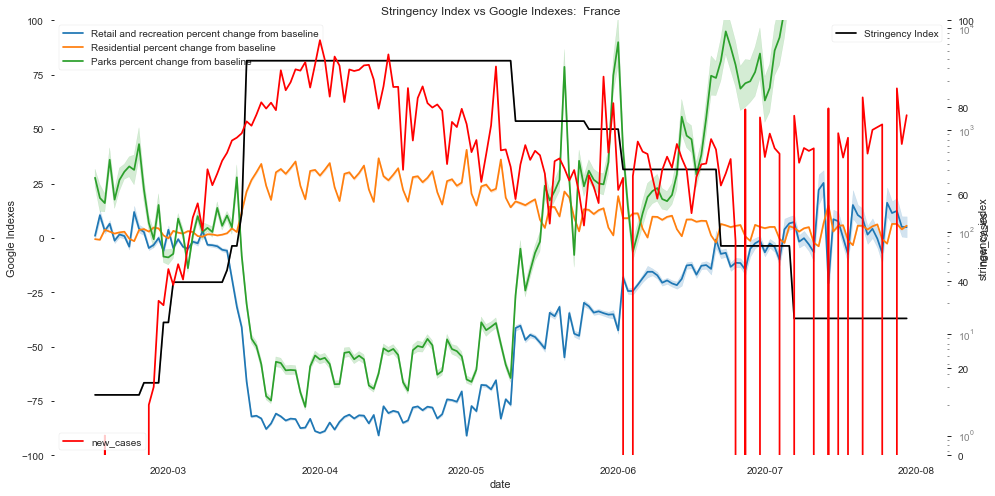

Spain


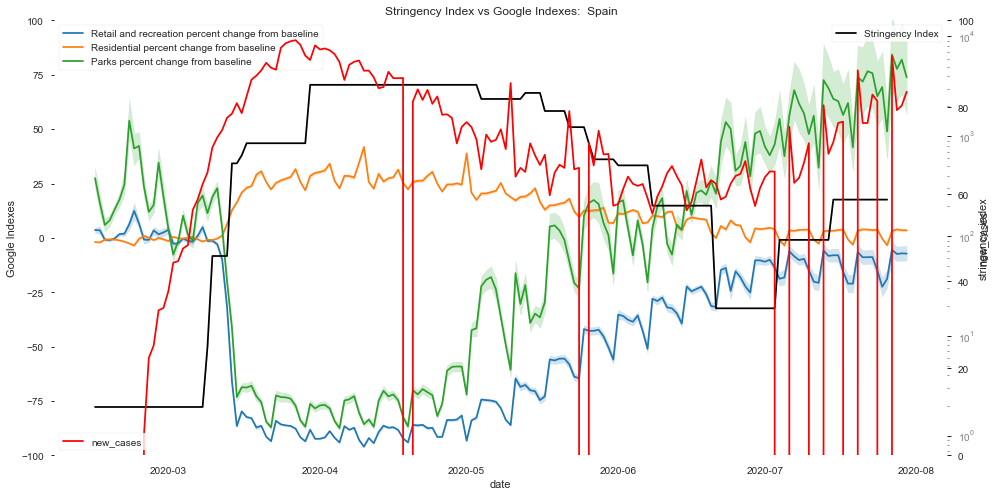

Switzerland


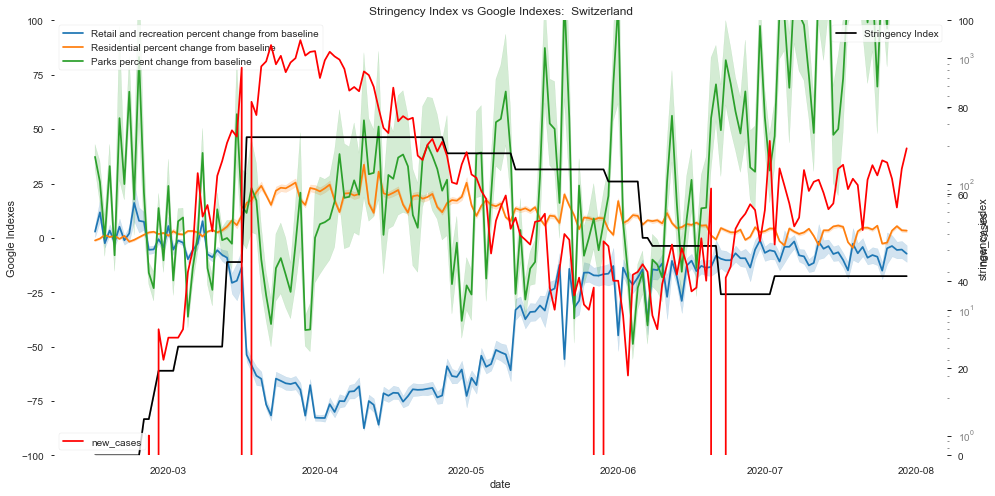

Sweden


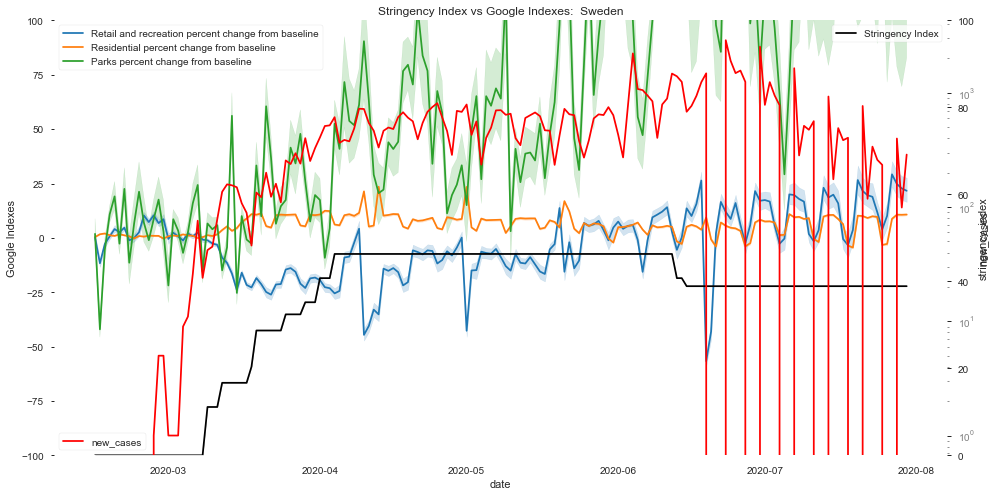

Italy


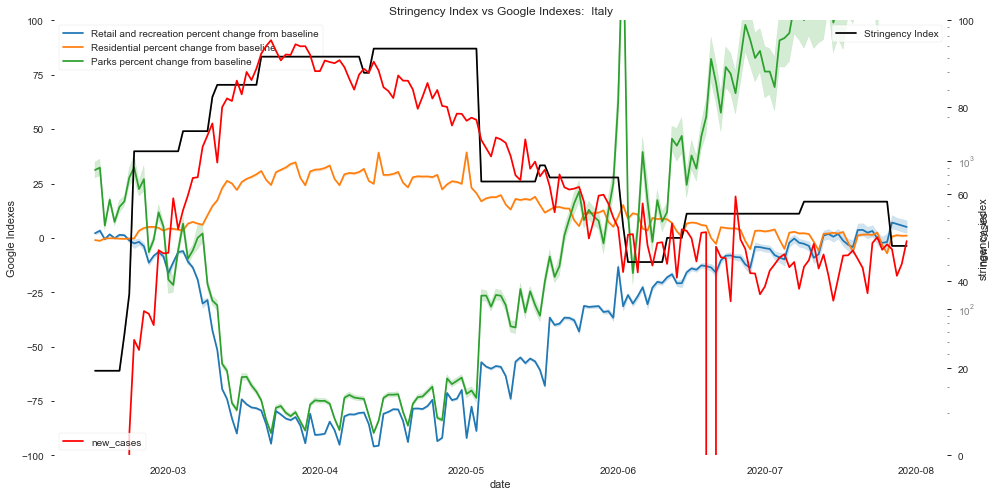

United Kingdom


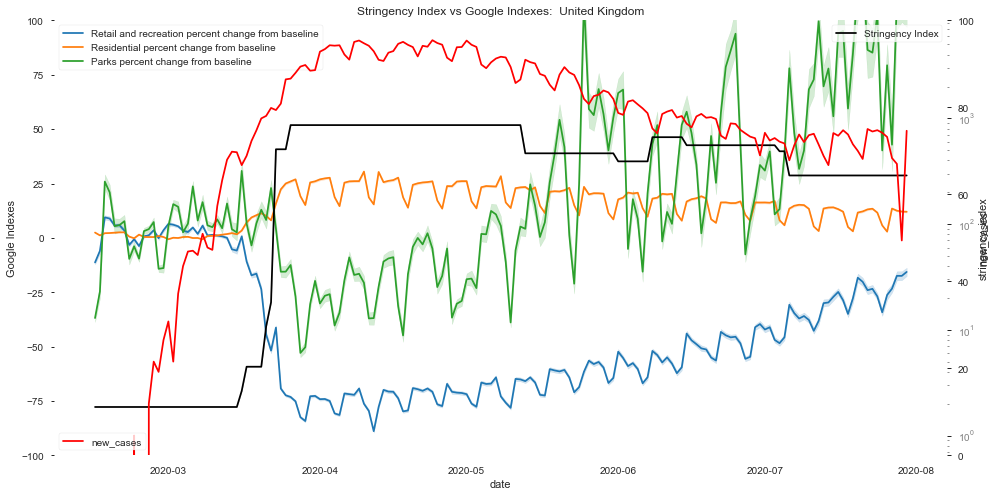

Germany


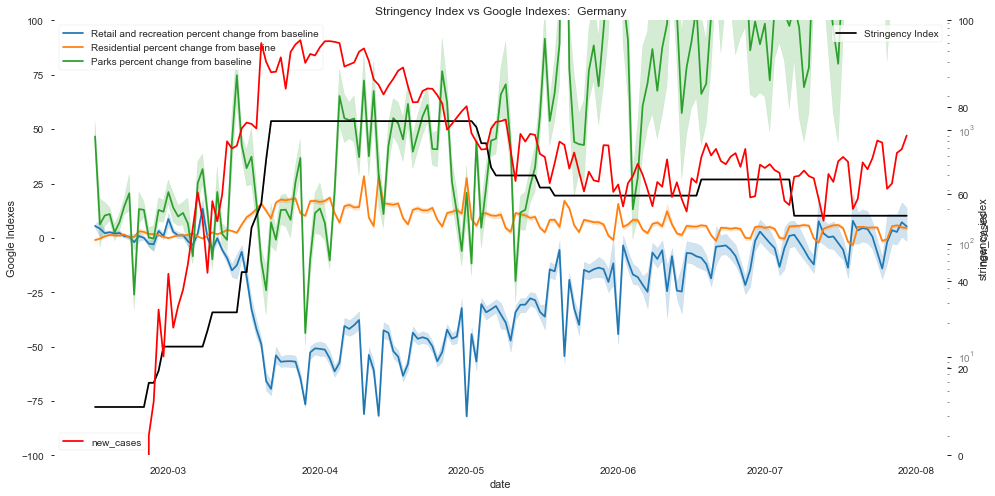

South Korea


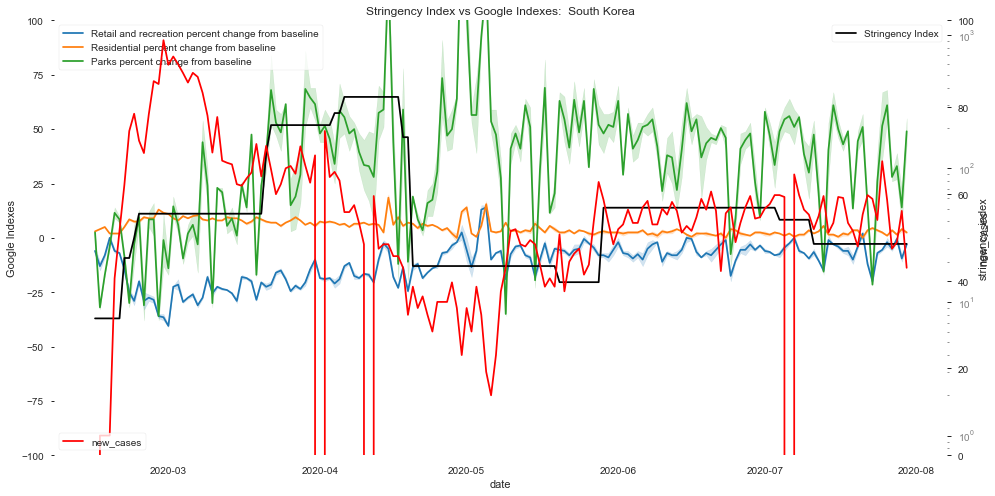

In [65]:
### Google Indexes vs Stringency Index vs new cases

# Coutries selected
countries1 = ['United States', 'France', 'Spain', 'Switzerland', 'Sweden', 'Italy',
              'United Kingdom', 'Germany', 'South Korea']

# Range
dstart = '2020-02-01'
dend = '2020-07-31'

for country in countries1:
    print(country)
    temp = []
    temp = merge_gf[merge_gf.location.isin([country])]
    temp = temp[(temp['date'] > dstart ) & (temp['date'] < dend )]

    # Plot 1
    f, ax = plt.subplots(figsize=(16, 8))
    ax = sns.lineplot(data=temp, x="date", y="retail_and_recreation_percent_change_from_baseline", label='Retail and recreation percent change from baseline')
    ax = sns.lineplot(data=temp, x="date", y="residential_percent_change_from_baseline", label='Residential percent change from baseline')
    ax = sns.lineplot(data=temp, x="date", y="parks_percent_change_from_baseline", label='Parks percent change from baseline') 
    plt.ylabel('Google Indexes')
    ax.set(ylim=(-100, 100))
    plt.legend(loc=2)

    # Plot 2
    ax2 = ax.twinx()
    ax2 = sns.lineplot(data=temp, x="date", y="stringency_index", label='Stringency Index', color='black')
    ax2.set(ylim=(0, 100))
    #ax2.set(yscale='log')
    plt.legend(loc=1)
    
    # Plot 3
    ax3 = ax.twinx()
    ax3 = sns.lineplot(data=temp, x="date", y="new_cases", label='new_cases', color='red')
    #ax3.set(ylim=(0, 100))
    ax3.set(yscale='log')
    ax3.tick_params(axis='y', labelcolor='grey')
    #ax3.yaxis.set_label_coords(5.1, 0)
    plt.legend(loc=3)

    #ax.set(xlim=(10, 1000000))
    plt.title('Stringency Index vs Google Indexes:  ' + country)
    plt.savefig('output/Stringency_mobility_deaths_' + country + '.png', format="PNG", dpi=300, bbox_inches='tight')
    plt.show()




## Correlations with Google Indexes

In [66]:
### Correlations
merge_gf.corr().style.background_gradient(cmap='Reds').format("{:.3f}")

,new_cases,total_cases,total_cases_per_million,new_deaths,total_deaths,stringency_index,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
new_cases,1.000,0.901,0.789,0.693,0.863,0.247,0.148,0.198,0.165,0.166,0.019,-0.009
total_cases,0.901,1.000,0.882,0.518,0.967,0.194,0.235,0.225,0.258,0.228,0.035,-0.088
total_cases_per_million,0.789,0.882,1.000,0.433,0.842,0.243,0.153,0.162,0.196,0.123,0.025,-0.019
new_deaths,0.693,0.518,0.433,1.000,0.565,0.267,0.006,0.104,0.078,0.046,-0.078,0.138
total_deaths,0.863,0.967,0.842,0.565,1.000,0.206,0.240,0.230,0.312,0.236,0.007,-0.080
stringency_index,0.247,0.194,0.243,0.267,0.206,1.000,-0.615,-0.380,-0.355,-0.557,-0.479,0.689
retail_and_recreation_percent_change_from_baseline,0.148,0.235,0.153,0.006,0.240,-0.615,1.000,0.773,0.630,0.806,0.614,-0.793
grocery_and_pharmacy_percent_change_from_baseline,0.198,0.225,0.162,0.104,0.230,-0.380,0.773,1.000,0.524,0.684,0.558,-0.645
parks_percent_change_from_baseline,0.165,0.258,0.196,0.078,0.312,-0.355,0.630,0.524,1.000,0.564,0.235,-0.489
transit_stations_percent_change_from_baseline,0.166,0.228,0.123,0.046,0.236,-0.557,0.806,0.684,0.564,1.000,0.577,-0.733


In [67]:
temp1 = merge.groupby(['date'])['stringency_index'].mean()
temp2 = merge.groupby(['date'])['GovernmentResponseIndex'].mean()
temp3 = merge.groupby(['date'])['ContainmentHealthIndex'].mean()
temp4 = merge.groupby(['date'])['EconomicSupportIndex'].mean()
temp5 = merge.groupby(['date'])['total_cases'].sum()
temp6 = merge.groupby(['date'])['new_cases'].sum()
frame2 = { 'stringency_index': temp1, 'GovernmentResponseIndex': temp2, 'ContainmentHealthIndex': temp3, 'EconomicSupportIndex': temp4, 'total_cases': temp5, 'new_cases': temp6} 

gov_index_means = pd.DataFrame(frame2) 
  
#print(gov_index_means)

In [68]:
### merge google mobility indexes and Oxford stringency indexes

gov_index_means_gf = pd.merge(gov_index_means, gf, how = 'inner', on = ['date'])

In [69]:
### Correlations

gov_index_means_gf.corr().style.background_gradient(cmap='Reds').format("{:.3f}")

,stringency_index,GovernmentResponseIndex,ContainmentHealthIndex,EconomicSupportIndex,total_cases,new_cases,census_fips_code,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
stringency_index,1.000,0.984,0.995,0.773,0.152,0.315,0.001,-0.555,-0.325,-0.209,-0.511,-0.583,0.632
GovernmentResponseIndex,0.984,1.000,0.996,0.872,0.312,0.459,0.001,-0.496,-0.273,-0.163,-0.468,-0.536,0.580
ContainmentHealthIndex,0.995,0.996,1.000,0.823,0.234,0.389,0.001,-0.526,-0.297,-0.186,-0.490,-0.560,0.606
EconomicSupportIndex,0.773,0.872,0.823,1.000,0.683,0.765,0.001,-0.271,-0.104,-0.015,-0.282,-0.328,0.361
total_cases,0.152,0.312,0.234,0.683,1.000,0.961,0.000,0.137,0.169,0.204,0.088,0.052,-0.074
new_cases,0.315,0.459,0.389,0.765,0.961,1.000,0.001,0.011,0.083,0.148,-0.014,-0.051,0.048
census_fips_code,0.001,0.001,0.001,0.001,0.000,0.001,1.000,0.043,0.022,0.119,0.067,-0.007,-0.007
retail_and_recreation_percent_change_from_baseline,-0.555,-0.496,-0.526,-0.271,0.137,0.011,0.043,1.000,0.771,0.621,0.811,0.626,-0.799
grocery_and_pharmacy_percent_change_from_baseline,-0.325,-0.273,-0.297,-0.104,0.169,0.083,0.022,0.771,1.000,0.525,0.685,0.556,-0.643
parks_percent_change_from_baseline,-0.209,-0.163,-0.186,-0.015,0.204,0.148,0.119,0.621,0.525,1.000,0.557,0.239,-0.481


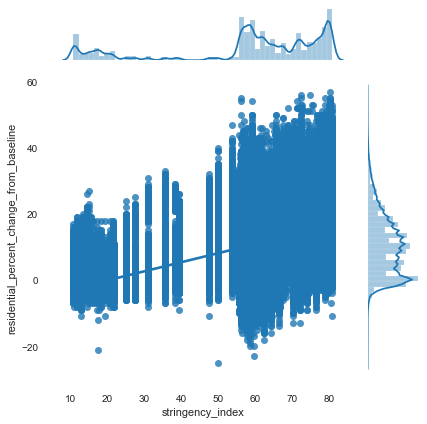

In [70]:
### Stringency index vs residential change

g = sns.jointplot(x='stringency_index', y='residential_percent_change_from_baseline', data=gov_index_means_gf,
              kind="reg", dropna=True);

#the more stringency, the more people stay home.

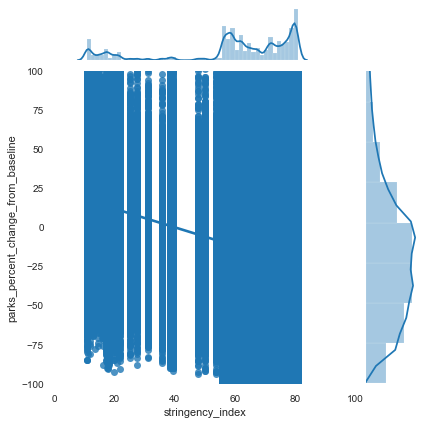

In [71]:
### Stringency index vs park change

g = sns.jointplot(x='stringency_index', y='parks_percent_change_from_baseline', data=gov_index_means_gf,
              kind="reg", xlim=(0,100), ylim=(-100,100), dropna=True);

# The relationship is dependant from time, it doesn't work

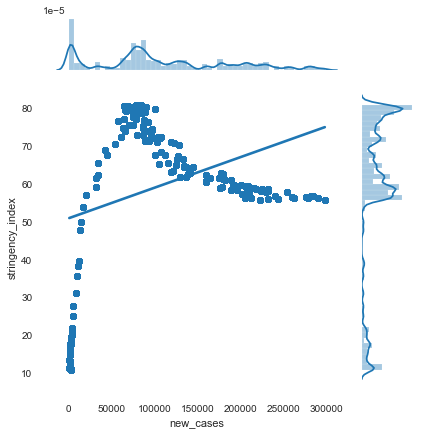

In [72]:
### Stringency index vs new cases

g = sns.jointplot(x='new_cases', y='stringency_index', data=gov_index_means_gf,
              kind="reg", dropna=True);

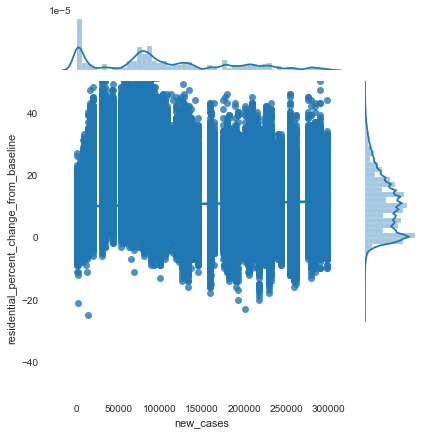

In [73]:
### New cases vs residential change

g = sns.jointplot(x='new_cases', y='residential_percent_change_from_baseline', data=gov_index_means_gf,
              kind="reg", ylim=(-50, 50), dropna=True);

## Thank you for reaching this point :)

Leo